In [1]:
# This code constructs and implements a SEIRS+ driven simulation. The simulation produces the percentage infected, 
# peak percentage hospitalized and fatality rate in office enviroments during a disease outbreak. The simulation is
# tuned to the disease parameters of the current COVID-19 pandemic but can be easily tweaked to study other (fictive)
# diseases and the effect of certain interventions on the percentage infected, peak percentage hospitalized and fatality rate
# in office or other enviroments.

In [2]:
# Import all the necessary packages

from seirsplus.models import *
from seirsplus.networks import *
#from seirsplus.sim_loops import *
from seirsplus.utilities import *
import networkx
import matplotlib.pyplot as pyplot
import seaborn
import pandas as pd
import numpy as np
import os
import math

In [3]:
# Set working directory to location where files are located
os.chdir("C:\\Users\\Quint\\Documents\\Documents\\Master Behavioral Data Science\\MasterThese\\data\\seirsplus_package_thesis\\build\\lib\\seirsplus")
# Import self adapted code of the seirsplus package
from sim_loops_altered import *

In [4]:
# Delete all dataframes
del values_df
del combined_df

NameError: name 'values_df' is not defined

In [6]:
# Create empty dataframe to store values per condition
values_df = pd.DataFrame(columns=['Network_size','Bubble_size','PCR_frequency','R','Percentage_infected', 
                                  'Peak_Percentage_Hospitalized', "Percentage_Fatality"])


In [7]:
# Create dataframe to store all values of every condition in
combined_df = pd.DataFrame()

In [8]:
# Function to introduce 1 infection per 2 months for net size = 10
# Use same proportion for bigger network sizes
def average_introduction(Network_size):
    if Network_size == 20:
        global introduction
        introduction = 1/60
    elif Network_size == 50:
        introduction = 2.5/60
    elif Network_size == 100:
        introduction = 5/60
    elif Network_size == 250:
        introduction = 12.5/60
    elif Network_size == 500:
        introduction = 25/60
    elif Network_size == 1000:
        introduction = 50/60

In [15]:
# Constructing simulation function
def simulation_covid(Network_size, Bubble_size, PCR_Frequency, R):
# Could be nice for future use of the function

# Specify loop for iterations per condition
        for i in range(10):
            
            # Calculate introduction for every itteration
            average_introduction(Network_size)
            
            # Print parameters
            print('Network size =', Network_size)
            print('Bubble size =', Bubble_size)
            print('PCR_frequency =', PCR_Frequency)
            print('R =', R)
        
        
            # Set basic parameters
            NUM_COHORTS              = Network_size//Bubble_size
            NUM_NODES_PER_COHORT     = Bubble_size
            NUM_TEAMS_PER_COHORT     = 1

            MEAN_INTRACOHORT_DEGREE  = round(0.10*Bubble_size)  # was 30
            PCT_CONTACTS_INTERCOHORT = 0.0

            N = NUM_NODES_PER_COHORT*NUM_COHORTS
            # Initial prevalence of the disease in the network
            INIT_EXPOSED = (.10*Network_size)            


            # Farz network
            # alpha = strength of common neighbor's effect on edge formation (tunes transitivity, clustering)
            # gamma = strength of degree similarity effect on edge formation (tunes assortativity)
            # beta = probability of edges formation within communities, rather than between (strength of community structure)
            # r = maximum number of communities each node can belong to
            # q = probability of a node belonging to the multiple communities
            # phi = constant added to all community sizes, higher number makes the communities more balanced in size, 1 results in power law community size distribution
            # epsilon = probability of noisy/random edges
            G_baseline, cohorts, teams = generate_workplace_contact_network(
                                             num_cohorts=NUM_COHORTS, num_nodes_per_cohort=NUM_NODES_PER_COHORT,
                                             num_teams_per_cohort=NUM_TEAMS_PER_COHORT,
                                             mean_intracohort_degree=MEAN_INTRACOHORT_DEGREE,
                                             pct_contacts_intercohort=PCT_CONTACTS_INTERCOHORT,
                                             farz_params={'alpha':5.0, 'gamma':5.0, 'beta':0.5, 'r':1, 'q':0.0, 'phi':10,
                                                          'b':0, 'epsilon':1e-6, 'directed': False, 'weighted': False})

            network_info(G_baseline, "Baseline", plot=True)

            # Here we define quarantine contact network to be an empty one (no connections)
            G_quarantine = networkx.classes.function.create_empty_copy(G_baseline)

            # Here we generate distributions of values for each parameter, thus specifying a realistic hetereogeneous population
            # For the latent period
            latentPeriod_mean, latentPeriod_coeffvar = 2.5, 0.6
            SIGMA   = 1 / gamma_dist(latentPeriod_mean, latentPeriod_coeffvar, N)
            # For the pre-symptomatic period
            presymptomaticPeriod_mean, presymptomaticPeriod_coeffvar = 3.5, 0.6
            LAMDA   = 1 / gamma_dist(presymptomaticPeriod_mean, presymptomaticPeriod_coeffvar, N)
            # Make the plot where latent period, pre-symptomatic period & total incubation period are shown
            dist_info([1/LAMDA, 1/SIGMA, 1/LAMDA+1/SIGMA], ["latent period", "pre-symptomatic period", "total incubation period"],
                      plot=True, colors=['gold', 'darkorange', 'black'], reverse_plot=True)


            # Here we generate distributions expected (a)symptomatic periods (time in symptomatic or asymptomatic state).
            symptomaticPeriod_mean, symptomaticPeriod_coeffvar = 6.5, 0.4
            GAMMA   = 1 / gamma_dist(symptomaticPeriod_mean, symptomaticPeriod_coeffvar, N)
            # The expected total infectious period for each individual is the sum of their expected pre-symptomatic and (a)symptomatic periods.
            # Specify infectious period
            infectiousPeriod = 1/LAMDA + 1/GAMMA
            # Make the plot
            dist_info([1/LAMDA, 1/GAMMA, 1/LAMDA+1/GAMMA], ["pre-symptomatic period", "(a)symptomatic period", "total infectious period"],
                      plot=True, colors=['darkorange', 'crimson', 'black'], reverse_plot=True)



            # Generate distribution of expected onset to hospitalization periods
            onsetToHospitalizationPeriod_mean, onsetToHospitalizationPeriod_coeffvar = 8.0, 0.45
            ETA     = 1 / gamma_dist(onsetToHospitalizationPeriod_mean, onsetToHospitalizationPeriod_coeffvar, N)
            # Hospitalization discharge
            hospitalizationToDischargePeriod_mean, hospitalizationToDischargePeriod_coeffvar = 14.0, 0.45
            GAMMA_H = 1 / gamma_dist(hospitalizationToDischargePeriod_mean, hospitalizationToDischargePeriod_coeffvar, N)
            # Plot
            dist_info([1/ETA, 1/GAMMA_H, 1/ETA+1/GAMMA_H], ["onset-to-hospitalization period", "hospitalization-to-discharge period", "onset-to-discharge period"],
                      plot=True, colors=['crimson', 'violet', 'black'], reverse_plot=True)

            # Generate distribution of hospitalization to death
            hospitalizationToDeathPeriod_mean, hospitalizationToDeathPeriod_coeffvar = 7.0, 0.45
            MU_H    = 1 / gamma_dist(hospitalizationToDeathPeriod_mean, hospitalizationToDeathPeriod_coeffvar, N)
            # Plot
            dist_info([1/ETA, 1/MU_H, 1/ETA+1/MU_H], ["onset-to-hospitalization period", "hospitalization-to-death period", "onset-to-death period"],
                      plot=True, colors=['crimson', 'darkgray', 'black'], reverse_plot=True)

            # Severity parameters
            # This percentage of case will progress from the pre-symptomatic state to the asymptomatic state, 
            # rather than to the symptomatic state.
            PCT_ASYMPTOMATIC = 0.308     
            # Hospitalization rate
            PCT_HOSPITALIZED = 0.043
            # Fatality rate for hospitalizations
            PCT_FATALITY = 0.05

            # Transmission parameters
            # Mean expected number of new infections by a single infectious individual
            R0_mean     = R
            # How much the mean varies, low is not much variance
            R0_coeffvar = 0.2
            # Expected number of new infections by a single infectious individual
            R0 = gamma_dist(R0_mean, R0_coeffvar, N)
            # Plot
            dist_info(R0, "Individual R0", bin_size=0.1, plot=True, colors='crimson')

            # Individuals get an Individual Tranmitability Parameter stored in BETA
            BETA = 1/infectiousPeriod * R0

            # 40% of interactions being with incidental or casual contacts outside their set of close contacts(Co-workers)
            P_GLOBALINTXN = 0.4

            # Testing, Tracing & Isolation intervention protocal measures
            INTERVENTION_START_PCT_INFECTED = 0/100
            
            # Expected number of new exogenous exposures per day
            AVERAGE_INTRODUCTIONS_PER_DAY   = introduction  #(0.00026470588*Network_size)       

            TESTING_CADENCE                 = PCR_Frequency # how often to do testing (other than self-reporting symptomatics who can get tested any day)
            PCT_TESTED_PER_DAY              = 1.0           # max daily test allotment defined as a percent of population size
            TEST_FALSENEG_RATE              = 'temporal'    # test false negative rate, will use FN rate that varies with disease time
            MAX_PCT_TESTS_FOR_SYMPTOMATICS  = 1.0           # max percent of daily test allotment to use on self-reporting symptomatics
            MAX_PCT_TESTS_FOR_TRACES        = 0.0           # max percent of daily test allotment to use on contact traces
            RANDOM_TESTING_DEGREE_BIAS      = 0             # magnitude of degree bias in random selections for testing, none here

            PCT_CONTACTS_TO_TRACE           = 0.0           # percentage of primary cases' contacts that are traced
            TRACING_LAG                     = 2             # number of cadence testing days between primary tests and tracing tests

            ISOLATION_LAG_SYMPTOMATIC       = 2             # number of days between onset of symptoms and self-isolation of symptomatics
            ISOLATION_LAG_POSITIVE          = 1             # test turn-around time (TAT): number of days between administration of test and isolation of positive cases
            ISOLATION_LAG_CONTACT           = 0             # number of days between a contact being traced and that contact self-isolating

            # Intervention compliance parameters
            # https://www.rivm.nl/documenten/onderzoek-thuisblijven-testen-en-quarantaine
            TESTING_COMPLIANCE_RATE_SYMPTOMATIC                  = 0.75
            TESTING_COMPLIANCE_RATE_TRACED                       = 0.0
            # Assume employee testing is mandatory, so 100% compliance
            TESTING_COMPLIANCE_RATE_RANDOM                       = 1.0  

            TRACING_COMPLIANCE_RATE                              = 0.0
            ISOLATION_COMPLIANCE_RATE_SYMPTOMATIC_INDIVIDUAL     = 0.0
            ISOLATION_COMPLIANCE_RATE_SYMPTOMATIC_GROUPMATE      = 0.0
            ISOLATION_COMPLIANCE_RATE_POSITIVE_INDIVIDUAL        = 1.0
            ISOLATION_COMPLIANCE_RATE_POSITIVE_GROUPMATE         = 0.0
            
            # 100% of those who have been in contact with an infected person, will go in isolation
            ISOLATION_COMPLIANCE_RATE_POSITIVE_CONTACT           = 1.0 
            ISOLATION_COMPLIANCE_RATE_POSITIVE_CONTACTGROUPMATE  = 0.0

            # Now we randomly assign true/false compliance to each individual according to the rates above. 
            # True will participate, False will not
            TESTING_COMPLIANCE_RANDOM                        = (numpy.random.rand(N) < TESTING_COMPLIANCE_RATE_RANDOM)
            TESTING_COMPLIANCE_TRACED                        = (numpy.random.rand(N) < TESTING_COMPLIANCE_RATE_TRACED)
            TESTING_COMPLIANCE_SYMPTOMATIC                   = (numpy.random.rand(N) < TESTING_COMPLIANCE_RATE_SYMPTOMATIC)

            TRACING_COMPLIANCE                               = (numpy.random.rand(N) < TRACING_COMPLIANCE_RATE)

            ISOLATION_COMPLIANCE_SYMPTOMATIC_INDIVIDUAL      = (numpy.random.rand(N) < ISOLATION_COMPLIANCE_RATE_SYMPTOMATIC_INDIVIDUAL)
            ISOLATION_COMPLIANCE_SYMPTOMATIC_GROUPMATE       = (numpy.random.rand(N) < ISOLATION_COMPLIANCE_RATE_SYMPTOMATIC_GROUPMATE)
            ISOLATION_COMPLIANCE_POSITIVE_INDIVIDUAL         = (numpy.random.rand(N) < ISOLATION_COMPLIANCE_RATE_POSITIVE_INDIVIDUAL)
            ISOLATION_COMPLIANCE_POSITIVE_GROUPMATE          = (numpy.random.rand(N) < ISOLATION_COMPLIANCE_RATE_POSITIVE_GROUPMATE)
            ISOLATION_COMPLIANCE_POSITIVE_CONTACT            = (numpy.random.rand(N) < ISOLATION_COMPLIANCE_RATE_POSITIVE_CONTACT)
            ISOLATION_COMPLIANCE_POSITIVE_CONTACTGROUPMATE   = (numpy.random.rand(N) < ISOLATION_COMPLIANCE_RATE_POSITIVE_CONTACTGROUPMATE)

            # Making the model
            model = ExtSEIRSNetworkModel(G=G_baseline, p=P_GLOBALINTXN,
                                          beta=BETA, sigma=SIGMA, lamda=LAMDA, gamma=GAMMA,
                                          gamma_asym=GAMMA, eta=ETA, gamma_H=GAMMA_H, mu_H=MU_H,
                                          a=PCT_ASYMPTOMATIC, h=PCT_HOSPITALIZED, f=PCT_FATALITY,
                                          G_Q=G_quarantine, isolation_time=14,
                                          initE=INIT_EXPOSED)
            
             #Max simulation time to 100 days
            T = 100

            # Execute the TTI simulatiom
            run_tti_sim(model, T,
                        intervention_start_pct_infected=INTERVENTION_START_PCT_INFECTED, average_introductions_per_day=AVERAGE_INTRODUCTIONS_PER_DAY,
                        testing_cadence=TESTING_CADENCE, pct_tested_per_day=PCT_TESTED_PER_DAY, test_falseneg_rate=TEST_FALSENEG_RATE,
                        testing_compliance_symptomatic=TESTING_COMPLIANCE_SYMPTOMATIC, max_pct_tests_for_symptomatics=MAX_PCT_TESTS_FOR_SYMPTOMATICS,
                        testing_compliance_traced=TESTING_COMPLIANCE_TRACED, max_pct_tests_for_traces=MAX_PCT_TESTS_FOR_TRACES,
                        testing_compliance_random=TESTING_COMPLIANCE_RANDOM, random_testing_degree_bias=RANDOM_TESTING_DEGREE_BIAS,
                        tracing_compliance=TRACING_COMPLIANCE, pct_contacts_to_trace=PCT_CONTACTS_TO_TRACE, tracing_lag=TRACING_LAG,
                        isolation_compliance_symptomatic_individual=ISOLATION_COMPLIANCE_SYMPTOMATIC_INDIVIDUAL, isolation_compliance_symptomatic_groupmate=ISOLATION_COMPLIANCE_SYMPTOMATIC_GROUPMATE,
                        isolation_compliance_positive_individual=ISOLATION_COMPLIANCE_POSITIVE_INDIVIDUAL, isolation_compliance_positive_groupmate=ISOLATION_COMPLIANCE_POSITIVE_GROUPMATE,
                        isolation_compliance_positive_contact=ISOLATION_COMPLIANCE_POSITIVE_CONTACT, isolation_compliance_positive_contactgroupmate=ISOLATION_COMPLIANCE_POSITIVE_CONTACTGROUPMATE,
                        isolation_lag_symptomatic=ISOLATION_LAG_SYMPTOMATIC, isolation_lag_positive=ISOLATION_LAG_POSITIVE,
                        isolation_groups=list(teams.values()))
            
            
            # Test for calculating percentage
            percentages = ((model.total_num_infected()[-1]+model.total_num_recovered()[-1])/model.numNodes * 100) 
            # Total percent fatality: 
            fatality = (model.numF[-1]/model.numNodes * 100)
            # Peak  pct hospitalized: 
            hospitalized = (numpy.max(model.numH)/model.numNodes * 100)

            # Store values of itteration in temporary dataframe
            values_df.loc[i, ['Network_size']] = NUM_COHORTS*NUM_NODES_PER_COHORT
            values_df.loc[i, ['Bubble_size']] = Bubble_size
            values_df.loc[i, ['PCR_frequency']] = PCR_Frequency
            values_df.loc[i, ['R']] = R
            values_df.loc[i, ['Percentage_infected']] = percentages
            values_df.loc[i, ['Peak_Percentage_Hospitalized']] = hospitalized
            values_df.loc[i, ["Percentage_Fatality"]] = fatality
                        
            #Show results
            results_summary(model)
            
            # Print to indicate next iteration is starting
            print('-----------------------------------------------------')

            # Store temporary values in combined dataframe
            global combined_df
            combined_df = combined_df.append(values_df, True)

        

        



Network size = 20
Bubble size = 5
PCR_frequency = workday
R = 2
Baseline:
Degree: mean = 0.30, std = 0.56, 95% CI = (0.00, 1.52)
        coeff var = 1.86
Assortativity:    -0.50
Clustering coeff: 0.00



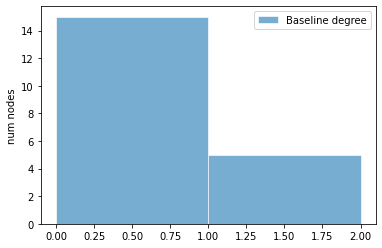

latent period:  mean = 3.10, std = 2.26, 95% CI = (1.06, 8.16)

pre-symptomatic period:  mean = 2.25, std = 1.30, 95% CI = (0.75, 5.24)

total incubation period:  mean = 5.35, std = 2.53, 95% CI = (2.23, 10.97)



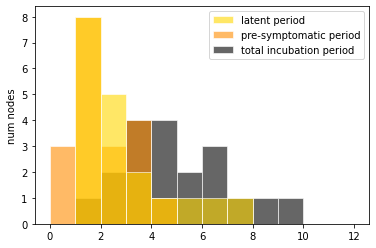

pre-symptomatic period:  mean = 3.10, std = 2.26, 95% CI = (1.06, 8.16)

(a)symptomatic period:  mean = 6.46, std = 2.34, 95% CI = (3.15, 10.77)

total infectious period:  mean = 9.56, std = 3.26, 95% CI = (4.67, 16.29)



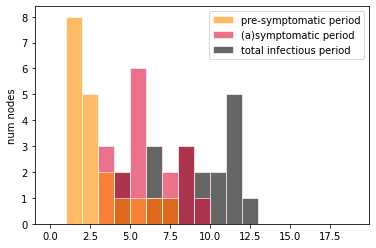

onset-to-hospitalization period:  mean = 8.45, std = 4.05, 95% CI = (3.81, 18.37)

hospitalization-to-discharge period:  mean = 12.42, std = 3.60, 95% CI = (5.00, 18.36)

onset-to-discharge period:  mean = 20.87, std = 5.17, 95% CI = (12.89, 31.62)



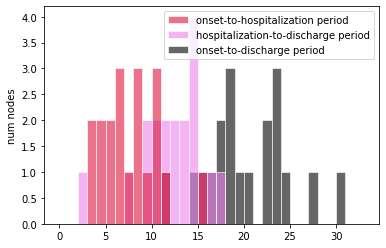

onset-to-hospitalization period:  mean = 8.45, std = 4.05, 95% CI = (3.81, 18.37)

hospitalization-to-death period:  mean = 6.73, std = 2.36, 95% CI = (3.05, 10.49)

onset-to-death period:  mean = 15.18, std = 4.75, 95% CI = (9.52, 26.05)



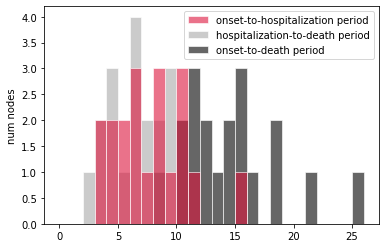

Individual R0:  mean = 2.00, std = 0.53, 95% CI = (1.20, 2.79)



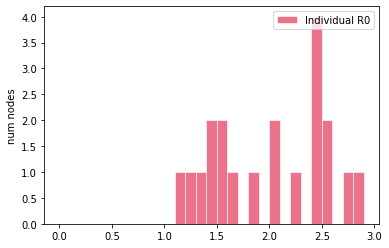

[INTERVENTIONS @ t = 0.08 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 1 positive (5.00 %) +]
	20	tested TOTAL            [+ 1 positive (5.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.76 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	19	tested randomly         [+ 1 positive (5.26 %) +]
	19	tested TOTAL            [+ 1 positive (5.26 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVE

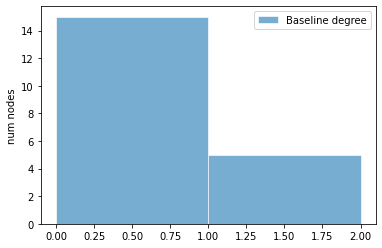

latent period:  mean = 3.25, std = 1.84, 95% CI = (1.51, 7.74)

pre-symptomatic period:  mean = 3.17, std = 2.53, 95% CI = (0.62, 9.31)

total incubation period:  mean = 6.42, std = 3.52, 95% CI = (2.91, 15.46)



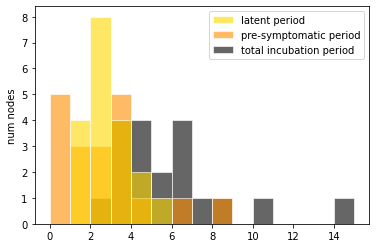

pre-symptomatic period:  mean = 3.25, std = 1.84, 95% CI = (1.51, 7.74)

(a)symptomatic period:  mean = 6.95, std = 2.66, 95% CI = (2.18, 10.22)

total infectious period:  mean = 10.20, std = 3.65, 95% CI = (4.08, 17.07)



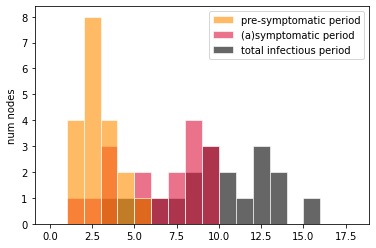

onset-to-hospitalization period:  mean = 7.11, std = 2.93, 95% CI = (3.60, 12.61)

hospitalization-to-discharge period:  mean = 12.13, std = 6.02, 95% CI = (4.87, 26.15)

onset-to-discharge period:  mean = 19.24, std = 7.72, 95% CI = (11.52, 37.61)



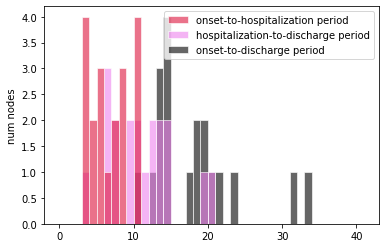

onset-to-hospitalization period:  mean = 7.11, std = 2.93, 95% CI = (3.60, 12.61)

hospitalization-to-death period:  mean = 6.75, std = 4.26, 95% CI = (3.10, 18.32)

onset-to-death period:  mean = 13.86, std = 5.95, 95% CI = (6.87, 27.40)



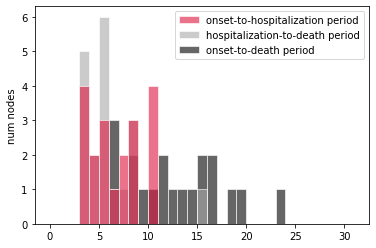

Individual R0:  mean = 1.90, std = 0.36, 95% CI = (1.38, 2.74)



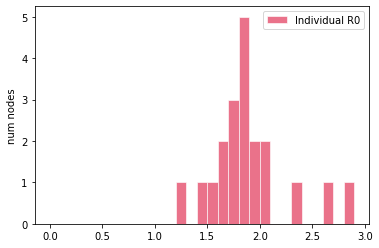

[INTERVENTIONS @ t = 1.42 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 1 positive (5.00 %) +]
	20	tested TOTAL            [+ 1 positive (5.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 5.26 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVENT

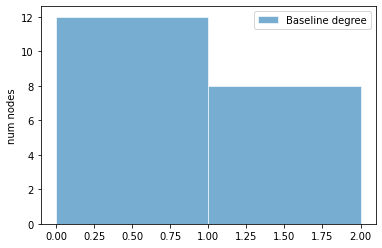

latent period:  mean = 3.68, std = 2.19, 95% CI = (0.84, 8.60)

pre-symptomatic period:  mean = 2.49, std = 1.62, 95% CI = (0.84, 5.99)

total incubation period:  mean = 6.17, std = 2.52, 95% CI = (2.43, 11.09)



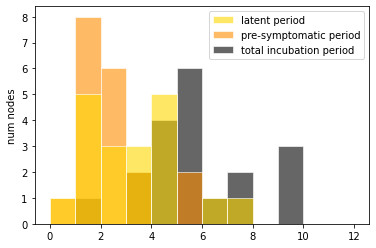

pre-symptomatic period:  mean = 3.68, std = 2.19, 95% CI = (0.84, 8.60)

(a)symptomatic period:  mean = 6.63, std = 1.89, 95% CI = (4.44, 11.09)

total infectious period:  mean = 10.30, std = 2.55, 95% CI = (6.93, 16.03)



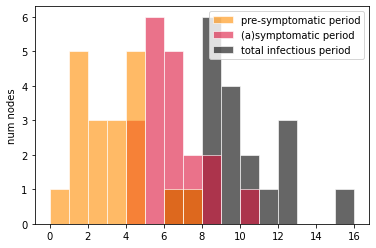

onset-to-hospitalization period:  mean = 7.94, std = 2.93, 95% CI = (3.66, 12.42)

hospitalization-to-discharge period:  mean = 15.17, std = 8.13, 95% CI = (5.80, 34.48)

onset-to-discharge period:  mean = 23.11, std = 7.93, 95% CI = (13.68, 41.00)



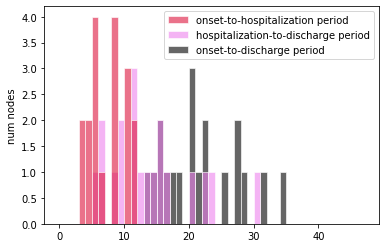

onset-to-hospitalization period:  mean = 7.94, std = 2.93, 95% CI = (3.66, 12.42)

hospitalization-to-death period:  mean = 7.36, std = 2.92, 95% CI = (2.87, 13.03)

onset-to-death period:  mean = 15.30, std = 3.92, 95% CI = (8.24, 20.57)



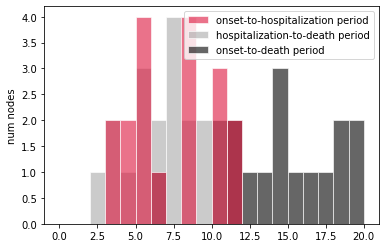

Individual R0:  mean = 1.83, std = 0.42, 95% CI = (0.98, 2.42)



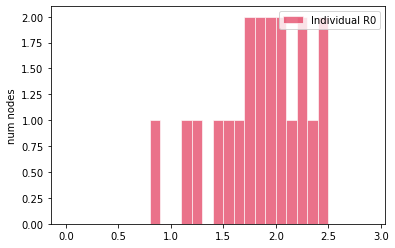

[INTERVENTIONS @ t = 2.41 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 1 positive (5.00 %) +]
	20	tested TOTAL            [+ 1 positive (5.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 4.14 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	19	tested randomly         [+ 0 positive (0.00 %) +]
	19	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVE

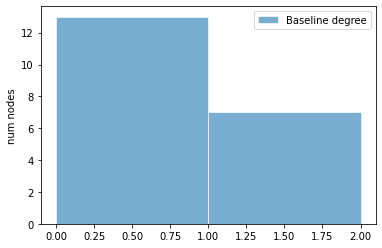

latent period:  mean = 3.78, std = 1.59, 95% CI = (1.12, 6.67)

pre-symptomatic period:  mean = 2.33, std = 1.29, 95% CI = (0.68, 5.02)

total incubation period:  mean = 6.10, std = 1.94, 95% CI = (2.50, 9.26)



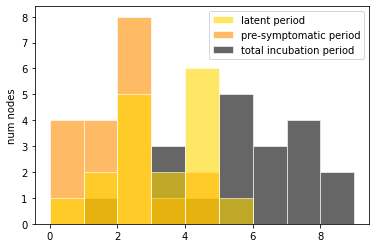

pre-symptomatic period:  mean = 3.78, std = 1.59, 95% CI = (1.12, 6.67)

(a)symptomatic period:  mean = 6.67, std = 2.39, 95% CI = (2.73, 10.93)

total infectious period:  mean = 10.45, std = 3.21, 95% CI = (5.50, 16.45)



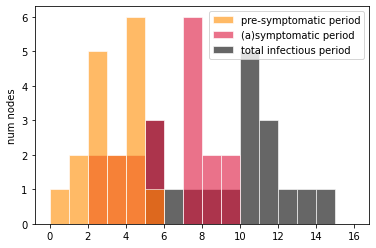

onset-to-hospitalization period:  mean = 8.12, std = 3.31, 95% CI = (2.97, 14.72)

hospitalization-to-discharge period:  mean = 12.82, std = 4.98, 95% CI = (5.66, 22.61)

onset-to-discharge period:  mean = 20.94, std = 6.12, 95% CI = (11.76, 31.96)



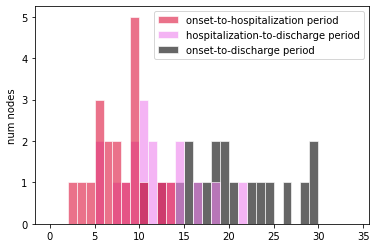

onset-to-hospitalization period:  mean = 8.12, std = 3.31, 95% CI = (2.97, 14.72)

hospitalization-to-death period:  mean = 6.46, std = 2.67, 95% CI = (2.75, 12.09)

onset-to-death period:  mean = 14.58, std = 3.92, 95% CI = (9.72, 24.39)



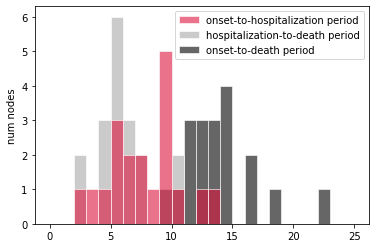

Individual R0:  mean = 2.01, std = 0.42, 95% CI = (1.18, 2.61)



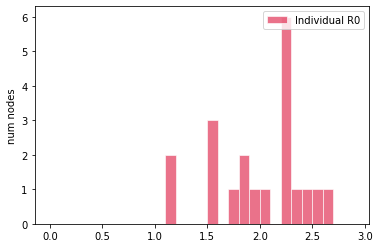

[INTERVENTIONS @ t = 0.64 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 1 positive (5.00 %) +]
	20	tested TOTAL            [+ 1 positive (5.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.59 (3 (15.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	19	tested randomly         [+ 0 positive (0.00 %) +]
	19	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVE

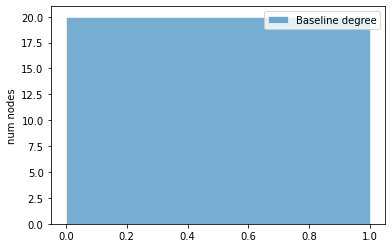

latent period:  mean = 3.96, std = 2.17, 95% CI = (0.96, 7.97)

pre-symptomatic period:  mean = 2.32, std = 1.26, 95% CI = (0.68, 5.20)

total incubation period:  mean = 6.28, std = 2.38, 95% CI = (2.58, 10.43)



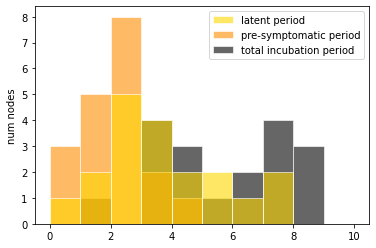

pre-symptomatic period:  mean = 3.96, std = 2.17, 95% CI = (0.96, 7.97)

(a)symptomatic period:  mean = 6.76, std = 2.46, 95% CI = (3.87, 12.69)

total infectious period:  mean = 10.73, std = 3.47, 95% CI = (5.31, 17.97)



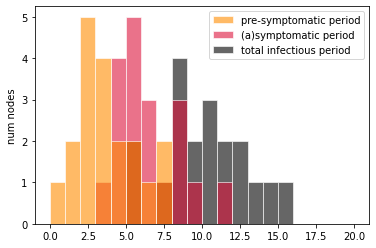

onset-to-hospitalization period:  mean = 8.61, std = 3.17, 95% CI = (4.25, 15.45)

hospitalization-to-discharge period:  mean = 12.50, std = 6.03, 95% CI = (5.37, 25.46)

onset-to-discharge period:  mean = 21.11, std = 6.46, 95% CI = (11.28, 32.78)



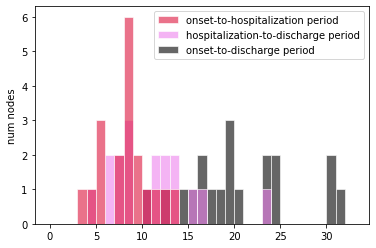

onset-to-hospitalization period:  mean = 8.61, std = 3.17, 95% CI = (4.25, 15.45)

hospitalization-to-death period:  mean = 6.20, std = 2.02, 95% CI = (3.05, 9.94)

onset-to-death period:  mean = 14.81, std = 3.75, 95% CI = (9.19, 21.71)



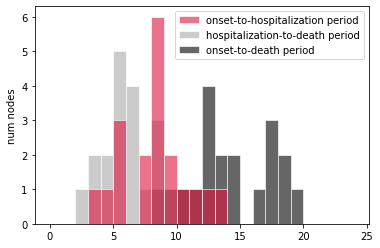

Individual R0:  mean = 2.05, std = 0.42, 95% CI = (1.29, 2.89)



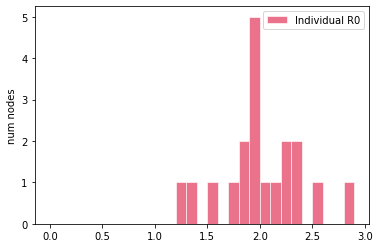

[INTERVENTIONS @ t = 0.87 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 1 positive (5.00 %) +]
	20	tested TOTAL            [+ 1 positive (5.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 2.59 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	19	tested randomly         [+ 0 positive (0.00 %) +]
	19	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVE

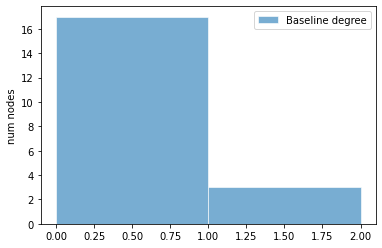

latent period:  mean = 3.37, std = 1.99, 95% CI = (1.34, 7.74)

pre-symptomatic period:  mean = 2.83, std = 1.05, 95% CI = (1.20, 4.81)

total incubation period:  mean = 6.20, std = 2.41, 95% CI = (2.88, 11.08)



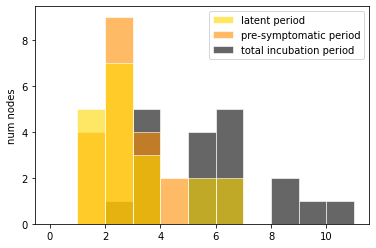

pre-symptomatic period:  mean = 3.37, std = 1.99, 95% CI = (1.34, 7.74)

(a)symptomatic period:  mean = 5.98, std = 2.20, 95% CI = (2.39, 10.34)

total infectious period:  mean = 9.34, std = 2.55, 95% CI = (4.73, 12.77)



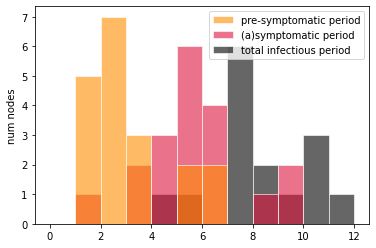

onset-to-hospitalization period:  mean = 7.94, std = 2.93, 95% CI = (2.20, 13.38)

hospitalization-to-discharge period:  mean = 13.46, std = 5.12, 95% CI = (6.60, 23.30)

onset-to-discharge period:  mean = 21.40, std = 5.82, 95% CI = (13.78, 33.23)



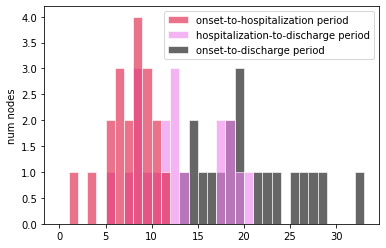

onset-to-hospitalization period:  mean = 7.94, std = 2.93, 95% CI = (2.20, 13.38)

hospitalization-to-death period:  mean = 6.83, std = 3.05, 95% CI = (2.26, 12.69)

onset-to-death period:  mean = 14.78, std = 4.16, 95% CI = (7.23, 22.02)



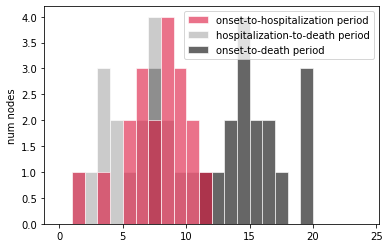

Individual R0:  mean = 2.07, std = 0.44, 95% CI = (1.51, 2.97)



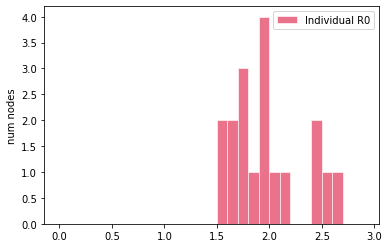

[INTERVENTIONS @ t = 3.94 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 4.09 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIO

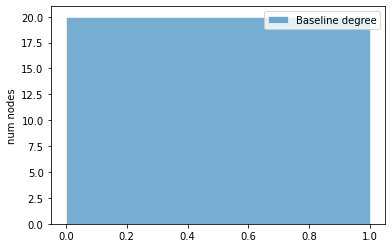

latent period:  mean = 4.26, std = 2.14, 95% CI = (1.86, 9.08)

pre-symptomatic period:  mean = 2.90, std = 1.73, 95% CI = (0.40, 5.76)

total incubation period:  mean = 7.16, std = 2.57, 95% CI = (3.36, 12.06)



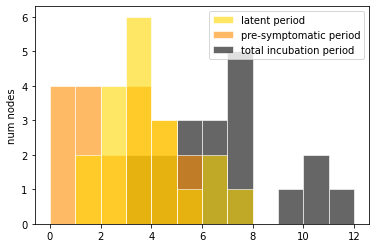

pre-symptomatic period:  mean = 4.26, std = 2.14, 95% CI = (1.86, 9.08)

(a)symptomatic period:  mean = 6.77, std = 2.49, 95% CI = (3.96, 12.04)

total infectious period:  mean = 11.04, std = 3.90, 95% CI = (7.22, 20.84)



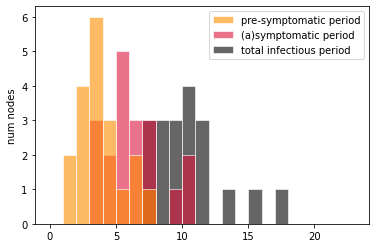

onset-to-hospitalization period:  mean = 7.84, std = 3.31, 95% CI = (2.99, 15.67)

hospitalization-to-discharge period:  mean = 13.44, std = 5.34, 95% CI = (5.48, 22.90)

onset-to-discharge period:  mean = 21.29, std = 4.98, 95% CI = (11.49, 29.39)



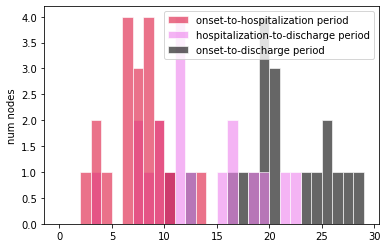

onset-to-hospitalization period:  mean = 7.84, std = 3.31, 95% CI = (2.99, 15.67)

hospitalization-to-death period:  mean = 7.88, std = 3.56, 95% CI = (2.61, 15.54)

onset-to-death period:  mean = 15.72, std = 4.69, 95% CI = (7.73, 25.28)



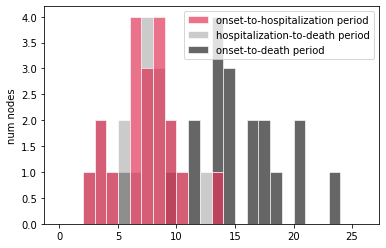

Individual R0:  mean = 1.94, std = 0.39, 95% CI = (1.41, 2.81)



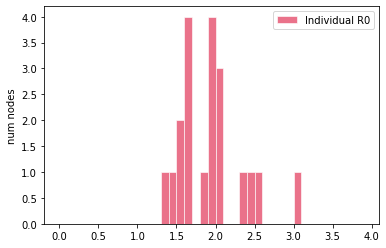

[INTERVENTIONS @ t = 0.04 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 1 positive (5.00 %) +]
	20	tested TOTAL            [+ 1 positive (5.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 4.02 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVENT

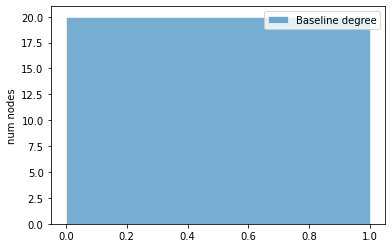

latent period:  mean = 3.95, std = 2.21, 95% CI = (1.45, 8.96)

pre-symptomatic period:  mean = 2.62, std = 1.52, 95% CI = (0.21, 5.02)

total incubation period:  mean = 6.57, std = 2.71, 95% CI = (2.65, 12.68)



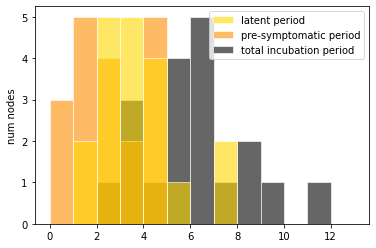

pre-symptomatic period:  mean = 3.95, std = 2.21, 95% CI = (1.45, 8.96)

(a)symptomatic period:  mean = 7.05, std = 2.79, 95% CI = (3.19, 12.63)

total infectious period:  mean = 11.00, std = 3.46, 95% CI = (6.47, 17.37)



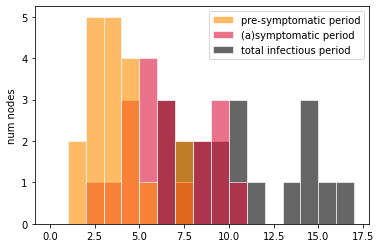

onset-to-hospitalization period:  mean = 8.28, std = 3.67, 95% CI = (2.70, 17.32)

hospitalization-to-discharge period:  mean = 14.85, std = 6.16, 95% CI = (6.25, 26.54)

onset-to-discharge period:  mean = 23.13, std = 7.13, 95% CI = (14.42, 38.92)



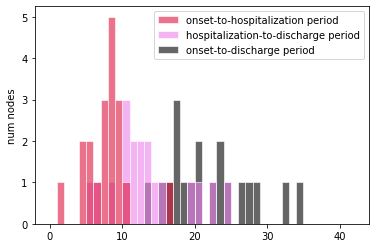

onset-to-hospitalization period:  mean = 8.28, std = 3.67, 95% CI = (2.70, 17.32)

hospitalization-to-death period:  mean = 7.15, std = 3.88, 95% CI = (3.06, 16.73)

onset-to-death period:  mean = 15.43, std = 4.87, 95% CI = (7.67, 24.74)



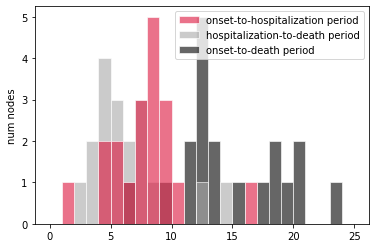

Individual R0:  mean = 1.92, std = 0.38, 95% CI = (1.32, 2.69)



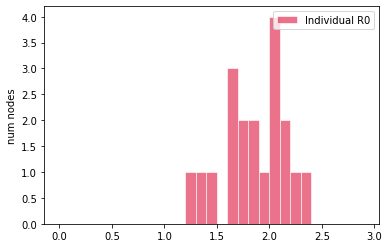

[INTERVENTIONS @ t = 0.72 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 1 positive (5.00 %) +]
	20	tested TOTAL            [+ 1 positive (5.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.52 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVENT

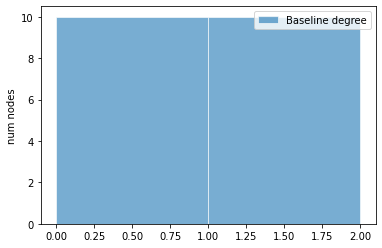

latent period:  mean = 4.44, std = 2.31, 95% CI = (1.09, 9.34)

pre-symptomatic period:  mean = 2.39, std = 1.95, 95% CI = (0.66, 7.03)

total incubation period:  mean = 6.83, std = 3.83, 95% CI = (2.32, 15.46)



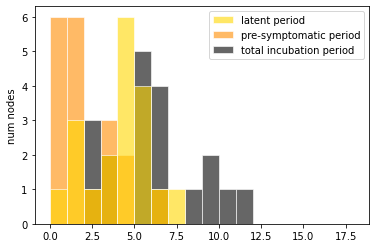

pre-symptomatic period:  mean = 4.44, std = 2.31, 95% CI = (1.09, 9.34)

(a)symptomatic period:  mean = 7.03, std = 2.85, 95% CI = (3.21, 13.28)

total infectious period:  mean = 11.47, std = 4.32, 95% CI = (6.41, 22.33)



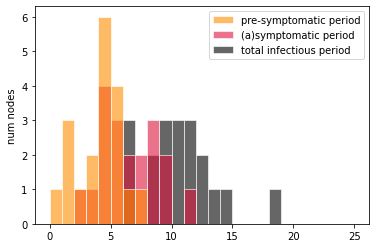

onset-to-hospitalization period:  mean = 6.57, std = 3.32, 95% CI = (2.69, 13.94)

hospitalization-to-discharge period:  mean = 13.51, std = 6.38, 95% CI = (4.72, 26.42)

onset-to-discharge period:  mean = 20.08, std = 5.96, 95% CI = (11.32, 31.18)



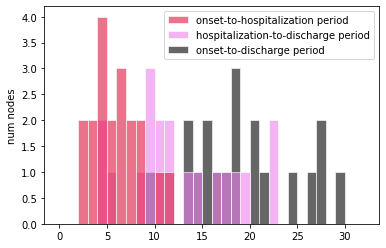

onset-to-hospitalization period:  mean = 6.57, std = 3.32, 95% CI = (2.69, 13.94)

hospitalization-to-death period:  mean = 5.99, std = 2.12, 95% CI = (2.36, 9.84)

onset-to-death period:  mean = 12.55, std = 3.91, 95% CI = (6.51, 20.43)



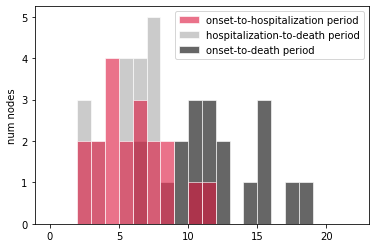

Individual R0:  mean = 2.37, std = 0.51, 95% CI = (1.61, 3.22)



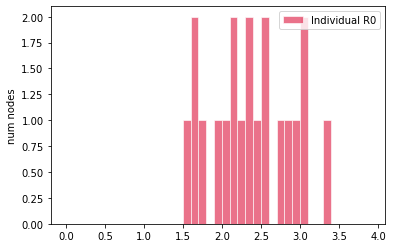

[INTERVENTIONS @ t = 0.04 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 1 positive (5.00 %) +]
	20	tested TOTAL            [+ 1 positive (5.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.23 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVENT

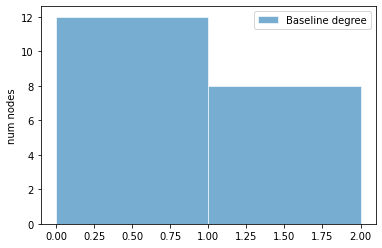

latent period:  mean = 3.34, std = 2.03, 95% CI = (0.70, 7.37)

pre-symptomatic period:  mean = 2.39, std = 1.02, 95% CI = (0.84, 3.84)

total incubation period:  mean = 5.73, std = 1.61, 95% CI = (3.94, 9.23)



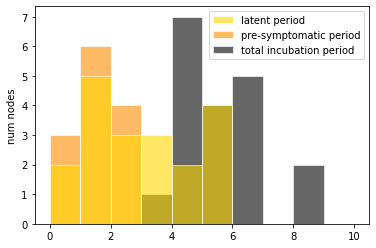

pre-symptomatic period:  mean = 3.34, std = 2.03, 95% CI = (0.70, 7.37)

(a)symptomatic period:  mean = 6.50, std = 2.68, 95% CI = (4.41, 13.16)

total infectious period:  mean = 9.84, std = 3.48, 95% CI = (6.17, 18.52)



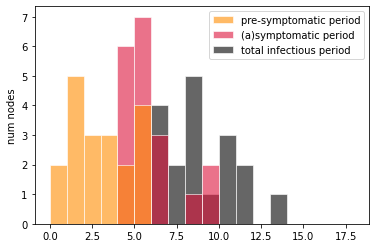

onset-to-hospitalization period:  mean = 9.01, std = 4.37, 95% CI = (2.98, 18.60)

hospitalization-to-discharge period:  mean = 16.53, std = 5.39, 95% CI = (7.09, 24.99)

onset-to-discharge period:  mean = 25.55, std = 7.61, 95% CI = (13.71, 40.95)



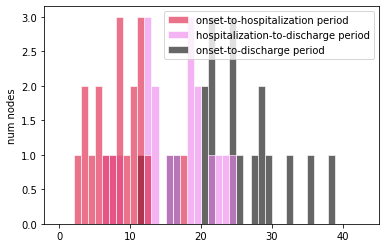

onset-to-hospitalization period:  mean = 9.01, std = 4.37, 95% CI = (2.98, 18.60)

hospitalization-to-death period:  mean = 6.59, std = 2.84, 95% CI = (2.25, 11.14)

onset-to-death period:  mean = 15.60, std = 4.30, 95% CI = (8.88, 24.06)



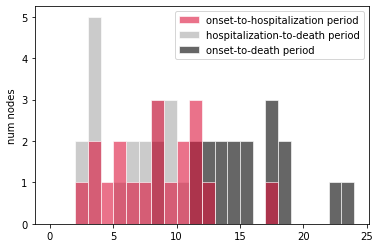

Individual R0:  mean = 1.99, std = 0.41, 95% CI = (1.46, 2.92)



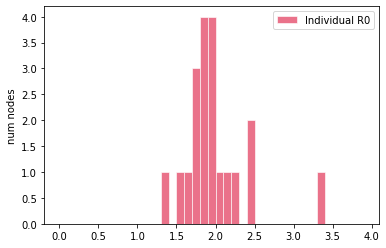

[INTERVENTIONS @ t = 0.18 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 0 positive (0.00 %) +]
	20	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.24 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENT

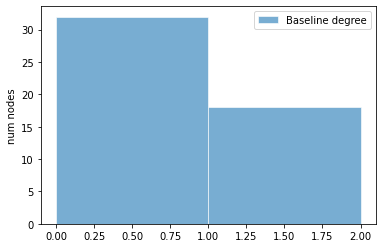

latent period:  mean = 3.59, std = 1.94, 95% CI = (0.79, 8.06)

pre-symptomatic period:  mean = 2.54, std = 1.38, 95% CI = (0.65, 5.87)

total incubation period:  mean = 6.13, std = 2.13, 95% CI = (2.54, 10.29)



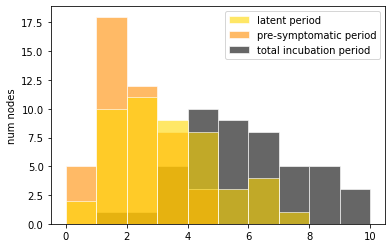

pre-symptomatic period:  mean = 3.59, std = 1.94, 95% CI = (0.79, 8.06)

(a)symptomatic period:  mean = 6.07, std = 2.40, 95% CI = (1.91, 11.84)

total infectious period:  mean = 9.66, std = 2.96, 95% CI = (5.25, 15.93)



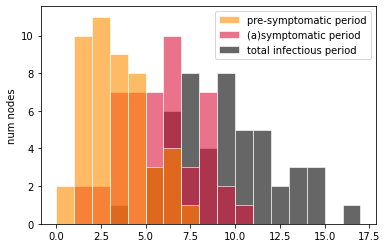

onset-to-hospitalization period:  mean = 8.12, std = 3.37, 95% CI = (3.01, 14.04)

hospitalization-to-discharge period:  mean = 14.37, std = 4.43, 95% CI = (6.17, 22.12)

onset-to-discharge period:  mean = 22.49, std = 5.15, 95% CI = (13.23, 32.73)



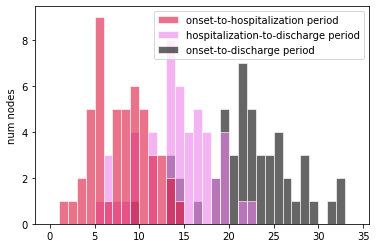

onset-to-hospitalization period:  mean = 8.12, std = 3.37, 95% CI = (3.01, 14.04)

hospitalization-to-death period:  mean = 6.91, std = 3.27, 95% CI = (2.51, 13.19)

onset-to-death period:  mean = 15.04, std = 4.46, 95% CI = (7.25, 23.19)



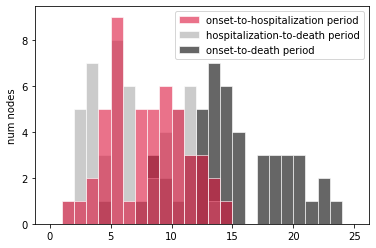

Individual R0:  mean = 2.16, std = 0.36, 95% CI = (1.53, 2.79)



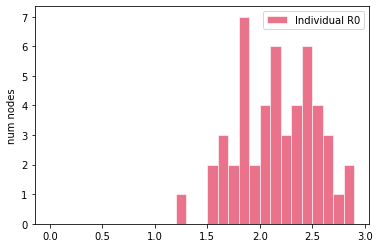

[INTERVENTIONS @ t = 0.40 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.06 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	49	tested randomly         [+ 1 positive (2.04 %) +]
	49	tested TOTAL            [+ 1 positive (2.04 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVE

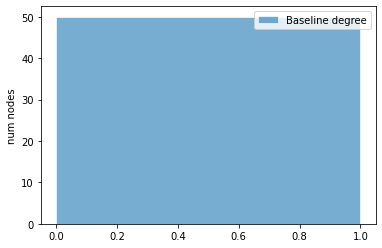

latent period:  mean = 3.66, std = 2.18, 95% CI = (0.67, 8.33)

pre-symptomatic period:  mean = 2.55, std = 1.51, 95% CI = (0.60, 5.60)

total incubation period:  mean = 6.20, std = 2.76, 95% CI = (2.10, 11.54)



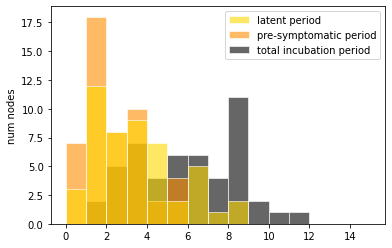

pre-symptomatic period:  mean = 3.66, std = 2.18, 95% CI = (0.67, 8.33)

(a)symptomatic period:  mean = 6.25, std = 2.62, 95% CI = (2.89, 11.65)

total infectious period:  mean = 9.91, std = 3.53, 95% CI = (4.63, 17.20)



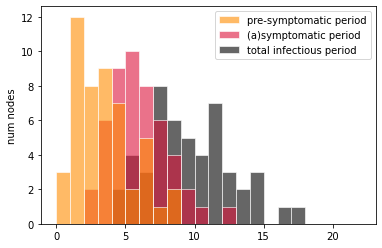

onset-to-hospitalization period:  mean = 8.21, std = 3.73, 95% CI = (3.42, 16.16)

hospitalization-to-discharge period:  mean = 14.19, std = 6.45, 95% CI = (4.91, 30.13)

onset-to-discharge period:  mean = 22.40, std = 7.79, 95% CI = (12.77, 41.07)



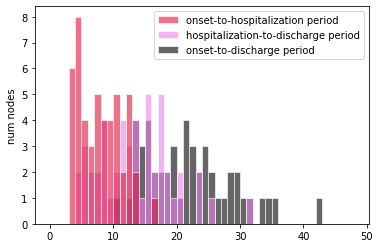

onset-to-hospitalization period:  mean = 8.21, std = 3.73, 95% CI = (3.42, 16.16)

hospitalization-to-death period:  mean = 6.79, std = 3.34, 95% CI = (1.93, 14.88)

onset-to-death period:  mean = 15.00, std = 5.19, 95% CI = (7.14, 24.92)



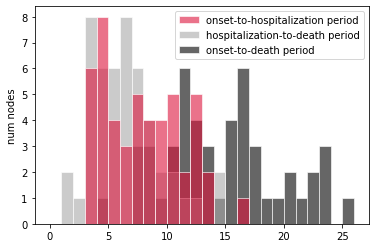

Individual R0:  mean = 1.98, std = 0.36, 95% CI = (1.39, 2.68)



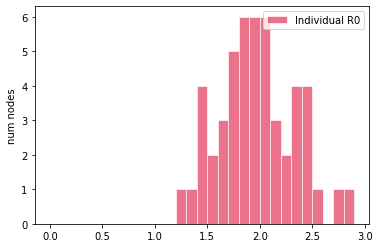

[INTERVENTIONS @ t = 0.15 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 0 positive (0.00 %) +]
	50	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.08 (5 (10.00%) infected)]
	2	tested due to symptoms  [+ 1 positive (50.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	48	tested randomly         [+ 1 positive (2.08 %) +]
	50	tested TOTAL            [+ 2 positive (4.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	2 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERV

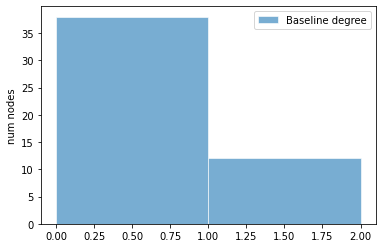

latent period:  mean = 4.18, std = 2.29, 95% CI = (1.11, 10.28)

pre-symptomatic period:  mean = 2.64, std = 1.64, 95% CI = (0.73, 7.02)

total incubation period:  mean = 6.82, std = 2.73, 95% CI = (2.59, 13.27)



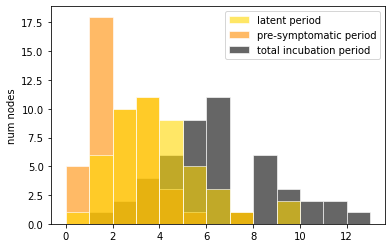

pre-symptomatic period:  mean = 4.18, std = 2.29, 95% CI = (1.11, 10.28)

(a)symptomatic period:  mean = 6.67, std = 2.42, 95% CI = (3.21, 12.07)

total infectious period:  mean = 10.85, std = 3.24, 95% CI = (6.52, 16.67)



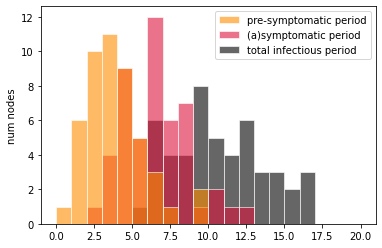

onset-to-hospitalization period:  mean = 8.50, std = 3.25, 95% CI = (3.23, 14.10)

hospitalization-to-discharge period:  mean = 13.56, std = 6.28, 95% CI = (5.43, 28.56)

onset-to-discharge period:  mean = 22.06, std = 7.15, 95% CI = (12.27, 36.80)



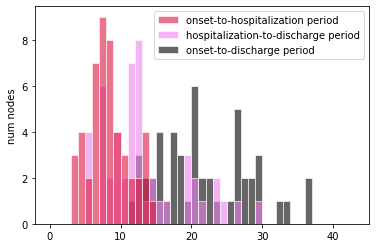

onset-to-hospitalization period:  mean = 8.50, std = 3.25, 95% CI = (3.23, 14.10)

hospitalization-to-death period:  mean = 7.37, std = 2.96, 95% CI = (3.13, 15.17)

onset-to-death period:  mean = 15.87, std = 4.06, 95% CI = (10.00, 26.26)



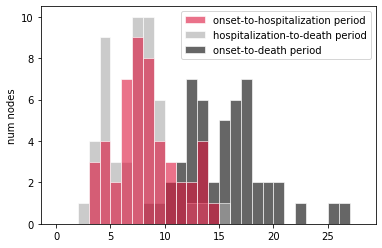

Individual R0:  mean = 2.06, std = 0.44, 95% CI = (1.37, 2.93)



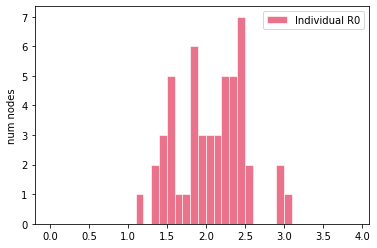

[INTERVENTIONS @ t = 0.03 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.35 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	49	tested randomly         [+ 2 positive (4.08 %) +]
	49	tested TOTAL            [+ 2 positive (4.08 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	2 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVE

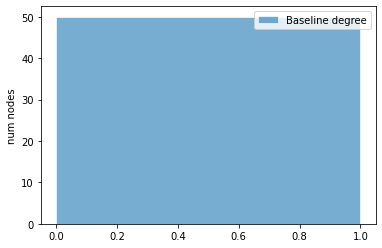

latent period:  mean = 3.68, std = 2.14, 95% CI = (0.86, 8.42)

pre-symptomatic period:  mean = 2.24, std = 1.33, 95% CI = (0.41, 4.64)

total incubation period:  mean = 5.92, std = 2.69, 95% CI = (2.21, 11.85)



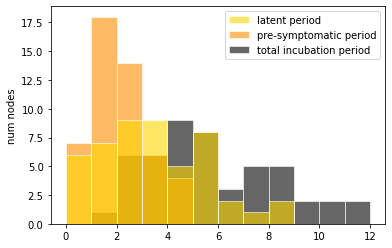

pre-symptomatic period:  mean = 3.68, std = 2.14, 95% CI = (0.86, 8.42)

(a)symptomatic period:  mean = 5.81, std = 2.30, 95% CI = (2.21, 10.20)

total infectious period:  mean = 9.49, std = 2.49, 95% CI = (5.24, 13.86)



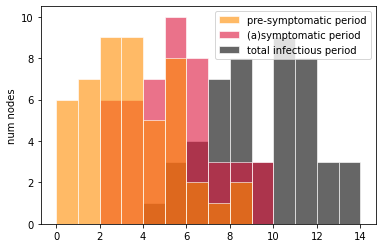

onset-to-hospitalization period:  mean = 7.02, std = 3.03, 95% CI = (2.76, 12.59)

hospitalization-to-discharge period:  mean = 13.26, std = 5.78, 95% CI = (5.72, 26.23)

onset-to-discharge period:  mean = 20.28, std = 6.09, 95% CI = (10.55, 31.71)



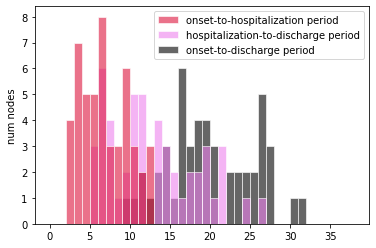

onset-to-hospitalization period:  mean = 7.02, std = 3.03, 95% CI = (2.76, 12.59)

hospitalization-to-death period:  mean = 6.80, std = 3.27, 95% CI = (2.61, 13.20)

onset-to-death period:  mean = 13.82, std = 4.71, 95% CI = (6.42, 24.25)



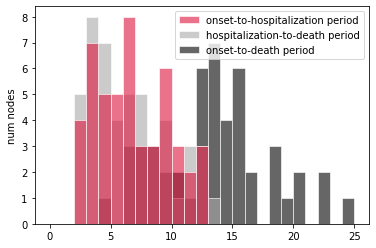

Individual R0:  mean = 1.94, std = 0.39, 95% CI = (1.27, 2.63)



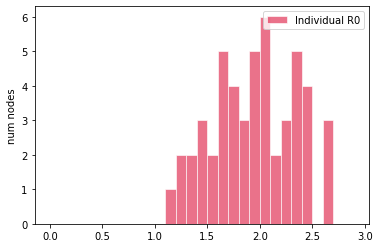

[INTERVENTIONS @ t = 0.29 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.97 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	49	tested randomly         [+ 2 positive (4.08 %) +]
	49	tested TOTAL            [+ 2 positive (4.08 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	2 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVE

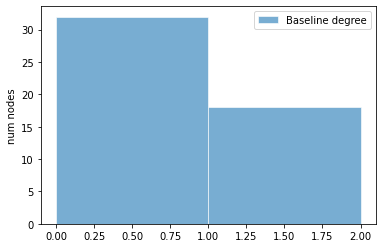

latent period:  mean = 3.19, std = 1.95, 95% CI = (0.89, 7.39)

pre-symptomatic period:  mean = 2.42, std = 1.41, 95% CI = (0.32, 5.63)

total incubation period:  mean = 5.61, std = 2.31, 95% CI = (2.35, 10.39)



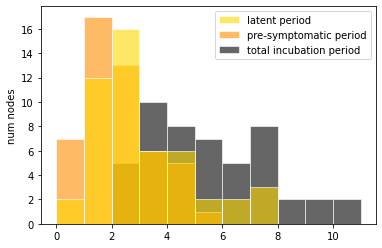

pre-symptomatic period:  mean = 3.19, std = 1.95, 95% CI = (0.89, 7.39)

(a)symptomatic period:  mean = 6.60, std = 3.47, 95% CI = (2.43, 15.30)

total infectious period:  mean = 9.79, std = 3.84, 95% CI = (4.45, 17.50)



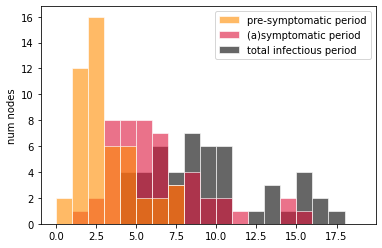

onset-to-hospitalization period:  mean = 8.50, std = 3.24, 95% CI = (3.63, 15.54)

hospitalization-to-discharge period:  mean = 14.10, std = 5.41, 95% CI = (5.18, 24.21)

onset-to-discharge period:  mean = 22.60, std = 6.51, 95% CI = (10.98, 35.29)



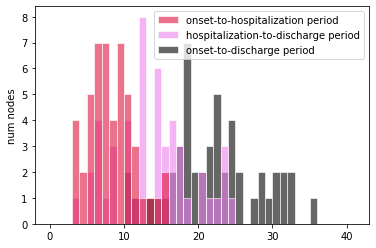

onset-to-hospitalization period:  mean = 8.50, std = 3.24, 95% CI = (3.63, 15.54)

hospitalization-to-death period:  mean = 7.65, std = 3.56, 95% CI = (2.76, 14.94)

onset-to-death period:  mean = 16.15, std = 4.34, 95% CI = (7.59, 24.27)



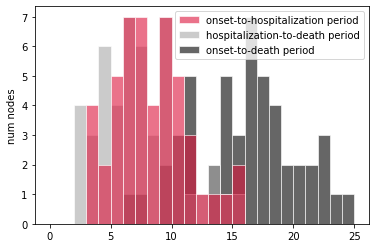

Individual R0:  mean = 1.95, std = 0.38, 95% CI = (1.31, 2.89)



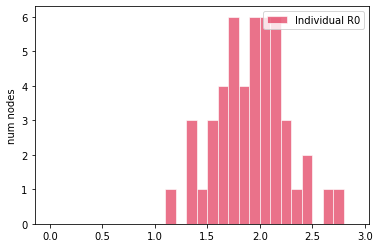

[INTERVENTIONS @ t = 0.06 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.01 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	49	tested randomly         [+ 2 positive (4.08 %) +]
	49	tested TOTAL            [+ 2 positive (4.08 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	2 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVE

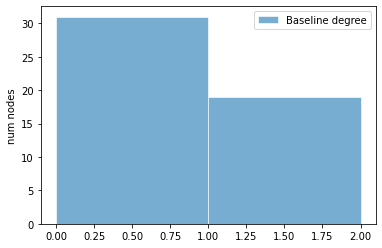

latent period:  mean = 3.69, std = 2.13, 95% CI = (0.75, 8.42)

pre-symptomatic period:  mean = 2.69, std = 1.64, 95% CI = (0.83, 6.88)

total incubation period:  mean = 6.37, std = 2.68, 95% CI = (2.24, 12.71)



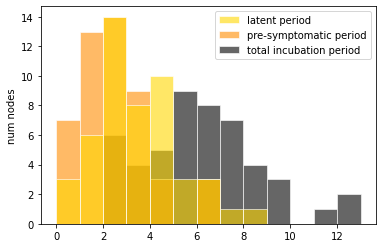

pre-symptomatic period:  mean = 3.69, std = 2.13, 95% CI = (0.75, 8.42)

(a)symptomatic period:  mean = 7.03, std = 2.75, 95% CI = (2.57, 12.24)

total infectious period:  mean = 10.72, std = 3.62, 95% CI = (4.22, 17.42)



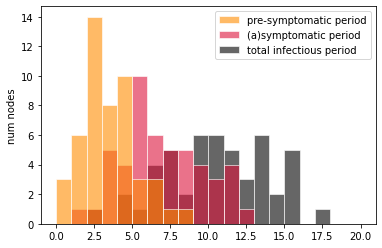

onset-to-hospitalization period:  mean = 8.31, std = 3.51, 95% CI = (3.37, 15.56)

hospitalization-to-discharge period:  mean = 14.65, std = 6.21, 95% CI = (5.84, 29.21)

onset-to-discharge period:  mean = 22.96, std = 7.16, 95% CI = (11.30, 35.19)



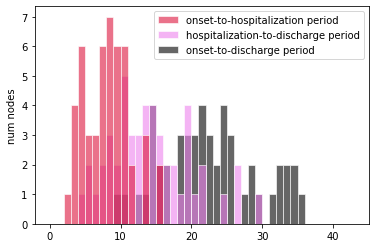

onset-to-hospitalization period:  mean = 8.31, std = 3.51, 95% CI = (3.37, 15.56)

hospitalization-to-death period:  mean = 6.66, std = 3.32, 95% CI = (2.69, 14.10)

onset-to-death period:  mean = 14.97, std = 5.13, 95% CI = (8.39, 24.08)



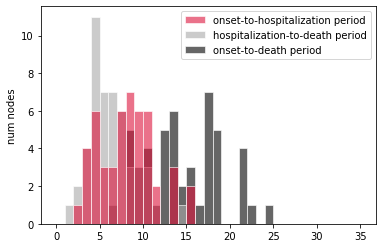

Individual R0:  mean = 2.07, std = 0.40, 95% CI = (1.46, 2.78)



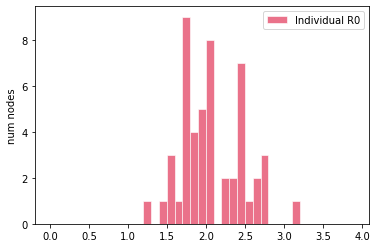

[INTERVENTIONS @ t = 0.58 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 2.57 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVENT

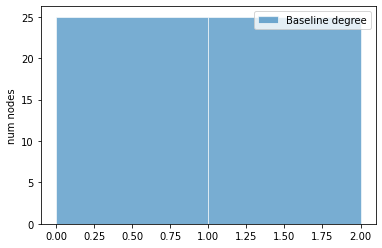

latent period:  mean = 4.00, std = 2.11, 95% CI = (0.86, 8.79)

pre-symptomatic period:  mean = 2.26, std = 1.36, 95% CI = (0.33, 5.13)

total incubation period:  mean = 6.26, std = 2.41, 95% CI = (2.16, 11.26)



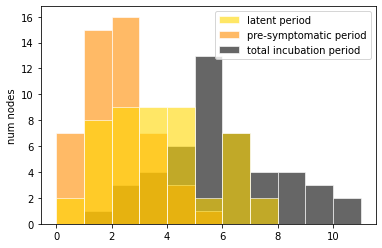

pre-symptomatic period:  mean = 4.00, std = 2.11, 95% CI = (0.86, 8.79)

(a)symptomatic period:  mean = 6.29, std = 2.65, 95% CI = (3.11, 12.69)

total infectious period:  mean = 10.28, std = 3.78, 95% CI = (5.02, 20.05)



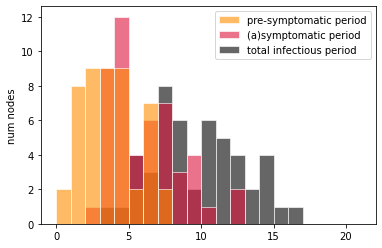

onset-to-hospitalization period:  mean = 8.07, std = 3.13, 95% CI = (3.40, 13.93)

hospitalization-to-discharge period:  mean = 14.88, std = 6.83, 95% CI = (6.73, 27.44)

onset-to-discharge period:  mean = 22.96, std = 7.71, 95% CI = (13.20, 37.46)



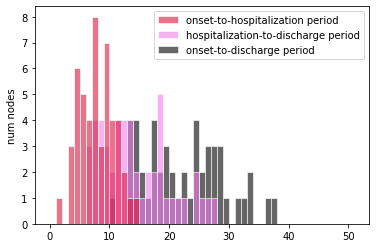

onset-to-hospitalization period:  mean = 8.07, std = 3.13, 95% CI = (3.40, 13.93)

hospitalization-to-death period:  mean = 6.83, std = 3.17, 95% CI = (2.36, 14.46)

onset-to-death period:  mean = 14.91, std = 4.42, 95% CI = (7.27, 23.31)



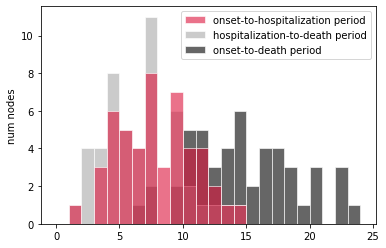

Individual R0:  mean = 1.91, std = 0.33, 95% CI = (1.19, 2.52)



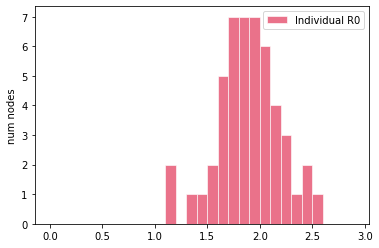

[INTERVENTIONS @ t = 0.25 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.17 (6 (12.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVENT

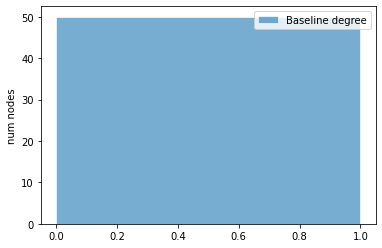

latent period:  mean = 3.20, std = 2.05, 95% CI = (0.51, 8.21)

pre-symptomatic period:  mean = 2.57, std = 1.57, 95% CI = (0.68, 5.91)

total incubation period:  mean = 5.77, std = 2.23, 95% CI = (1.59, 10.14)



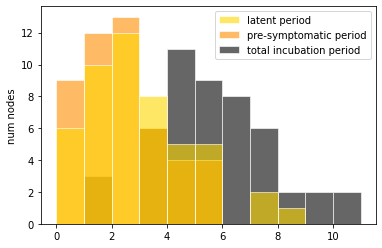

pre-symptomatic period:  mean = 3.20, std = 2.05, 95% CI = (0.51, 8.21)

(a)symptomatic period:  mean = 6.91, std = 2.98, 95% CI = (2.55, 12.37)

total infectious period:  mean = 10.12, std = 3.77, 95% CI = (3.60, 16.77)



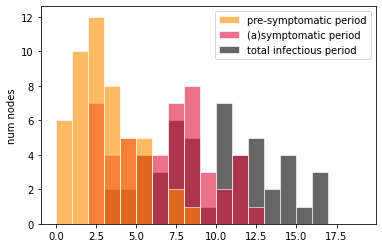

onset-to-hospitalization period:  mean = 8.09, std = 3.49, 95% CI = (3.36, 15.45)

hospitalization-to-discharge period:  mean = 13.89, std = 5.66, 95% CI = (6.56, 25.97)

onset-to-discharge period:  mean = 21.98, std = 6.81, 95% CI = (12.61, 39.42)



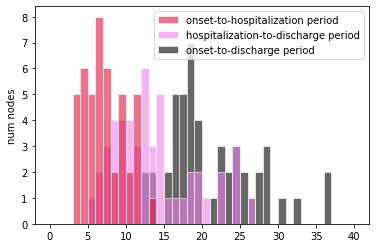

onset-to-hospitalization period:  mean = 8.09, std = 3.49, 95% CI = (3.36, 15.45)

hospitalization-to-death period:  mean = 6.28, std = 2.38, 95% CI = (2.60, 12.20)

onset-to-death period:  mean = 14.37, std = 4.25, 95% CI = (8.73, 22.40)



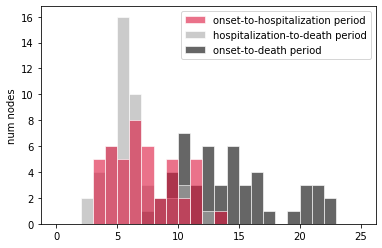

Individual R0:  mean = 1.98, std = 0.42, 95% CI = (1.28, 2.80)



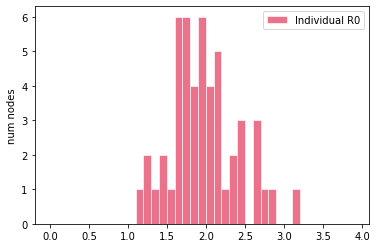

[INTERVENTIONS @ t = 1.26 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 2.16 (5 (10.00%) infected)]
	1	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	1	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIO

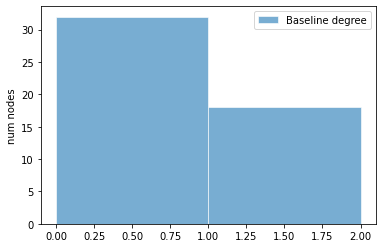

latent period:  mean = 3.37, std = 1.54, 95% CI = (0.90, 6.42)

pre-symptomatic period:  mean = 2.14, std = 0.84, 95% CI = (0.71, 3.76)

total incubation period:  mean = 5.51, std = 1.78, 95% CI = (2.75, 8.84)



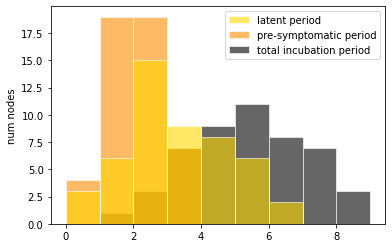

pre-symptomatic period:  mean = 3.37, std = 1.54, 95% CI = (0.90, 6.42)

(a)symptomatic period:  mean = 6.26, std = 2.73, 95% CI = (2.38, 12.57)

total infectious period:  mean = 9.63, std = 2.89, 95% CI = (4.81, 14.98)



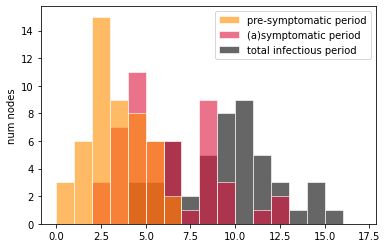

onset-to-hospitalization period:  mean = 8.28, std = 3.55, 95% CI = (3.20, 17.57)

hospitalization-to-discharge period:  mean = 14.32, std = 6.54, 95% CI = (2.98, 26.51)

onset-to-discharge period:  mean = 22.60, std = 7.13, 95% CI = (11.16, 37.46)



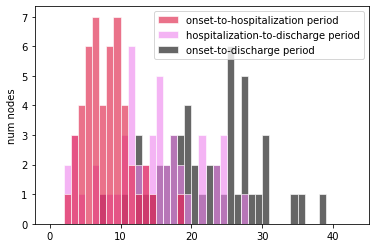

onset-to-hospitalization period:  mean = 8.28, std = 3.55, 95% CI = (3.20, 17.57)

hospitalization-to-death period:  mean = 7.03, std = 3.68, 95% CI = (2.02, 14.90)

onset-to-death period:  mean = 15.32, std = 4.91, 95% CI = (7.21, 25.18)



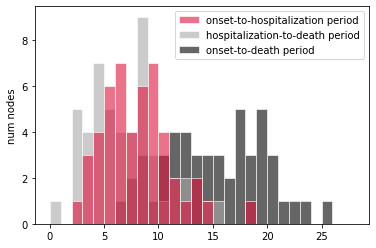

Individual R0:  mean = 1.95, std = 0.38, 95% CI = (1.35, 2.54)



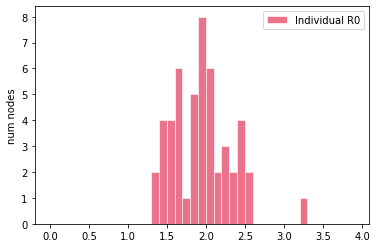

[INTERVENTIONS @ t = 0.10 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 2.23 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVENT

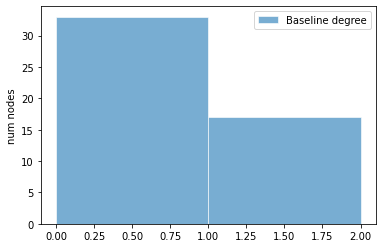

latent period:  mean = 3.52, std = 2.14, 95% CI = (0.79, 8.48)

pre-symptomatic period:  mean = 2.32, std = 1.51, 95% CI = (0.35, 5.85)

total incubation period:  mean = 5.84, std = 2.73, 95% CI = (2.37, 12.45)



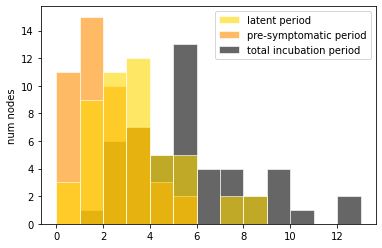

pre-symptomatic period:  mean = 3.52, std = 2.14, 95% CI = (0.79, 8.48)

(a)symptomatic period:  mean = 6.26, std = 2.27, 95% CI = (2.64, 10.98)

total infectious period:  mean = 9.78, std = 3.15, 95% CI = (4.86, 15.97)



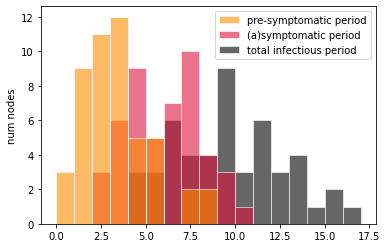

onset-to-hospitalization period:  mean = 8.04, std = 3.80, 95% CI = (2.35, 17.77)

hospitalization-to-discharge period:  mean = 14.75, std = 7.76, 95% CI = (5.40, 34.49)

onset-to-discharge period:  mean = 22.79, std = 7.54, 95% CI = (13.21, 40.28)



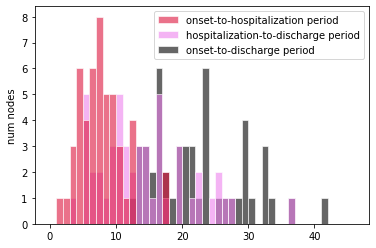

onset-to-hospitalization period:  mean = 8.04, std = 3.80, 95% CI = (2.35, 17.77)

hospitalization-to-death period:  mean = 7.24, std = 2.96, 95% CI = (2.46, 13.14)

onset-to-death period:  mean = 15.27, std = 4.47, 95% CI = (6.61, 24.56)



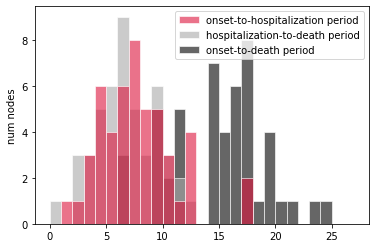

Individual R0:  mean = 1.84, std = 0.31, 95% CI = (1.43, 2.53)



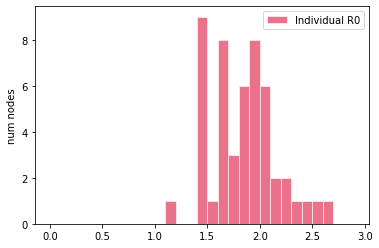

[INTERVENTIONS @ t = 1.39 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 2.87 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIO

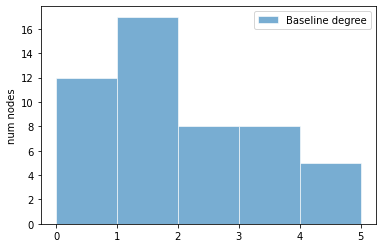

latent period:  mean = 3.53, std = 2.06, 95% CI = (0.48, 7.79)

pre-symptomatic period:  mean = 2.28, std = 1.43, 95% CI = (0.43, 5.30)

total incubation period:  mean = 5.81, std = 2.61, 95% CI = (1.75, 10.95)



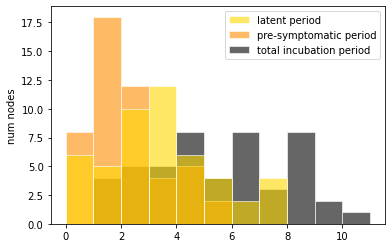

pre-symptomatic period:  mean = 3.53, std = 2.06, 95% CI = (0.48, 7.79)

(a)symptomatic period:  mean = 6.53, std = 2.85, 95% CI = (2.31, 11.96)

total infectious period:  mean = 10.06, std = 3.86, 95% CI = (4.85, 18.27)



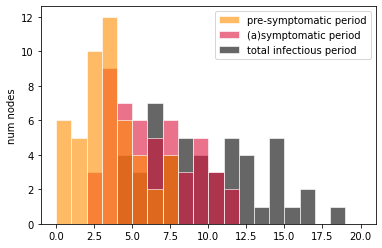

onset-to-hospitalization period:  mean = 7.14, std = 3.54, 95% CI = (2.77, 16.65)

hospitalization-to-discharge period:  mean = 13.09, std = 4.48, 95% CI = (5.23, 22.76)

onset-to-discharge period:  mean = 20.23, std = 5.16, 95% CI = (11.26, 30.18)



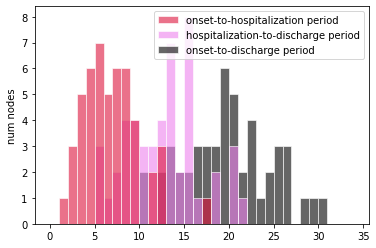

onset-to-hospitalization period:  mean = 7.14, std = 3.54, 95% CI = (2.77, 16.65)

hospitalization-to-death period:  mean = 7.12, std = 3.28, 95% CI = (1.87, 14.50)

onset-to-death period:  mean = 14.26, std = 5.29, 95% CI = (6.04, 27.41)



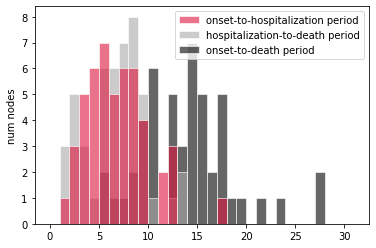

Individual R0:  mean = 2.01, std = 0.43, 95% CI = (1.32, 2.99)



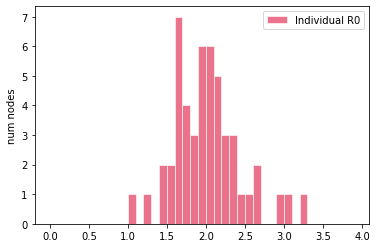

[INTERVENTIONS @ t = 0.18 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 0 positive (0.00 %) +]
	50	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.15 (5 (10.00%) infected)]
	2	tested due to symptoms  [+ 2 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	48	tested randomly         [+ 2 positive (4.17 %) +]
	50	tested TOTAL            [+ 4 positive (8.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	4 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTER

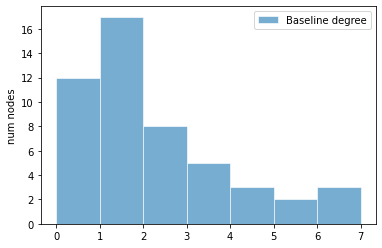

latent period:  mean = 3.74, std = 1.91, 95% CI = (0.70, 6.59)

pre-symptomatic period:  mean = 2.84, std = 1.81, 95% CI = (0.43, 7.03)

total incubation period:  mean = 6.58, std = 2.87, 95% CI = (2.36, 13.58)



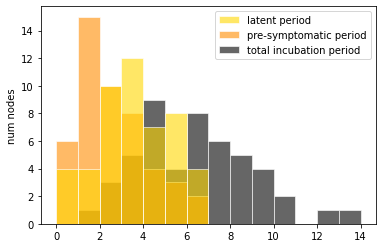

pre-symptomatic period:  mean = 3.74, std = 1.91, 95% CI = (0.70, 6.59)

(a)symptomatic period:  mean = 6.84, std = 2.30, 95% CI = (3.19, 11.03)

total infectious period:  mean = 10.59, std = 2.89, 95% CI = (6.09, 16.70)



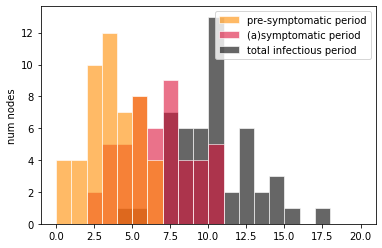

onset-to-hospitalization period:  mean = 8.49, std = 4.20, 95% CI = (3.13, 17.52)

hospitalization-to-discharge period:  mean = 13.71, std = 5.74, 95% CI = (4.99, 25.33)

onset-to-discharge period:  mean = 22.19, std = 6.89, 95% CI = (10.44, 33.50)



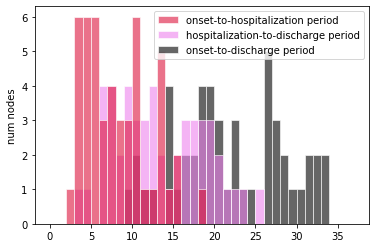

onset-to-hospitalization period:  mean = 8.49, std = 4.20, 95% CI = (3.13, 17.52)

hospitalization-to-death period:  mean = 6.42, std = 2.70, 95% CI = (2.18, 12.53)

onset-to-death period:  mean = 14.91, std = 5.06, 95% CI = (7.67, 24.80)



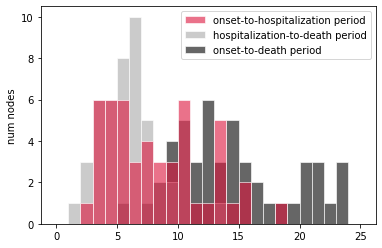

Individual R0:  mean = 2.05, std = 0.38, 95% CI = (1.40, 2.73)



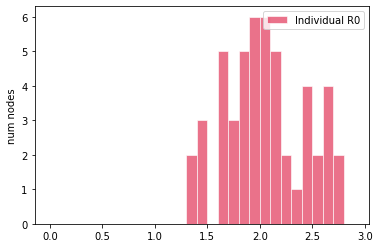

[INTERVENTIONS @ t = 0.18 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 4.59 (6 (12.00%) infected)]
	1	tested due to symptoms  [+ 1 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	49	tested randomly         [+ 1 positive (2.04 %) +]
	50	tested TOTAL            [+ 2 positive (4.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	2 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTER

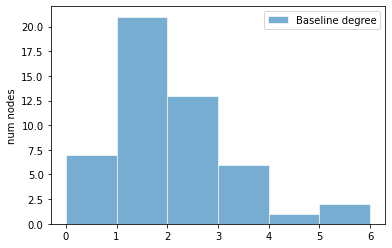

latent period:  mean = 3.51, std = 1.71, 95% CI = (0.79, 6.92)

pre-symptomatic period:  mean = 2.24, std = 1.13, 95% CI = (0.28, 4.42)

total incubation period:  mean = 5.75, std = 2.16, 95% CI = (2.34, 9.41)



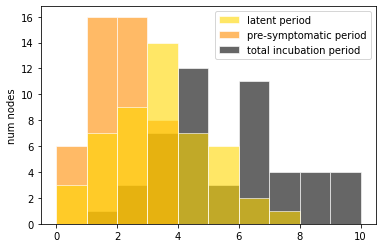

pre-symptomatic period:  mean = 3.51, std = 1.71, 95% CI = (0.79, 6.92)

(a)symptomatic period:  mean = 6.58, std = 2.44, 95% CI = (2.39, 11.31)

total infectious period:  mean = 10.09, std = 3.22, 95% CI = (4.78, 16.82)



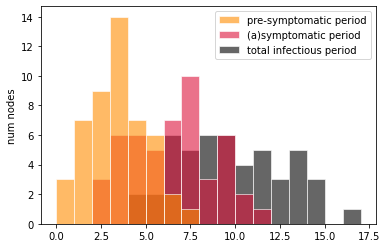

onset-to-hospitalization period:  mean = 8.55, std = 3.86, 95% CI = (3.43, 16.35)

hospitalization-to-discharge period:  mean = 13.49, std = 5.64, 95% CI = (5.02, 26.21)

onset-to-discharge period:  mean = 22.04, std = 6.80, 95% CI = (11.21, 36.68)



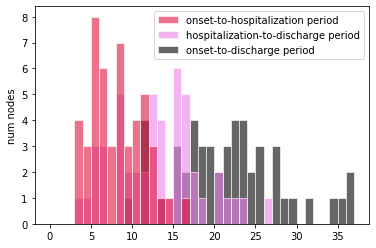

onset-to-hospitalization period:  mean = 8.55, std = 3.86, 95% CI = (3.43, 16.35)

hospitalization-to-death period:  mean = 6.89, std = 3.01, 95% CI = (2.27, 12.88)

onset-to-death period:  mean = 15.44, std = 4.77, 95% CI = (9.26, 25.33)



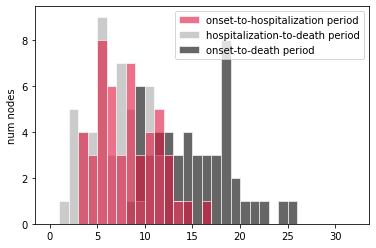

Individual R0:  mean = 1.97, std = 0.38, 95% CI = (1.39, 2.71)



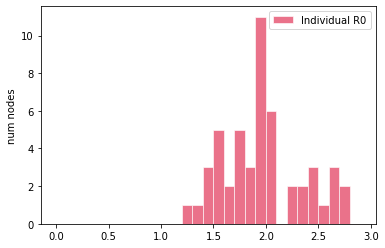

[INTERVENTIONS @ t = 0.00 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 0 positive (0.00 %) +]
	50	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.84 (6 (12.00%) infected)]
	1	tested due to symptoms  [+ 1 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	49	tested randomly         [+ 2 positive (4.08 %) +]
	50	tested TOTAL            [+ 3 positive (6.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	3 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTER

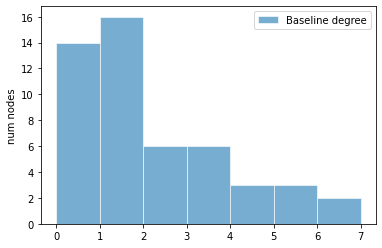

latent period:  mean = 3.69, std = 1.76, 95% CI = (0.57, 7.41)

pre-symptomatic period:  mean = 2.45, std = 1.32, 95% CI = (0.65, 5.35)

total incubation period:  mean = 6.15, std = 2.52, 95% CI = (2.21, 11.63)



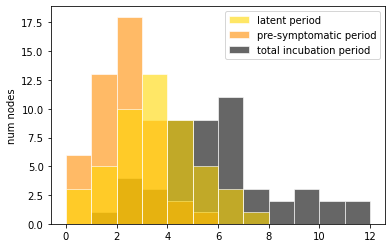

pre-symptomatic period:  mean = 3.69, std = 1.76, 95% CI = (0.57, 7.41)

(a)symptomatic period:  mean = 6.46, std = 2.49, 95% CI = (2.52, 11.57)

total infectious period:  mean = 10.15, std = 3.08, 95% CI = (4.78, 15.71)



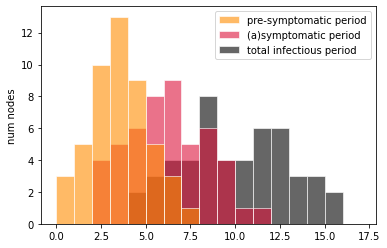

onset-to-hospitalization period:  mean = 7.62, std = 3.40, 95% CI = (3.00, 15.20)

hospitalization-to-discharge period:  mean = 13.58, std = 4.72, 95% CI = (5.02, 22.42)

onset-to-discharge period:  mean = 21.20, std = 5.82, 95% CI = (11.73, 33.00)



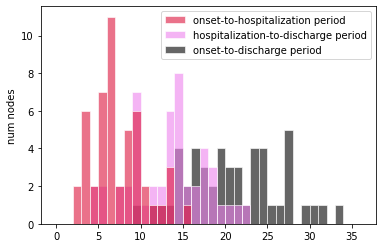

onset-to-hospitalization period:  mean = 7.62, std = 3.40, 95% CI = (3.00, 15.20)

hospitalization-to-death period:  mean = 6.76, std = 2.84, 95% CI = (2.39, 13.16)

onset-to-death period:  mean = 14.37, std = 5.08, 95% CI = (8.05, 27.11)



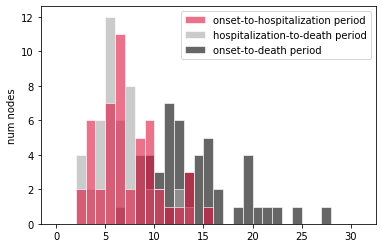

Individual R0:  mean = 1.95, std = 0.39, 95% CI = (1.32, 2.85)



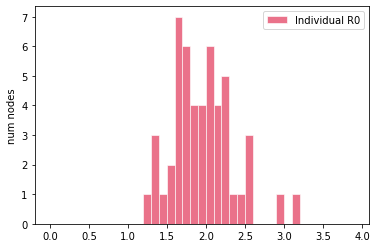

[INTERVENTIONS @ t = 0.51 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 0 positive (0.00 %) +]
	50	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.14 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVE

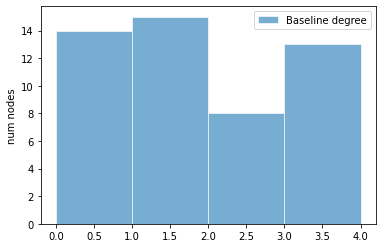

latent period:  mean = 3.26, std = 1.75, 95% CI = (0.80, 7.39)

pre-symptomatic period:  mean = 2.45, std = 1.63, 95% CI = (0.35, 6.55)

total incubation period:  mean = 5.71, std = 2.33, 95% CI = (1.85, 10.27)



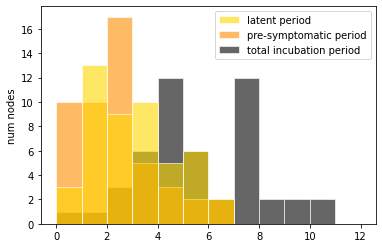

pre-symptomatic period:  mean = 3.26, std = 1.75, 95% CI = (0.80, 7.39)

(a)symptomatic period:  mean = 7.05, std = 2.92, 95% CI = (3.06, 14.40)

total infectious period:  mean = 10.31, std = 3.29, 95% CI = (5.55, 17.56)



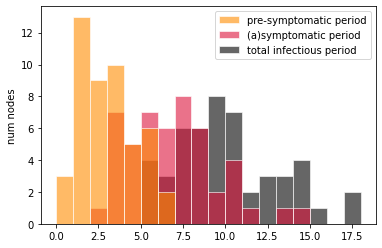

onset-to-hospitalization period:  mean = 7.20, std = 2.80, 95% CI = (2.10, 12.41)

hospitalization-to-discharge period:  mean = 14.19, std = 6.26, 95% CI = (3.06, 27.89)

onset-to-discharge period:  mean = 21.39, std = 7.47, 95% CI = (8.48, 35.41)



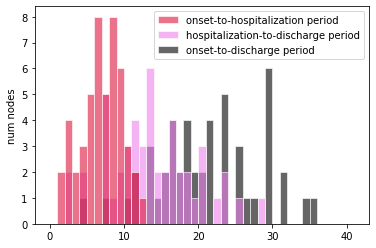

onset-to-hospitalization period:  mean = 7.20, std = 2.80, 95% CI = (2.10, 12.41)

hospitalization-to-death period:  mean = 7.31, std = 2.99, 95% CI = (3.10, 14.68)

onset-to-death period:  mean = 14.51, std = 4.34, 95% CI = (5.91, 22.51)



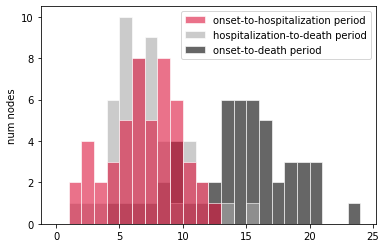

Individual R0:  mean = 1.98, std = 0.42, 95% CI = (1.29, 2.83)



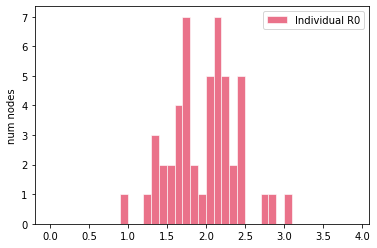

[INTERVENTIONS @ t = 0.29 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 0 positive (0.00 %) +]
	50	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.22 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 2 positive (4.00 %) +]
	50	tested TOTAL            [+ 2 positive (4.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	2 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVE

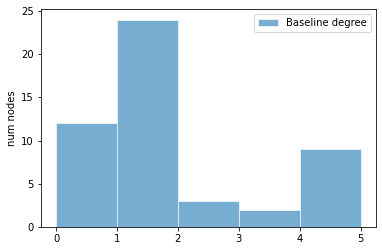

latent period:  mean = 3.81, std = 2.26, 95% CI = (0.55, 8.71)

pre-symptomatic period:  mean = 2.08, std = 1.19, 95% CI = (0.55, 4.26)

total incubation period:  mean = 5.88, std = 2.62, 95% CI = (2.81, 12.17)



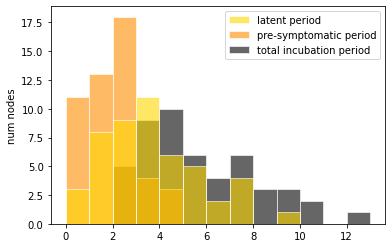

pre-symptomatic period:  mean = 3.81, std = 2.26, 95% CI = (0.55, 8.71)

(a)symptomatic period:  mean = 6.73, std = 2.76, 95% CI = (2.38, 12.51)

total infectious period:  mean = 10.54, std = 3.43, 95% CI = (5.49, 18.13)



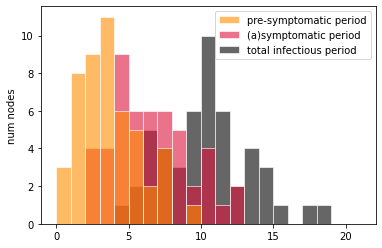

onset-to-hospitalization period:  mean = 7.44, std = 3.40, 95% CI = (2.86, 15.19)

hospitalization-to-discharge period:  mean = 13.60, std = 5.28, 95% CI = (5.49, 23.80)

onset-to-discharge period:  mean = 21.03, std = 6.28, 95% CI = (10.59, 37.83)



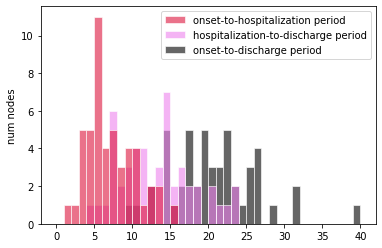

onset-to-hospitalization period:  mean = 7.44, std = 3.40, 95% CI = (2.86, 15.19)

hospitalization-to-death period:  mean = 7.64, std = 3.10, 95% CI = (2.43, 12.49)

onset-to-death period:  mean = 15.08, std = 4.14, 95% CI = (8.47, 22.05)



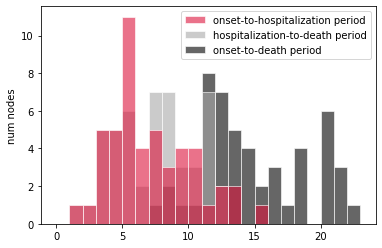

Individual R0:  mean = 2.11, std = 0.43, 95% CI = (1.39, 2.95)



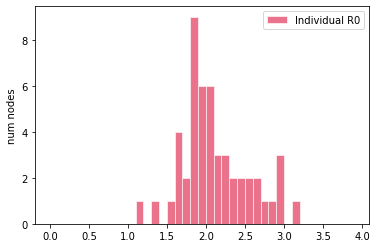

[INTERVENTIONS @ t = 0.03 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.07 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVENT

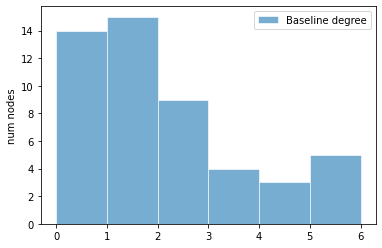

latent period:  mean = 3.25, std = 2.21, 95% CI = (0.60, 7.35)

pre-symptomatic period:  mean = 2.45, std = 1.25, 95% CI = (0.57, 5.65)

total incubation period:  mean = 5.70, std = 2.63, 95% CI = (1.92, 12.03)



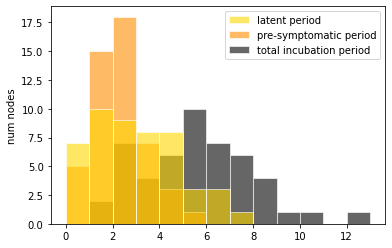

pre-symptomatic period:  mean = 3.25, std = 2.21, 95% CI = (0.60, 7.35)

(a)symptomatic period:  mean = 6.48, std = 2.19, 95% CI = (3.50, 11.60)

total infectious period:  mean = 9.73, std = 2.81, 95% CI = (5.31, 15.07)



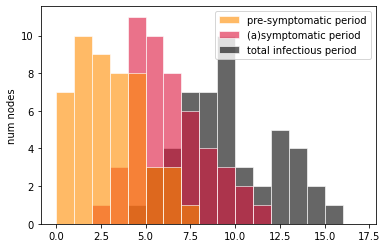

onset-to-hospitalization period:  mean = 8.04, std = 3.76, 95% CI = (2.31, 17.27)

hospitalization-to-discharge period:  mean = 14.49, std = 7.64, 95% CI = (4.57, 29.60)

onset-to-discharge period:  mean = 22.53, std = 8.20, 95% CI = (9.73, 36.35)



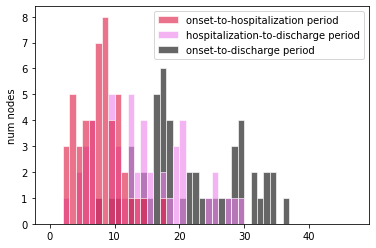

onset-to-hospitalization period:  mean = 8.04, std = 3.76, 95% CI = (2.31, 17.27)

hospitalization-to-death period:  mean = 6.80, std = 3.12, 95% CI = (1.91, 13.32)

onset-to-death period:  mean = 14.84, std = 5.13, 95% CI = (5.21, 25.24)



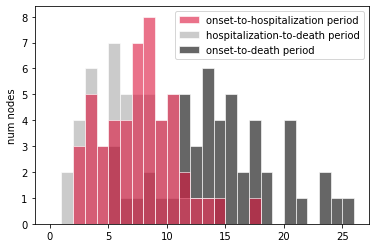

Individual R0:  mean = 2.00, std = 0.45, 95% CI = (1.14, 2.90)



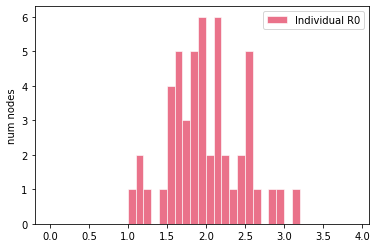

[INTERVENTIONS @ t = 0.43 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.32 (7 (14.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVENT

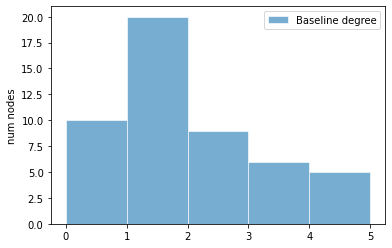

latent period:  mean = 3.87, std = 2.22, 95% CI = (0.53, 8.00)

pre-symptomatic period:  mean = 2.34, std = 1.38, 95% CI = (0.23, 5.29)

total incubation period:  mean = 6.21, std = 2.58, 95% CI = (2.10, 11.09)



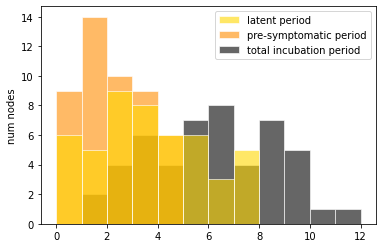

pre-symptomatic period:  mean = 3.87, std = 2.22, 95% CI = (0.53, 8.00)

(a)symptomatic period:  mean = 6.60, std = 2.55, 95% CI = (3.10, 10.91)

total infectious period:  mean = 10.46, std = 3.42, 95% CI = (4.94, 18.54)



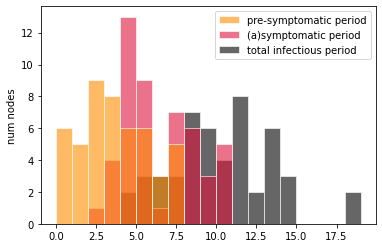

onset-to-hospitalization period:  mean = 8.67, std = 3.44, 95% CI = (3.73, 17.03)

hospitalization-to-discharge period:  mean = 15.20, std = 6.14, 95% CI = (5.16, 26.63)

onset-to-discharge period:  mean = 23.87, std = 6.67, 95% CI = (12.87, 37.27)



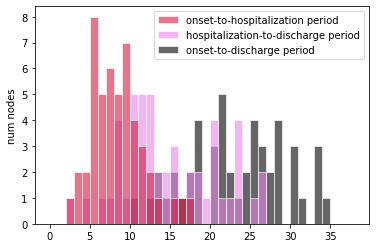

onset-to-hospitalization period:  mean = 8.67, std = 3.44, 95% CI = (3.73, 17.03)

hospitalization-to-death period:  mean = 6.85, std = 2.79, 95% CI = (2.20, 12.98)

onset-to-death period:  mean = 15.52, std = 4.43, 95% CI = (8.36, 23.89)



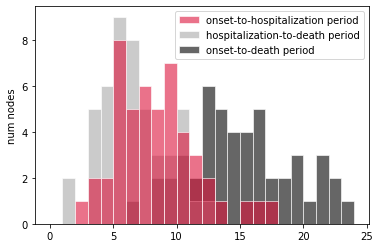

Individual R0:  mean = 2.02, std = 0.46, 95% CI = (1.21, 3.19)



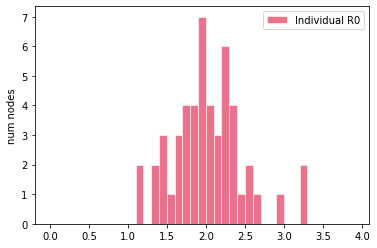

[INTERVENTIONS @ t = 0.13 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.11 (6 (12.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVENT

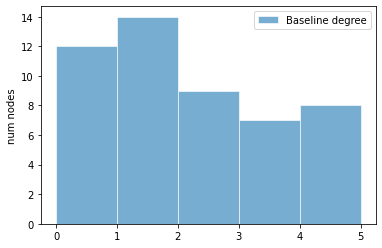

latent period:  mean = 3.65, std = 2.20, 95% CI = (0.46, 9.24)

pre-symptomatic period:  mean = 2.60, std = 1.54, 95% CI = (0.46, 6.82)

total incubation period:  mean = 6.25, std = 2.28, 95% CI = (2.77, 11.11)



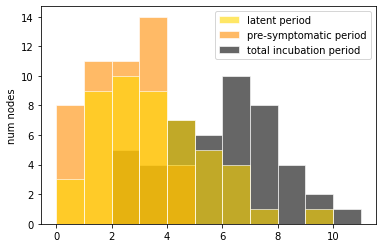

pre-symptomatic period:  mean = 3.65, std = 2.20, 95% CI = (0.46, 9.24)

(a)symptomatic period:  mean = 7.20, std = 2.75, 95% CI = (2.69, 13.89)

total infectious period:  mean = 10.85, std = 3.48, 95% CI = (5.46, 17.99)



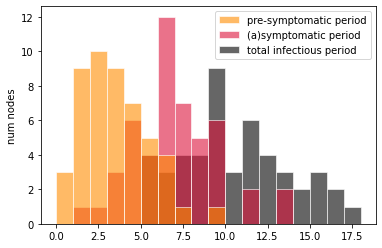

onset-to-hospitalization period:  mean = 7.83, std = 2.81, 95% CI = (3.14, 13.33)

hospitalization-to-discharge period:  mean = 13.88, std = 6.23, 95% CI = (4.54, 27.06)

onset-to-discharge period:  mean = 21.71, std = 6.07, 95% CI = (12.22, 32.11)



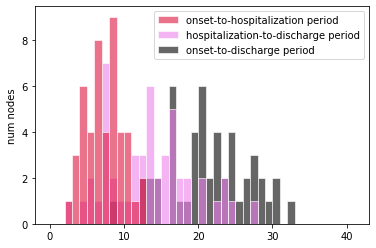

onset-to-hospitalization period:  mean = 7.83, std = 2.81, 95% CI = (3.14, 13.33)

hospitalization-to-death period:  mean = 6.64, std = 2.64, 95% CI = (3.15, 12.77)

onset-to-death period:  mean = 14.47, std = 4.10, 95% CI = (7.68, 25.24)



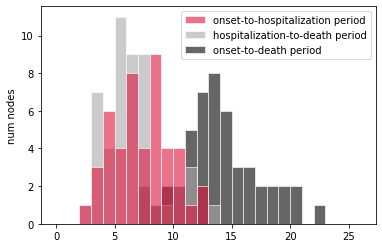

Individual R0:  mean = 2.00, std = 0.37, 95% CI = (1.25, 2.60)



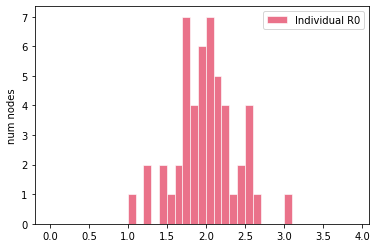

[INTERVENTIONS @ t = 0.32 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.03 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVENT

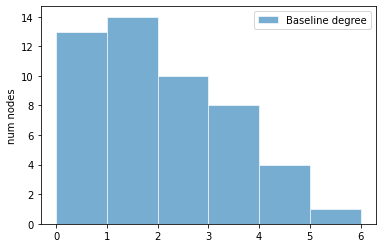

latent period:  mean = 3.23, std = 2.03, 95% CI = (0.54, 7.58)

pre-symptomatic period:  mean = 2.70, std = 1.70, 95% CI = (0.78, 6.51)

total incubation period:  mean = 5.93, std = 2.98, 95% CI = (2.18, 11.75)



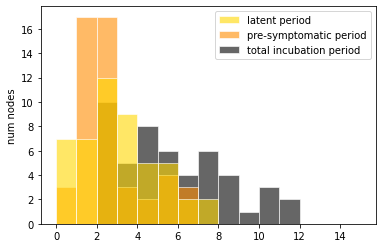

pre-symptomatic period:  mean = 3.23, std = 2.03, 95% CI = (0.54, 7.58)

(a)symptomatic period:  mean = 6.07, std = 1.85, 95% CI = (3.11, 9.54)

total infectious period:  mean = 9.30, std = 2.72, 95% CI = (4.43, 14.46)



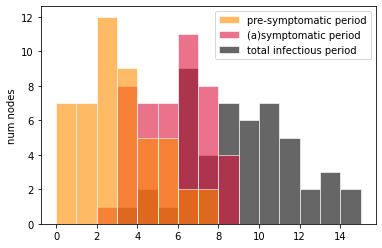

onset-to-hospitalization period:  mean = 8.41, std = 3.77, 95% CI = (3.84, 17.45)

hospitalization-to-discharge period:  mean = 13.79, std = 6.68, 95% CI = (4.08, 30.52)

onset-to-discharge period:  mean = 22.19, std = 7.79, 95% CI = (10.65, 36.00)



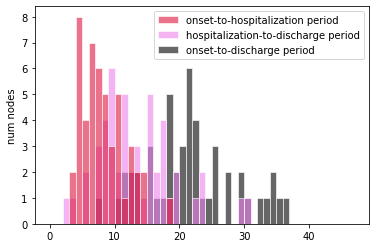

onset-to-hospitalization period:  mean = 8.41, std = 3.77, 95% CI = (3.84, 17.45)

hospitalization-to-death period:  mean = 6.54, std = 2.65, 95% CI = (2.34, 12.64)

onset-to-death period:  mean = 14.94, std = 4.74, 95% CI = (8.25, 25.28)



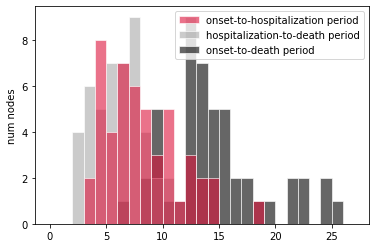

Individual R0:  mean = 2.02, std = 0.36, 95% CI = (1.37, 2.79)



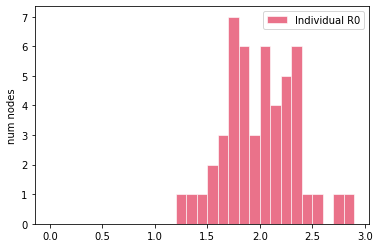

[INTERVENTIONS @ t = 0.06 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.53 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVENT

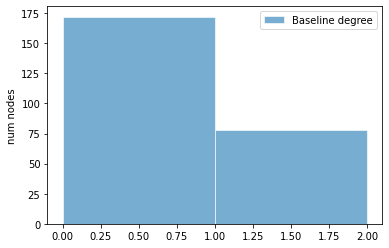

latent period:  mean = 3.39, std = 1.99, 95% CI = (0.63, 8.26)

pre-symptomatic period:  mean = 2.56, std = 1.52, 95% CI = (0.50, 6.13)

total incubation period:  mean = 5.95, std = 2.59, 95% CI = (1.78, 12.17)



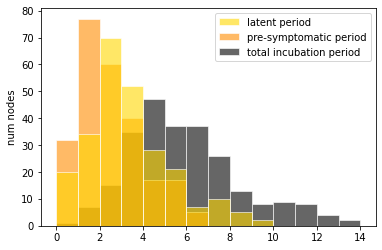

pre-symptomatic period:  mean = 3.39, std = 1.99, 95% CI = (0.63, 8.26)

(a)symptomatic period:  mean = 6.78, std = 2.63, 95% CI = (2.75, 12.36)

total infectious period:  mean = 10.17, std = 3.27, 95% CI = (4.88, 17.10)



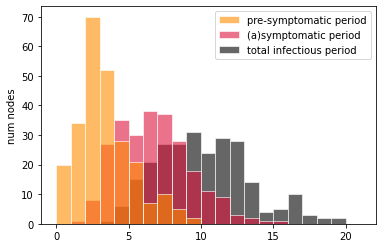

onset-to-hospitalization period:  mean = 8.26, std = 3.65, 95% CI = (2.59, 17.10)

hospitalization-to-discharge period:  mean = 14.51, std = 6.33, 95% CI = (4.85, 29.80)

onset-to-discharge period:  mean = 22.77, std = 7.58, 95% CI = (11.08, 40.65)



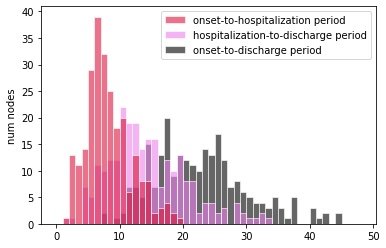

onset-to-hospitalization period:  mean = 8.26, std = 3.65, 95% CI = (2.59, 17.10)

hospitalization-to-death period:  mean = 7.38, std = 3.22, 95% CI = (2.68, 14.28)

onset-to-death period:  mean = 15.64, std = 4.56, 95% CI = (7.91, 26.59)



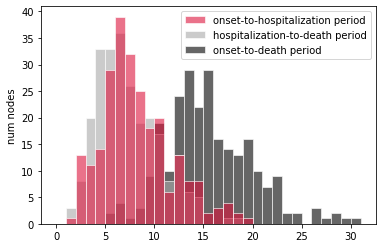

Individual R0:  mean = 1.98, std = 0.38, 95% CI = (1.37, 2.78)



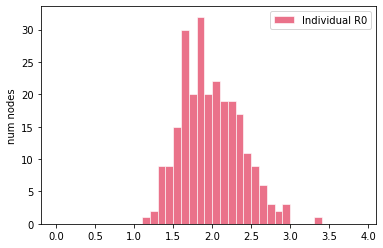

[NEW EXPOSURE @ t = 0.08 (1 exposed)]
[INTERVENTIONS @ t = 0.08 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.05 (26 (10.40%) infected)]
	1	tested due to symptoms  [+ 1 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	249	tested randomly         [+ 11 positive (4.42 %) +]
	250	tested TOTAL            [+ 12 positive (4.80 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	12 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as gro

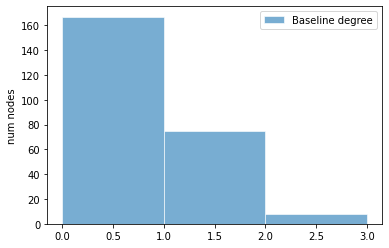

latent period:  mean = 3.31, std = 1.98, 95% CI = (0.67, 8.14)

pre-symptomatic period:  mean = 2.46, std = 1.43, 95% CI = (0.40, 6.25)

total incubation period:  mean = 5.77, std = 2.38, 95% CI = (2.10, 10.78)



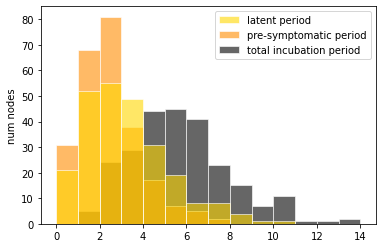

pre-symptomatic period:  mean = 3.31, std = 1.98, 95% CI = (0.67, 8.14)

(a)symptomatic period:  mean = 6.40, std = 3.02, 95% CI = (2.35, 13.28)

total infectious period:  mean = 9.71, std = 3.58, 95% CI = (4.81, 18.63)



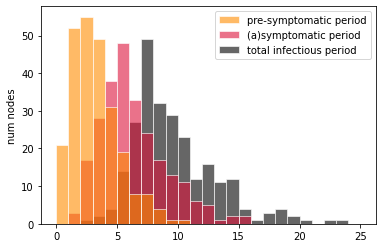

onset-to-hospitalization period:  mean = 7.86, std = 3.34, 95% CI = (2.75, 15.24)

hospitalization-to-discharge period:  mean = 14.23, std = 6.44, 95% CI = (4.58, 30.14)

onset-to-discharge period:  mean = 22.09, std = 7.24, 95% CI = (10.81, 39.82)



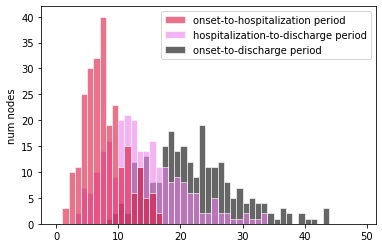

onset-to-hospitalization period:  mean = 7.86, std = 3.34, 95% CI = (2.75, 15.24)

hospitalization-to-death period:  mean = 7.16, std = 3.26, 95% CI = (2.21, 14.72)

onset-to-death period:  mean = 15.02, std = 4.83, 95% CI = (6.34, 24.75)



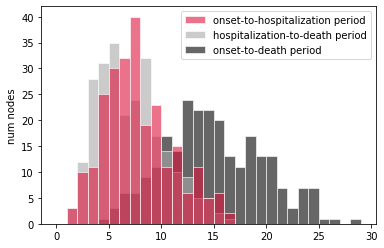

Individual R0:  mean = 2.01, std = 0.39, 95% CI = (1.40, 2.91)



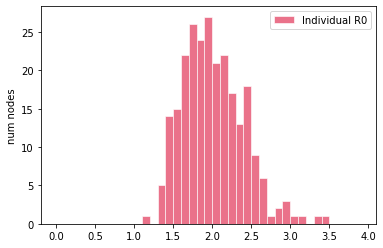

[INTERVENTIONS @ t = 0.03 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.07 (26 (10.40%) infected)]
	2	tested due to symptoms  [+ 1 positive (50.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	248	tested randomly         [+ 4 positive (1.61 %) +]
	250	tested TOTAL            [+ 5 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	5 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[

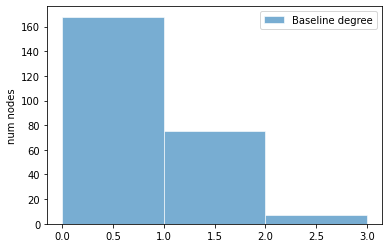

latent period:  mean = 3.59, std = 2.16, 95% CI = (0.57, 9.10)

pre-symptomatic period:  mean = 2.48, std = 1.34, 95% CI = (0.63, 5.69)

total incubation period:  mean = 6.07, std = 2.47, 95% CI = (2.60, 12.27)



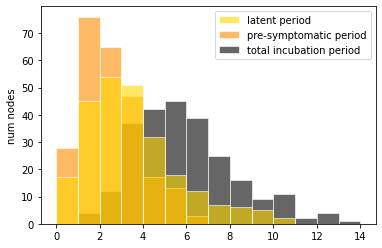

pre-symptomatic period:  mean = 3.59, std = 2.16, 95% CI = (0.57, 9.10)

(a)symptomatic period:  mean = 6.44, std = 2.49, 95% CI = (2.63, 11.97)

total infectious period:  mean = 10.02, std = 3.27, 95% CI = (4.90, 17.66)



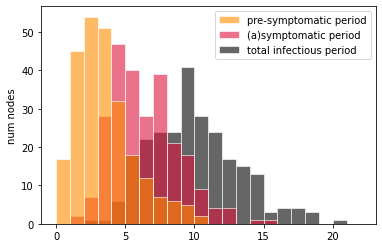

onset-to-hospitalization period:  mean = 8.15, std = 3.54, 95% CI = (2.69, 15.60)

hospitalization-to-discharge period:  mean = 14.53, std = 6.66, 95% CI = (4.47, 30.06)

onset-to-discharge period:  mean = 22.68, std = 7.41, 95% CI = (11.26, 37.89)



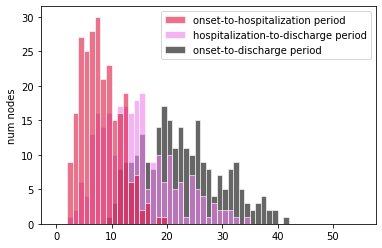

onset-to-hospitalization period:  mean = 8.15, std = 3.54, 95% CI = (2.69, 15.60)

hospitalization-to-death period:  mean = 6.89, std = 3.08, 95% CI = (2.36, 14.10)

onset-to-death period:  mean = 15.04, std = 4.87, 95% CI = (7.16, 25.10)



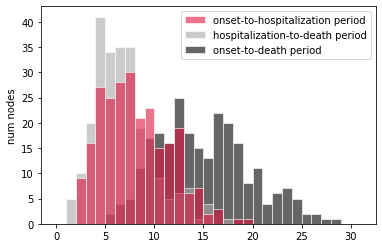

Individual R0:  mean = 2.01, std = 0.42, 95% CI = (1.30, 2.91)



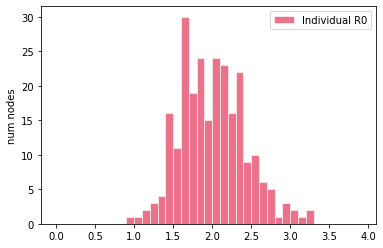

[INTERVENTIONS @ t = 0.05 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[NEW EXPOSURE @ t = 1.25 (1 exposed)]
[INTERVENTIONS @ t = 1.25 (26 (10.40%) infected)]
	1	tested due to symptoms  [+ 1 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	249	tested randomly         [+ 9 positive (3.61 %) +]
	250	tested TOTAL            [+ 10 positive (4.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	10 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as grou

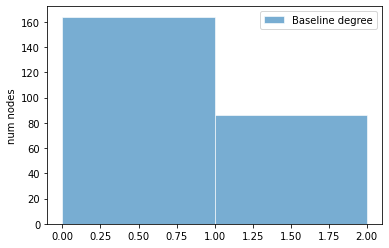

latent period:  mean = 3.52, std = 2.24, 95% CI = (0.80, 8.70)

pre-symptomatic period:  mean = 2.36, std = 1.59, 95% CI = (0.43, 6.78)

total incubation period:  mean = 5.88, std = 2.63, 95% CI = (2.17, 11.39)



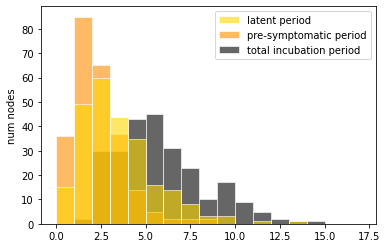

pre-symptomatic period:  mean = 3.52, std = 2.24, 95% CI = (0.80, 8.70)

(a)symptomatic period:  mean = 6.22, std = 2.45, 95% CI = (2.29, 11.89)

total infectious period:  mean = 9.74, std = 3.39, 95% CI = (4.39, 16.89)



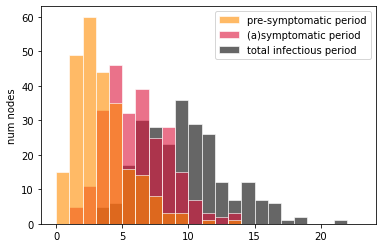

onset-to-hospitalization period:  mean = 7.93, std = 3.76, 95% CI = (2.06, 16.41)

hospitalization-to-discharge period:  mean = 13.48, std = 5.67, 95% CI = (4.26, 25.38)

onset-to-discharge period:  mean = 21.41, std = 6.50, 95% CI = (10.02, 35.35)



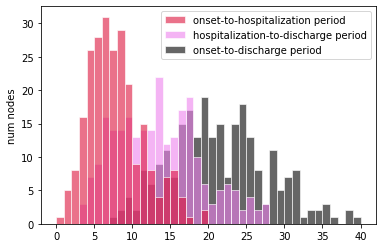

onset-to-hospitalization period:  mean = 7.93, std = 3.76, 95% CI = (2.06, 16.41)

hospitalization-to-death period:  mean = 7.06, std = 3.15, 95% CI = (2.32, 13.44)

onset-to-death period:  mean = 14.99, std = 4.79, 95% CI = (7.04, 25.39)



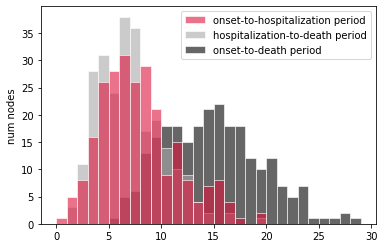

Individual R0:  mean = 2.00, std = 0.39, 95% CI = (1.40, 2.82)



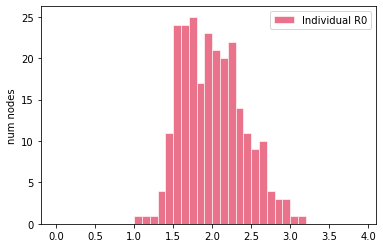

[INTERVENTIONS @ t = 0.14 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.08 (26 (10.40%) infected)]
	3	tested due to symptoms  [+ 3 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	247	tested randomly         [+ 7 positive (2.83 %) +]
	250	tested TOTAL            [+ 10 positive (4.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	10 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolatio

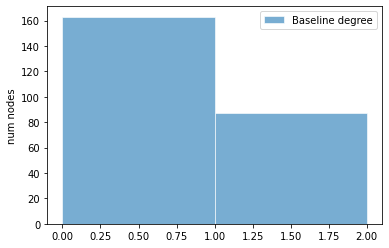

latent period:  mean = 3.56, std = 1.93, 95% CI = (0.74, 7.69)

pre-symptomatic period:  mean = 2.62, std = 1.69, 95% CI = (0.44, 6.43)

total incubation period:  mean = 6.17, std = 2.65, 95% CI = (2.50, 12.49)



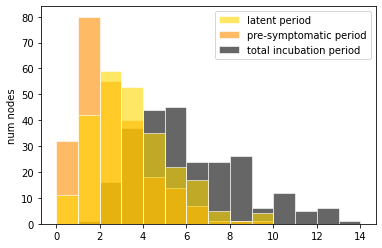

pre-symptomatic period:  mean = 3.56, std = 1.93, 95% CI = (0.74, 7.69)

(a)symptomatic period:  mean = 6.48, std = 2.62, 95% CI = (2.79, 11.90)

total infectious period:  mean = 10.04, std = 3.16, 95% CI = (4.60, 16.85)



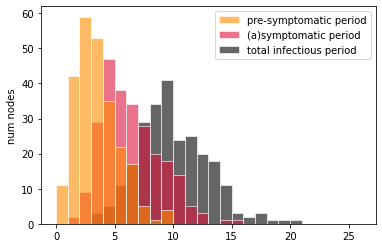

onset-to-hospitalization period:  mean = 8.07, std = 3.55, 95% CI = (2.87, 15.33)

hospitalization-to-discharge period:  mean = 14.20, std = 6.21, 95% CI = (5.39, 26.96)

onset-to-discharge period:  mean = 22.27, std = 6.93, 95% CI = (11.25, 39.11)



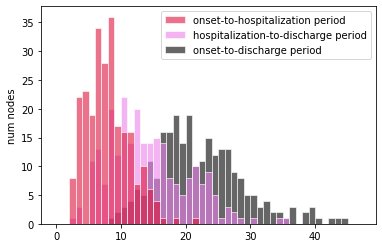

onset-to-hospitalization period:  mean = 8.07, std = 3.55, 95% CI = (2.87, 15.33)

hospitalization-to-death period:  mean = 6.62, std = 2.89, 95% CI = (2.01, 12.67)

onset-to-death period:  mean = 14.68, std = 4.46, 95% CI = (7.27, 24.35)



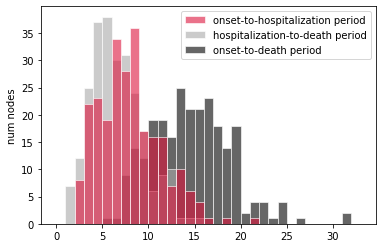

Individual R0:  mean = 2.01, std = 0.40, 95% CI = (1.31, 2.83)



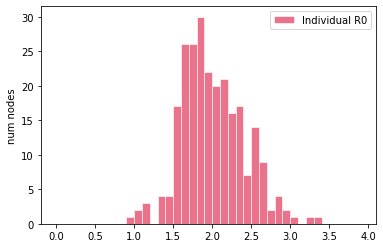

[INTERVENTIONS @ t = 0.04 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 0 positive (0.00 %) +]
	250	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.00 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 7 positive (2.80 %) +]
	250	tested TOTAL            [+ 7 positive (2.80 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	7 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[I

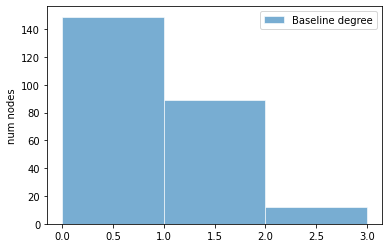

latent period:  mean = 3.74, std = 2.09, 95% CI = (0.76, 8.08)

pre-symptomatic period:  mean = 2.58, std = 1.65, 95% CI = (0.56, 6.79)

total incubation period:  mean = 6.32, std = 2.52, 95% CI = (2.46, 12.03)



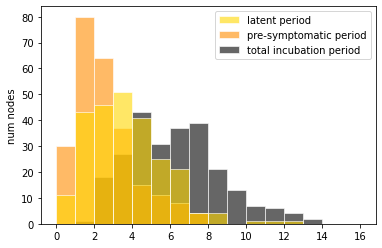

pre-symptomatic period:  mean = 3.74, std = 2.09, 95% CI = (0.76, 8.08)

(a)symptomatic period:  mean = 6.46, std = 2.42, 95% CI = (2.49, 11.69)

total infectious period:  mean = 10.20, std = 3.10, 95% CI = (4.63, 16.96)



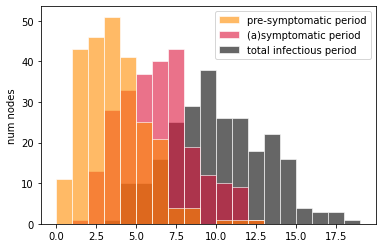

onset-to-hospitalization period:  mean = 7.94, std = 3.86, 95% CI = (2.57, 16.90)

hospitalization-to-discharge period:  mean = 13.54, std = 6.40, 95% CI = (4.48, 28.93)

onset-to-discharge period:  mean = 21.48, std = 7.75, 95% CI = (8.46, 40.31)



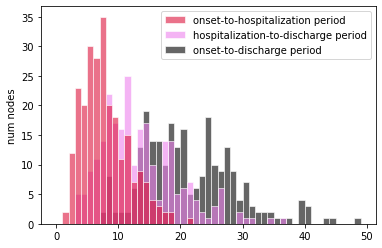

onset-to-hospitalization period:  mean = 7.94, std = 3.86, 95% CI = (2.57, 16.90)

hospitalization-to-death period:  mean = 7.16, std = 3.02, 95% CI = (2.49, 12.99)

onset-to-death period:  mean = 15.10, std = 5.05, 95% CI = (6.98, 28.10)



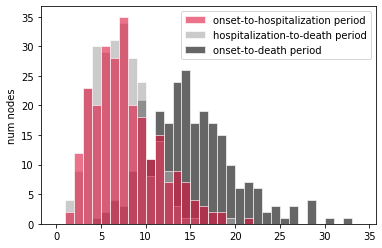

Individual R0:  mean = 2.03, std = 0.41, 95% CI = (1.37, 2.92)



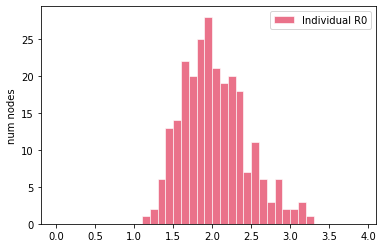

[INTERVENTIONS @ t = 0.00 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 0 positive (0.00 %) +]
	250	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.00 (26 (10.40%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTER

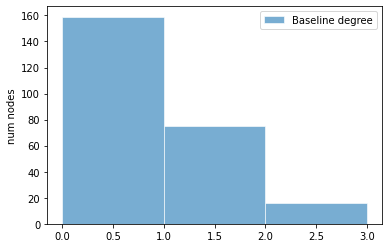

latent period:  mean = 3.19, std = 1.85, 95% CI = (0.63, 8.05)

pre-symptomatic period:  mean = 2.45, std = 1.29, 95% CI = (0.51, 5.19)

total incubation period:  mean = 5.65, std = 2.21, 95% CI = (1.90, 10.36)



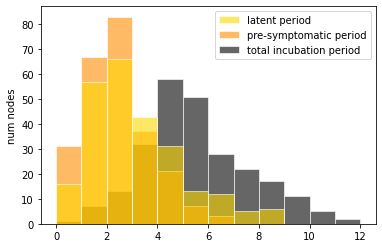

pre-symptomatic period:  mean = 3.19, std = 1.85, 95% CI = (0.63, 8.05)

(a)symptomatic period:  mean = 6.68, std = 2.56, 95% CI = (2.77, 12.67)

total infectious period:  mean = 9.88, std = 3.21, 95% CI = (4.92, 17.29)



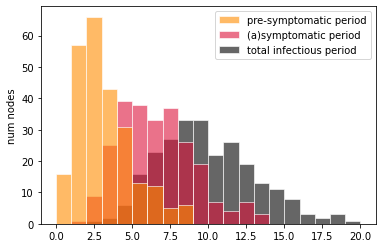

onset-to-hospitalization period:  mean = 8.06, std = 3.46, 95% CI = (2.46, 16.66)

hospitalization-to-discharge period:  mean = 14.20, std = 6.38, 95% CI = (4.06, 28.66)

onset-to-discharge period:  mean = 22.27, std = 7.36, 95% CI = (10.20, 38.91)



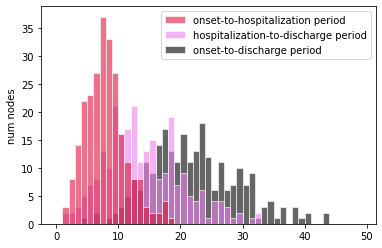

onset-to-hospitalization period:  mean = 8.06, std = 3.46, 95% CI = (2.46, 16.66)

hospitalization-to-death period:  mean = 6.81, std = 2.95, 95% CI = (2.46, 14.37)

onset-to-death period:  mean = 14.87, std = 4.40, 95% CI = (7.68, 24.17)



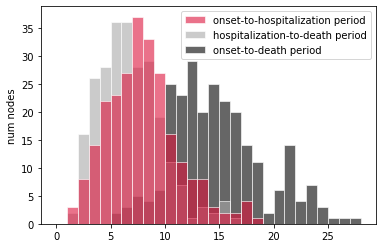

Individual R0:  mean = 1.99, std = 0.39, 95% CI = (1.31, 2.87)



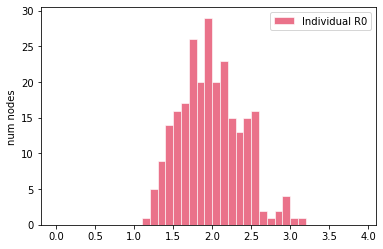

[INTERVENTIONS @ t = 0.14 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.08 (26 (10.40%) infected)]
	1	tested due to symptoms  [+ 1 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	1	tested TOTAL            [+ 1 positive (100.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[I

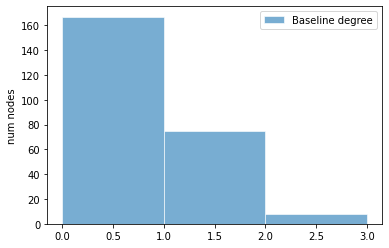

latent period:  mean = 3.56, std = 2.09, 95% CI = (0.60, 8.66)

pre-symptomatic period:  mean = 2.41, std = 1.33, 95% CI = (0.44, 5.53)

total incubation period:  mean = 5.98, std = 2.52, 95% CI = (2.17, 11.57)



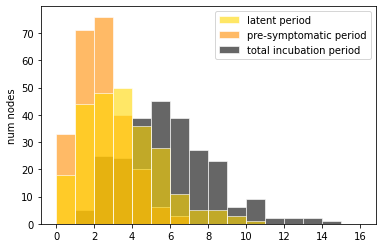

pre-symptomatic period:  mean = 3.56, std = 2.09, 95% CI = (0.60, 8.66)

(a)symptomatic period:  mean = 6.66, std = 2.62, 95% CI = (2.32, 11.49)

total infectious period:  mean = 10.23, std = 3.32, 95% CI = (4.65, 17.54)



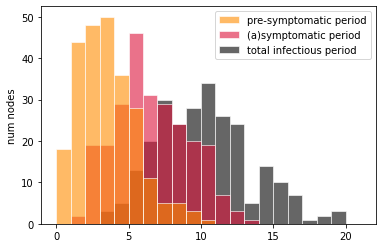

onset-to-hospitalization period:  mean = 7.76, std = 3.48, 95% CI = (2.27, 16.68)

hospitalization-to-discharge period:  mean = 14.16, std = 5.97, 95% CI = (3.79, 27.13)

onset-to-discharge period:  mean = 21.92, std = 6.78, 95% CI = (10.05, 37.00)



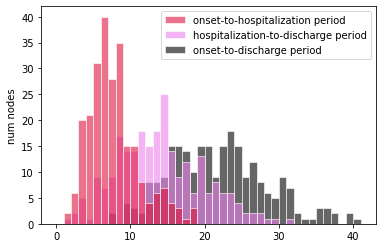

onset-to-hospitalization period:  mean = 7.76, std = 3.48, 95% CI = (2.27, 16.68)

hospitalization-to-death period:  mean = 6.72, std = 2.99, 95% CI = (2.26, 13.36)

onset-to-death period:  mean = 14.47, std = 4.51, 95% CI = (7.04, 24.01)



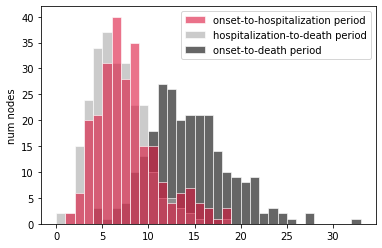

Individual R0:  mean = 1.97, std = 0.39, 95% CI = (1.32, 2.85)



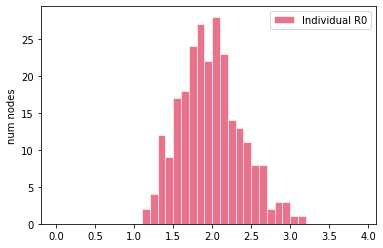

[INTERVENTIONS @ t = 0.01 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.16 (23 (9.20%) infected)]
	1	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	1	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERV

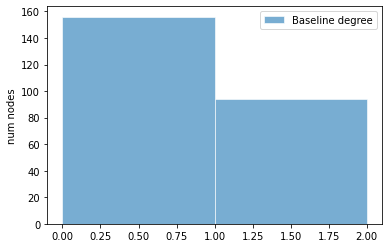

latent period:  mean = 3.55, std = 1.90, 95% CI = (0.79, 7.44)

pre-symptomatic period:  mean = 2.46, std = 1.34, 95% CI = (0.48, 5.53)

total incubation period:  mean = 6.01, std = 2.29, 95% CI = (2.21, 10.92)



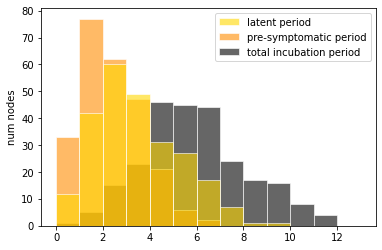

pre-symptomatic period:  mean = 3.55, std = 1.90, 95% CI = (0.79, 7.44)

(a)symptomatic period:  mean = 6.46, std = 2.37, 95% CI = (2.60, 11.64)

total infectious period:  mean = 10.01, std = 2.95, 95% CI = (5.06, 17.22)



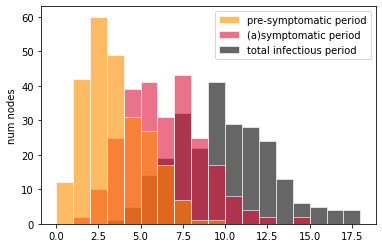

onset-to-hospitalization period:  mean = 8.17, std = 3.76, 95% CI = (2.50, 17.52)

hospitalization-to-discharge period:  mean = 14.64, std = 6.77, 95% CI = (5.00, 29.82)

onset-to-discharge period:  mean = 22.81, std = 8.01, 95% CI = (9.89, 40.15)



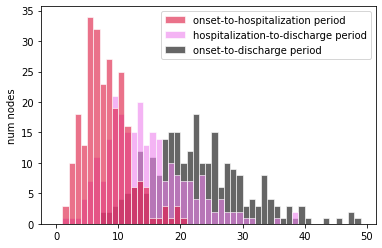

onset-to-hospitalization period:  mean = 8.17, std = 3.76, 95% CI = (2.50, 17.52)

hospitalization-to-death period:  mean = 7.06, std = 3.35, 95% CI = (1.88, 14.82)

onset-to-death period:  mean = 15.23, std = 5.15, 95% CI = (6.41, 24.92)



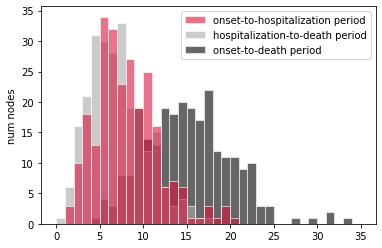

Individual R0:  mean = 2.02, std = 0.37, 95% CI = (1.39, 2.76)



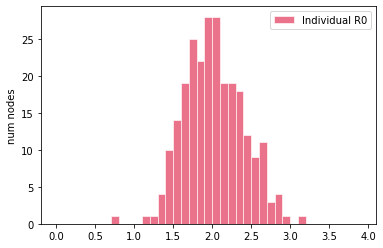

[INTERVENTIONS @ t = 0.08 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.20 (26 (10.40%) infected)]
	1	tested due to symptoms  [+ 1 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	1	tested TOTAL            [+ 1 positive (100.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[I

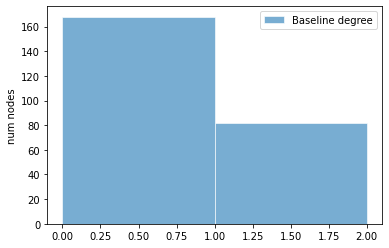

latent period:  mean = 3.52, std = 2.17, 95% CI = (0.68, 9.31)

pre-symptomatic period:  mean = 2.60, std = 1.68, 95% CI = (0.45, 7.66)

total incubation period:  mean = 6.12, std = 2.70, 95% CI = (2.25, 12.19)



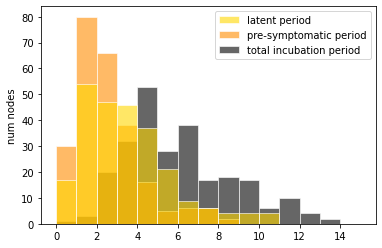

pre-symptomatic period:  mean = 3.52, std = 2.17, 95% CI = (0.68, 9.31)

(a)symptomatic period:  mean = 6.53, std = 2.62, 95% CI = (2.64, 12.85)

total infectious period:  mean = 10.05, std = 3.45, 95% CI = (4.35, 17.24)



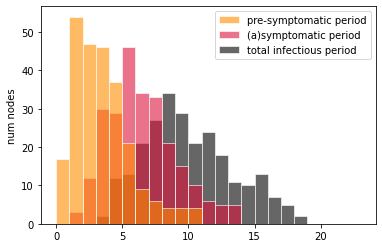

onset-to-hospitalization period:  mean = 7.86, std = 3.65, 95% CI = (2.63, 16.88)

hospitalization-to-discharge period:  mean = 13.65, std = 6.13, 95% CI = (4.23, 28.31)

onset-to-discharge period:  mean = 21.51, std = 7.01, 95% CI = (10.98, 37.67)



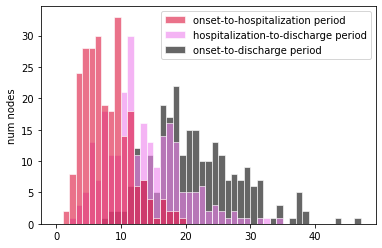

onset-to-hospitalization period:  mean = 7.86, std = 3.65, 95% CI = (2.63, 16.88)

hospitalization-to-death period:  mean = 7.01, std = 3.27, 95% CI = (2.00, 15.33)

onset-to-death period:  mean = 14.88, std = 5.02, 95% CI = (6.37, 25.97)



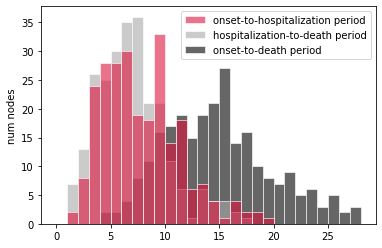

Individual R0:  mean = 2.00, std = 0.40, 95% CI = (1.33, 2.80)



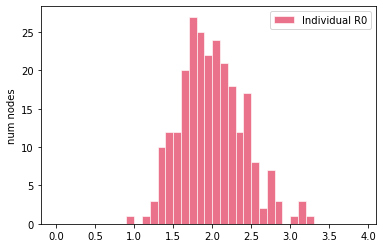

[INTERVENTIONS @ t = 0.01 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[NEW EXPOSURE @ t = 1.14 (1 exposed)]
[INTERVENTIONS @ t = 1.14 (26 (10.40%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates o

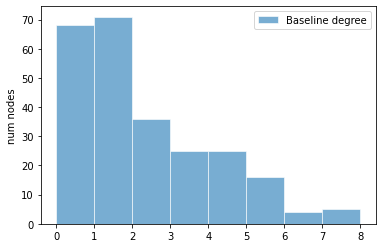

latent period:  mean = 3.50, std = 2.11, 95% CI = (0.74, 8.39)

pre-symptomatic period:  mean = 2.46, std = 1.45, 95% CI = (0.47, 6.02)

total incubation period:  mean = 5.96, std = 2.61, 95% CI = (2.03, 11.86)



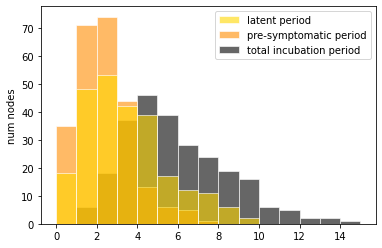

pre-symptomatic period:  mean = 3.50, std = 2.11, 95% CI = (0.74, 8.39)

(a)symptomatic period:  mean = 6.57, std = 2.56, 95% CI = (2.79, 12.59)

total infectious period:  mean = 10.07, std = 3.16, 95% CI = (5.25, 17.47)



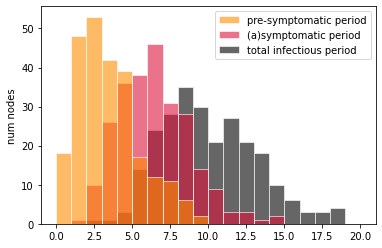

onset-to-hospitalization period:  mean = 7.83, std = 3.62, 95% CI = (2.27, 16.24)

hospitalization-to-discharge period:  mean = 14.77, std = 7.02, 95% CI = (4.96, 32.79)

onset-to-discharge period:  mean = 22.60, std = 7.86, 95% CI = (9.28, 42.00)



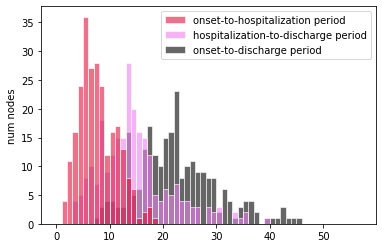

onset-to-hospitalization period:  mean = 7.83, std = 3.62, 95% CI = (2.27, 16.24)

hospitalization-to-death period:  mean = 6.85, std = 3.27, 95% CI = (2.31, 14.37)

onset-to-death period:  mean = 14.68, std = 4.91, 95% CI = (6.43, 26.02)



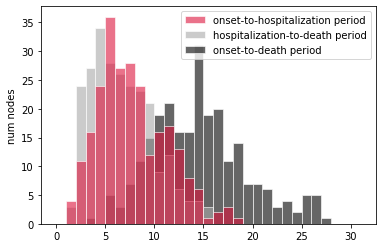

Individual R0:  mean = 1.98, std = 0.39, 95% CI = (1.29, 2.82)



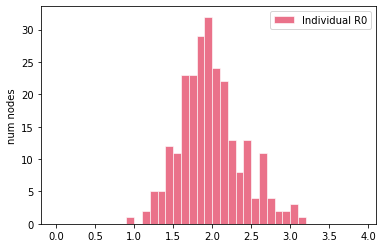

[INTERVENTIONS @ t = 0.11 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.00 (28 (11.20%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	249	tested randomly         [+ 8 positive (3.21 %) +]
	249	tested TOTAL            [+ 8 positive (3.21 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	8 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[I

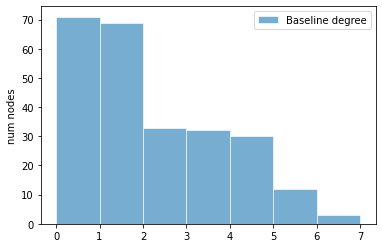

latent period:  mean = 3.63, std = 2.19, 95% CI = (0.75, 9.40)

pre-symptomatic period:  mean = 2.48, std = 1.50, 95% CI = (0.41, 5.79)

total incubation period:  mean = 6.11, std = 2.59, 95% CI = (2.29, 12.01)



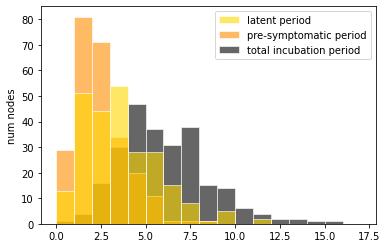

pre-symptomatic period:  mean = 3.63, std = 2.19, 95% CI = (0.75, 9.40)

(a)symptomatic period:  mean = 6.56, std = 2.40, 95% CI = (2.42, 12.00)

total infectious period:  mean = 10.20, std = 3.19, 95% CI = (4.49, 16.23)



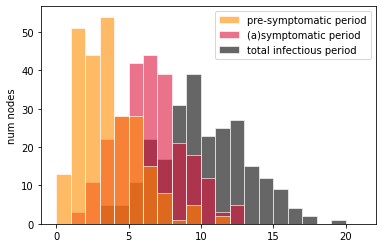

onset-to-hospitalization period:  mean = 8.13, std = 3.32, 95% CI = (3.07, 15.62)

hospitalization-to-discharge period:  mean = 13.57, std = 6.33, 95% CI = (4.96, 29.60)

onset-to-discharge period:  mean = 21.70, std = 7.32, 95% CI = (9.91, 40.21)



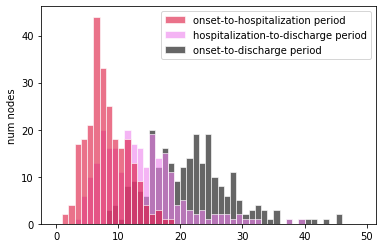

onset-to-hospitalization period:  mean = 8.13, std = 3.32, 95% CI = (3.07, 15.62)

hospitalization-to-death period:  mean = 6.64, std = 2.77, 95% CI = (2.43, 12.90)

onset-to-death period:  mean = 14.76, std = 4.17, 95% CI = (8.22, 23.48)



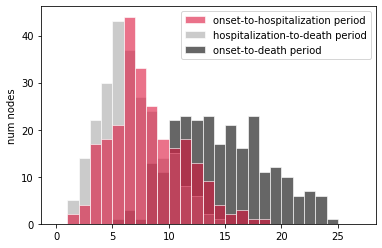

Individual R0:  mean = 2.02, std = 0.41, 95% CI = (1.29, 2.87)



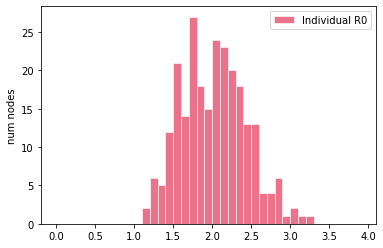

[INTERVENTIONS @ t = 0.03 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 0 positive (0.00 %) +]
	250	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[NEW EXPOSURE @ t = 1.13 (2 exposed)]
[INTERVENTIONS @ t = 1.13 (26 (10.40%) infected)]
	1	tested due to symptoms  [+ 1 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	249	tested randomly         [+ 8 positive (3.21 %) +]
	250	tested TOTAL            [+ 9 positive (3.60 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	9 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupm

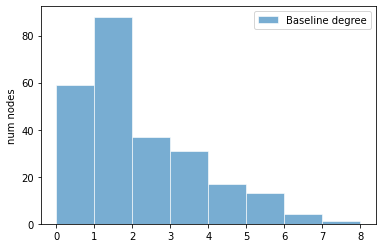

latent period:  mean = 3.27, std = 1.96, 95% CI = (0.58, 7.72)

pre-symptomatic period:  mean = 2.42, std = 1.44, 95% CI = (0.54, 5.83)

total incubation period:  mean = 5.69, std = 2.33, 95% CI = (2.02, 11.07)



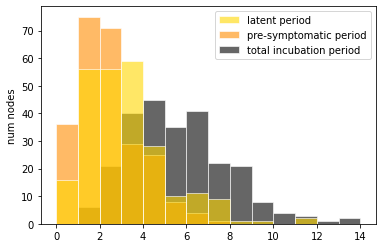

pre-symptomatic period:  mean = 3.27, std = 1.96, 95% CI = (0.58, 7.72)

(a)symptomatic period:  mean = 6.39, std = 2.65, 95% CI = (2.29, 13.17)

total infectious period:  mean = 9.66, std = 3.18, 95% CI = (4.70, 16.86)



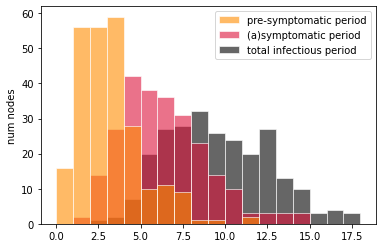

onset-to-hospitalization period:  mean = 8.22, std = 3.59, 95% CI = (2.65, 15.83)

hospitalization-to-discharge period:  mean = 14.19, std = 6.35, 95% CI = (5.14, 28.33)

onset-to-discharge period:  mean = 22.41, std = 7.08, 95% CI = (12.00, 39.03)



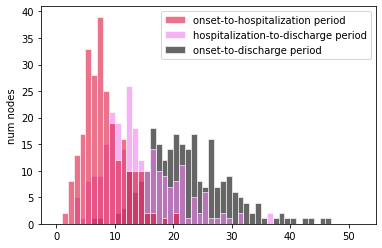

onset-to-hospitalization period:  mean = 8.22, std = 3.59, 95% CI = (2.65, 15.83)

hospitalization-to-death period:  mean = 6.87, std = 3.21, 95% CI = (2.18, 14.86)

onset-to-death period:  mean = 15.09, std = 5.00, 95% CI = (7.32, 26.32)



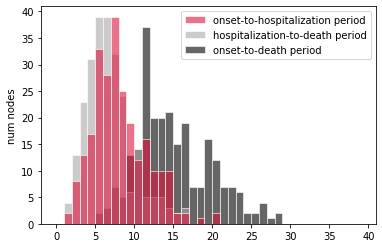

Individual R0:  mean = 2.03, std = 0.37, 95% CI = (1.37, 2.82)



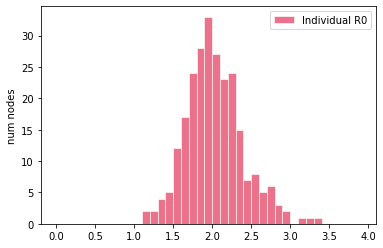

[INTERVENTIONS @ t = 0.08 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.04 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	249	tested randomly         [+ 7 positive (2.81 %) +]
	249	tested TOTAL            [+ 7 positive (2.81 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	7 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[I

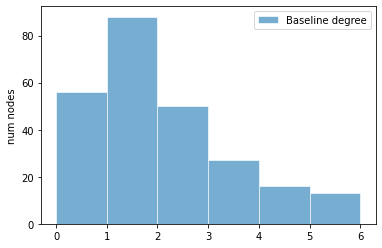

latent period:  mean = 3.71, std = 2.14, 95% CI = (0.58, 8.60)

pre-symptomatic period:  mean = 2.53, std = 1.45, 95% CI = (0.39, 5.66)

total incubation period:  mean = 6.24, std = 2.54, 95% CI = (2.10, 11.78)



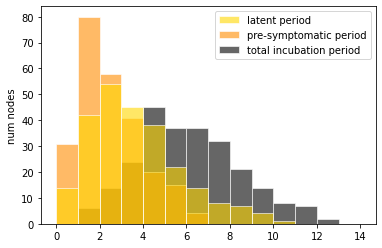

pre-symptomatic period:  mean = 3.71, std = 2.14, 95% CI = (0.58, 8.60)

(a)symptomatic period:  mean = 6.46, std = 2.50, 95% CI = (2.42, 11.88)

total infectious period:  mean = 10.17, std = 3.46, 95% CI = (4.82, 17.75)



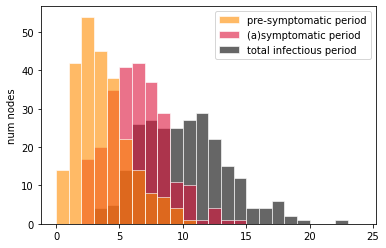

onset-to-hospitalization period:  mean = 8.32, std = 3.68, 95% CI = (2.92, 16.17)

hospitalization-to-discharge period:  mean = 14.19, std = 5.80, 95% CI = (5.48, 28.31)

onset-to-discharge period:  mean = 22.51, std = 6.85, 95% CI = (10.95, 38.05)



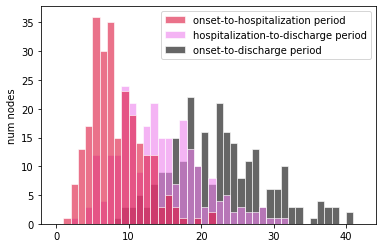

onset-to-hospitalization period:  mean = 8.32, std = 3.68, 95% CI = (2.92, 16.17)

hospitalization-to-death period:  mean = 6.79, std = 3.24, 95% CI = (1.91, 14.75)

onset-to-death period:  mean = 15.11, std = 4.81, 95% CI = (7.62, 27.40)



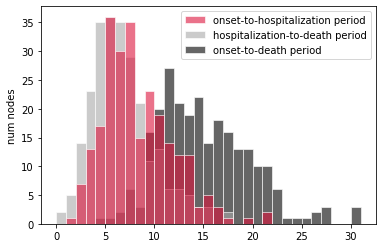

Individual R0:  mean = 1.99, std = 0.43, 95% CI = (1.29, 2.86)



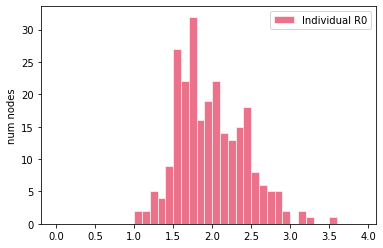

[INTERVENTIONS @ t = 0.01 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[NEW EXPOSURE @ t = 1.09 (1 exposed)]
[INTERVENTIONS @ t = 1.09 (26 (10.40%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	249	tested randomly         [+ 11 positive (4.42 %) +]
	249	tested TOTAL            [+ 11 positive (4.42 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	11 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as group

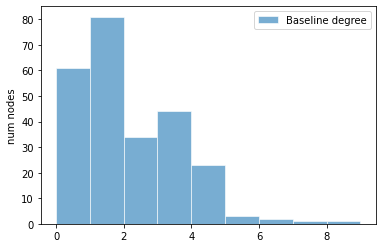

latent period:  mean = 3.52, std = 2.14, 95% CI = (0.74, 8.70)

pre-symptomatic period:  mean = 2.60, std = 1.50, 95% CI = (0.52, 6.41)

total incubation period:  mean = 6.12, std = 2.55, 95% CI = (2.00, 11.04)



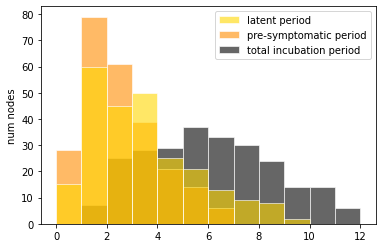

pre-symptomatic period:  mean = 3.52, std = 2.14, 95% CI = (0.74, 8.70)

(a)symptomatic period:  mean = 6.44, std = 2.52, 95% CI = (2.50, 12.03)

total infectious period:  mean = 9.96, std = 3.29, 95% CI = (4.60, 16.59)



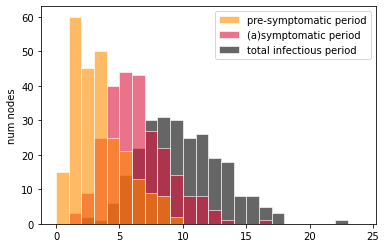

onset-to-hospitalization period:  mean = 7.80, std = 3.47, 95% CI = (2.66, 15.94)

hospitalization-to-discharge period:  mean = 14.56, std = 6.02, 95% CI = (5.09, 28.37)

onset-to-discharge period:  mean = 22.37, std = 6.97, 95% CI = (11.13, 37.33)



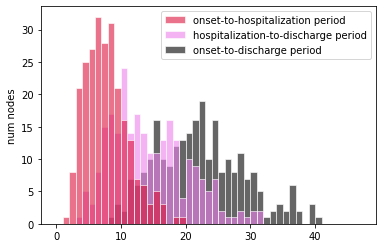

onset-to-hospitalization period:  mean = 7.80, std = 3.47, 95% CI = (2.66, 15.94)

hospitalization-to-death period:  mean = 7.24, std = 3.22, 95% CI = (2.38, 14.41)

onset-to-death period:  mean = 15.04, std = 4.65, 95% CI = (7.61, 25.28)



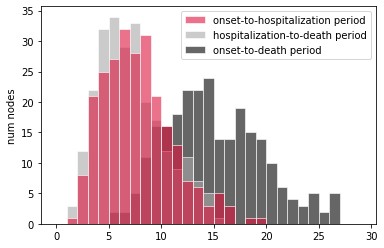

Individual R0:  mean = 1.98, std = 0.39, 95% CI = (1.23, 2.78)



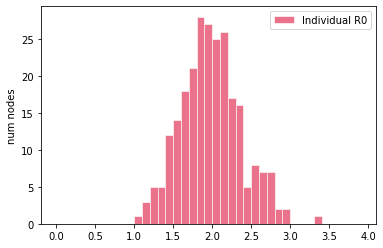

[INTERVENTIONS @ t = 0.12 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[NEW EXPOSURE @ t = 1.02 (2 exposed)]
[INTERVENTIONS @ t = 1.02 (25 (10.00%) infected)]
	1	tested due to symptoms  [+ 1 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	249	tested randomly         [+ 6 positive (2.41 %) +]
	250	tested TOTAL            [+ 7 positive (2.80 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	7 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupm

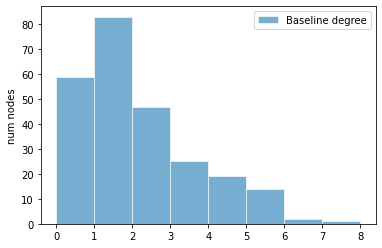

latent period:  mean = 3.99, std = 2.37, 95% CI = (0.80, 9.97)

pre-symptomatic period:  mean = 2.62, std = 1.67, 95% CI = (0.55, 6.25)

total incubation period:  mean = 6.61, std = 2.94, 95% CI = (2.38, 13.88)



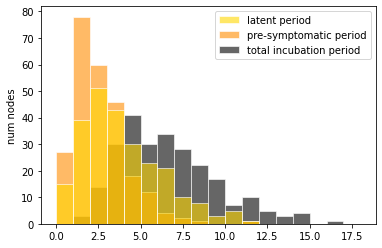

pre-symptomatic period:  mean = 3.99, std = 2.37, 95% CI = (0.80, 9.97)

(a)symptomatic period:  mean = 6.81, std = 2.94, 95% CI = (2.75, 14.73)

total infectious period:  mean = 10.80, std = 3.68, 95% CI = (5.17, 18.95)



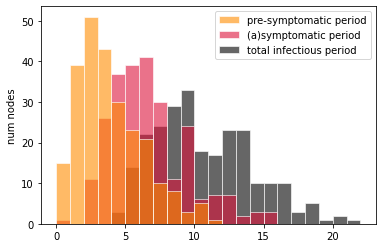

onset-to-hospitalization period:  mean = 8.49, std = 3.75, 95% CI = (2.77, 16.26)

hospitalization-to-discharge period:  mean = 13.87, std = 6.16, 95% CI = (4.63, 27.13)

onset-to-discharge period:  mean = 22.36, std = 7.52, 95% CI = (10.21, 39.91)



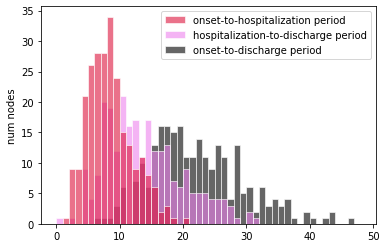

onset-to-hospitalization period:  mean = 8.49, std = 3.75, 95% CI = (2.77, 16.26)

hospitalization-to-death period:  mean = 7.14, std = 3.37, 95% CI = (2.06, 14.29)

onset-to-death period:  mean = 15.63, std = 5.12, 95% CI = (7.93, 24.61)



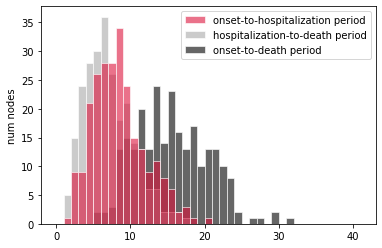

Individual R0:  mean = 2.01, std = 0.41, 95% CI = (1.28, 2.84)



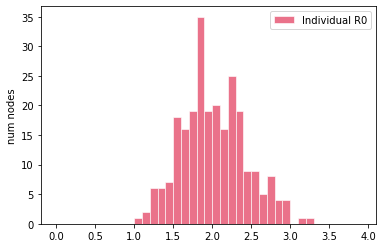

[INTERVENTIONS @ t = 0.18 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.06 (27 (10.80%) infected)]
	1	tested due to symptoms  [+ 1 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	1	tested TOTAL            [+ 1 positive (100.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[I

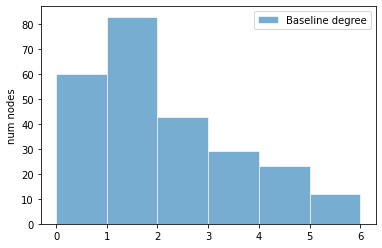

latent period:  mean = 3.27, std = 1.91, 95% CI = (0.81, 7.94)

pre-symptomatic period:  mean = 2.51, std = 1.60, 95% CI = (0.54, 6.04)

total incubation period:  mean = 5.79, std = 2.43, 95% CI = (2.38, 12.18)



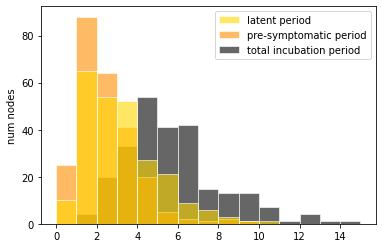

pre-symptomatic period:  mean = 3.27, std = 1.91, 95% CI = (0.81, 7.94)

(a)symptomatic period:  mean = 6.42, std = 2.57, 95% CI = (2.14, 12.26)

total infectious period:  mean = 9.70, std = 3.21, 95% CI = (4.49, 17.80)



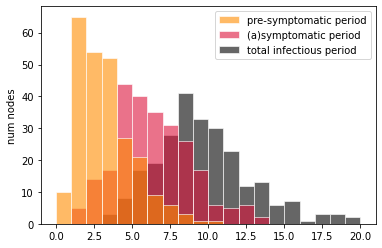

onset-to-hospitalization period:  mean = 7.77, std = 3.61, 95% CI = (2.30, 15.57)

hospitalization-to-discharge period:  mean = 14.23, std = 6.27, 95% CI = (4.86, 27.46)

onset-to-discharge period:  mean = 22.00, std = 7.02, 95% CI = (11.13, 36.50)



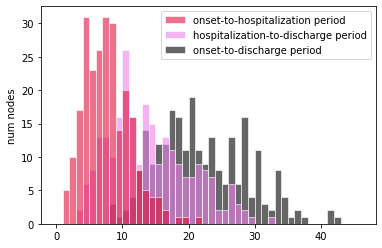

onset-to-hospitalization period:  mean = 7.77, std = 3.61, 95% CI = (2.30, 15.57)

hospitalization-to-death period:  mean = 6.66, std = 2.65, 95% CI = (2.27, 12.97)

onset-to-death period:  mean = 14.43, std = 4.47, 95% CI = (7.15, 24.37)



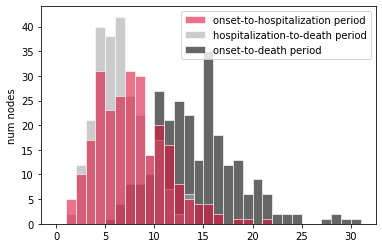

Individual R0:  mean = 1.99, std = 0.43, 95% CI = (1.30, 2.91)



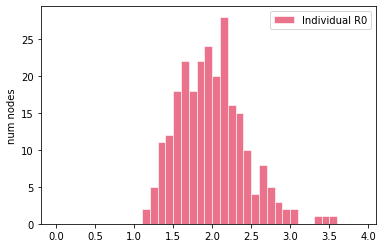

[INTERVENTIONS @ t = 0.04 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 0 positive (0.00 %) +]
	250	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.02 (25 (10.00%) infected)]
	3	tested due to symptoms  [+ 2 positive (66.67 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	3	tested TOTAL            [+ 2 positive (66.67 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	2 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INT

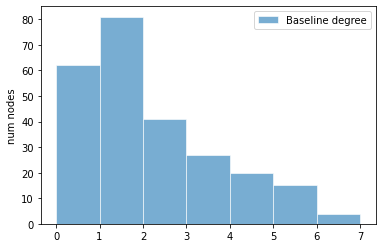

latent period:  mean = 3.68, std = 2.17, 95% CI = (0.81, 8.65)

pre-symptomatic period:  mean = 2.49, std = 1.73, 95% CI = (0.48, 7.06)

total incubation period:  mean = 6.16, std = 2.82, 95% CI = (2.29, 13.12)



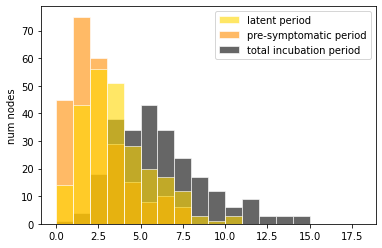

pre-symptomatic period:  mean = 3.68, std = 2.17, 95% CI = (0.81, 8.65)

(a)symptomatic period:  mean = 6.25, std = 2.43, 95% CI = (2.45, 12.47)

total infectious period:  mean = 9.93, std = 3.08, 95% CI = (5.22, 17.65)



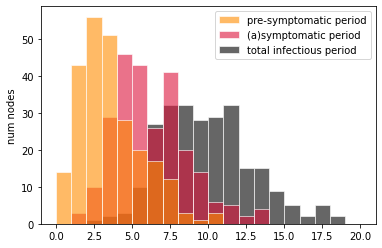

onset-to-hospitalization period:  mean = 8.04, std = 3.40, 95% CI = (2.95, 14.81)

hospitalization-to-discharge period:  mean = 13.49, std = 5.32, 95% CI = (5.10, 26.34)

onset-to-discharge period:  mean = 21.53, std = 6.21, 95% CI = (10.78, 36.06)



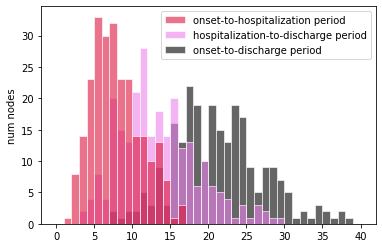

onset-to-hospitalization period:  mean = 8.04, std = 3.40, 95% CI = (2.95, 14.81)

hospitalization-to-death period:  mean = 7.04, std = 3.23, 95% CI = (2.48, 13.70)

onset-to-death period:  mean = 15.08, std = 4.47, 95% CI = (7.72, 24.63)



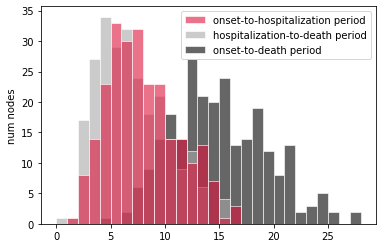

Individual R0:  mean = 2.03, std = 0.40, 95% CI = (1.35, 2.89)



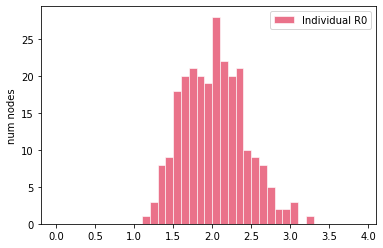

[NEW EXPOSURE @ t = 0.03 (1 exposed)]
[INTERVENTIONS @ t = 0.03 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.01 (27 (10.80%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates o

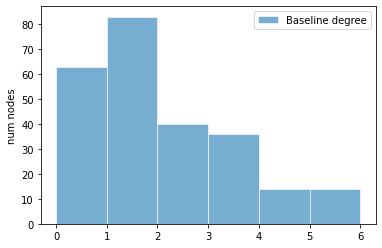

latent period:  mean = 3.51, std = 2.19, 95% CI = (0.58, 8.17)

pre-symptomatic period:  mean = 2.43, std = 1.56, 95% CI = (0.48, 6.10)

total incubation period:  mean = 5.94, std = 2.85, 95% CI = (2.00, 13.27)



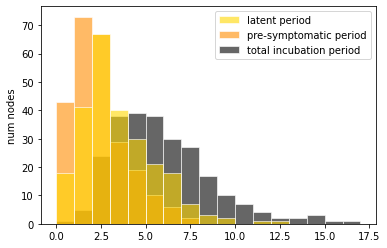

pre-symptomatic period:  mean = 3.51, std = 2.19, 95% CI = (0.58, 8.17)

(a)symptomatic period:  mean = 6.50, std = 2.65, 95% CI = (2.39, 12.44)

total infectious period:  mean = 10.01, std = 3.62, 95% CI = (4.44, 17.78)



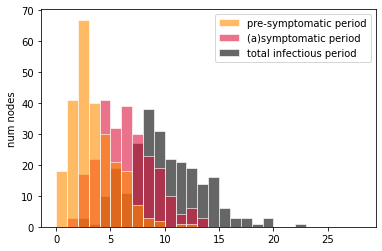

onset-to-hospitalization period:  mean = 8.19, std = 3.59, 95% CI = (2.72, 16.82)

hospitalization-to-discharge period:  mean = 14.44, std = 6.82, 95% CI = (4.77, 30.56)

onset-to-discharge period:  mean = 22.64, std = 7.72, 95% CI = (10.62, 41.64)



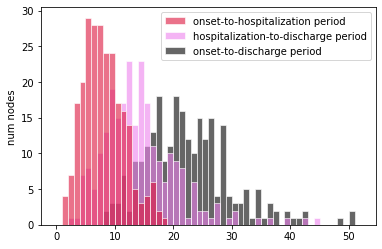

onset-to-hospitalization period:  mean = 8.19, std = 3.59, 95% CI = (2.72, 16.82)

hospitalization-to-death period:  mean = 6.80, std = 3.10, 95% CI = (1.97, 13.80)

onset-to-death period:  mean = 15.00, std = 4.69, 95% CI = (7.40, 24.66)



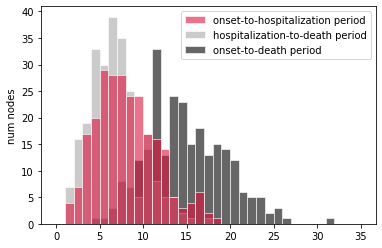

Individual R0:  mean = 2.00, std = 0.40, 95% CI = (1.34, 2.84)



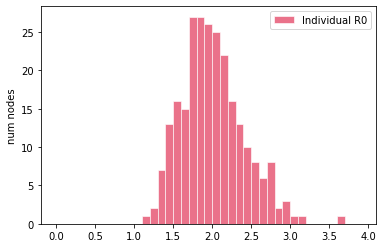

[INTERVENTIONS @ t = 0.08 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.11 (25 (10.00%) infected)]
	1	tested due to symptoms  [+ 1 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	1	tested TOTAL            [+ 1 positive (100.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[I

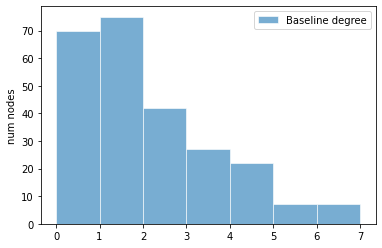

latent period:  mean = 3.66, std = 2.00, 95% CI = (0.68, 8.35)

pre-symptomatic period:  mean = 2.47, std = 1.31, 95% CI = (0.52, 5.72)

total incubation period:  mean = 6.13, std = 2.39, 95% CI = (2.33, 11.33)



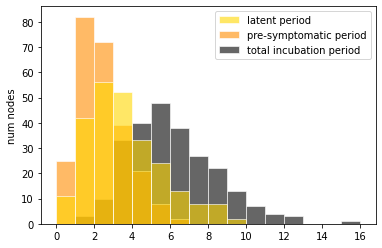

pre-symptomatic period:  mean = 3.66, std = 2.00, 95% CI = (0.68, 8.35)

(a)symptomatic period:  mean = 6.64, std = 2.77, 95% CI = (2.54, 12.96)

total infectious period:  mean = 10.31, std = 3.58, 95% CI = (4.72, 18.54)



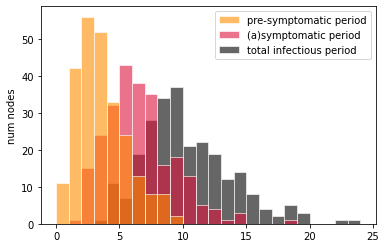

onset-to-hospitalization period:  mean = 8.30, std = 3.68, 95% CI = (2.52, 16.84)

hospitalization-to-discharge period:  mean = 14.17, std = 6.26, 95% CI = (4.53, 29.58)

onset-to-discharge period:  mean = 22.47, std = 7.35, 95% CI = (11.82, 40.20)



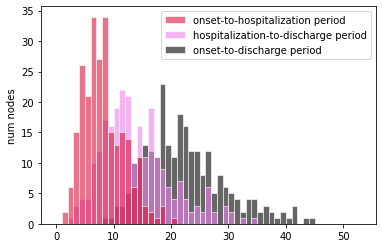

onset-to-hospitalization period:  mean = 8.30, std = 3.68, 95% CI = (2.52, 16.84)

hospitalization-to-death period:  mean = 7.27, std = 3.38, 95% CI = (2.07, 15.29)

onset-to-death period:  mean = 15.57, std = 4.64, 95% CI = (8.31, 24.95)



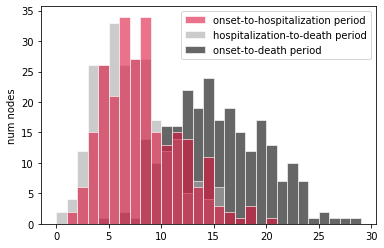

Individual R0:  mean = 2.00, std = 0.39, 95% CI = (1.30, 2.77)



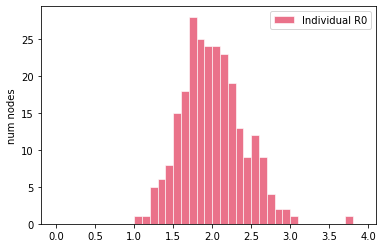

[NEW EXPOSURE @ t = 0.12 (1 exposed)]
[INTERVENTIONS @ t = 0.12 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[NEW EXPOSURE @ t = 1.01 (1 exposed)]
[INTERVENTIONS @ t = 1.01 (27 (10.80%) infected)]
	2	tested due to symptoms  [+ 1 positive (50.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	2	tested TOTAL            [+ 1 positive (50.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate du

In [13]:
# Final parameters for the conditions
#Network_size = [20, 50, 100, 250, 500, 1000]
#Bubble_size = [5, 10, 25, 50]
#PCR_Frequency = ['none', 'workday', 'weekly', 'monthly']
#Other options are: everyday, semiweekly & biweekly
#R = [1, 1.5, 2, 2.5, 3]

# Parameters for faster testing
Network_size = [20, 50, 250]
Bubble_size = [5, 25]
PCR_Frequency = ['workday', 'weekly']
          
# Loop to itterate over every possible combination of parameters
for i in range(len(Network_size)):
    for j in range(len(Bubble_size)):
        if (Network_size[i] % Bubble_size[j]) != 0:
            continue 
        if Network_size[i] == Bubble_size[j]:
            continue
        for k in range(len(PCR_Frequency)):
            #for l in range(len(R)):
            simulation_covid(Network_size[i], Bubble_size[j], PCR_Frequency[k], 2)


Network size = 20
Bubble size = 20
PCR_frequency = workday
R = 2
Baseline:
Degree: mean = 1.20, std = 0.98, 95% CI = (0.00, 3.00)
        coeff var = 0.82
Assortativity:    -0.44
Clustering coeff: 0.00



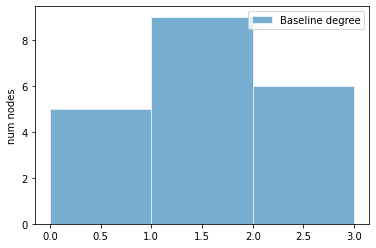

latent period:  mean = 3.76, std = 3.24, 95% CI = (1.02, 11.57)

pre-symptomatic period:  mean = 2.31, std = 1.19, 95% CI = (0.75, 4.94)

total incubation period:  mean = 6.07, std = 3.62, 95% CI = (2.15, 14.63)



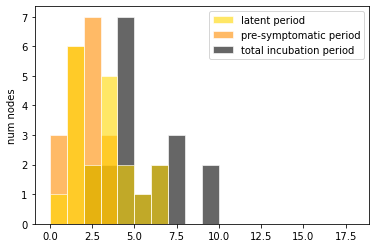

pre-symptomatic period:  mean = 3.76, std = 3.24, 95% CI = (1.02, 11.57)

(a)symptomatic period:  mean = 6.98, std = 2.66, 95% CI = (3.60, 12.11)

total infectious period:  mean = 10.73, std = 4.21, 95% CI = (6.33, 20.20)



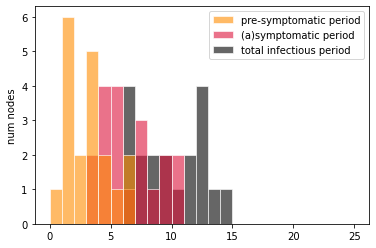

onset-to-hospitalization period:  mean = 8.30, std = 2.67, 95% CI = (3.96, 12.31)

hospitalization-to-discharge period:  mean = 13.22, std = 5.33, 95% CI = (5.88, 24.77)

onset-to-discharge period:  mean = 21.51, std = 5.90, 95% CI = (13.25, 32.47)



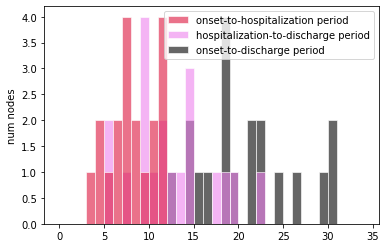

onset-to-hospitalization period:  mean = 8.30, std = 2.67, 95% CI = (3.96, 12.31)

hospitalization-to-death period:  mean = 6.17, std = 2.62, 95% CI = (2.89, 11.43)

onset-to-death period:  mean = 14.46, std = 3.39, 95% CI = (8.97, 20.50)



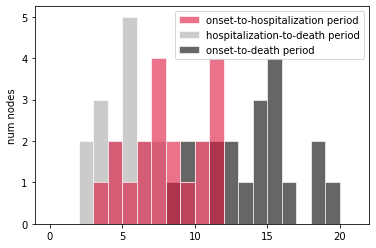

Individual R0:  mean = 2.04, std = 0.42, 95% CI = (1.37, 2.85)



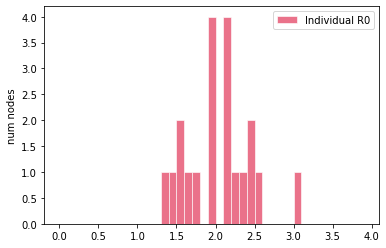

[INTERVENTIONS @ t = 2.84 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 1 positive (5.00 %) +]
	20	tested TOTAL            [+ 1 positive (5.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 4.44 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	19	tested randomly         [+ 0 positive (0.00 %) +]
	19	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVE

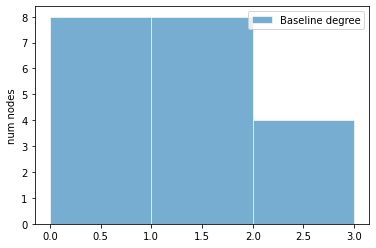

latent period:  mean = 4.87, std = 2.19, 95% CI = (1.74, 9.10)

pre-symptomatic period:  mean = 2.56, std = 1.52, 95% CI = (0.64, 5.70)

total incubation period:  mean = 7.43, std = 2.62, 95% CI = (3.28, 12.76)



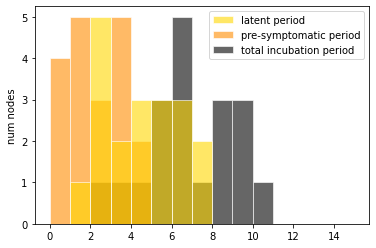

pre-symptomatic period:  mean = 4.87, std = 2.19, 95% CI = (1.74, 9.10)

(a)symptomatic period:  mean = 6.40, std = 2.05, 95% CI = (3.12, 10.88)

total infectious period:  mean = 11.27, std = 2.79, 95% CI = (6.94, 15.89)



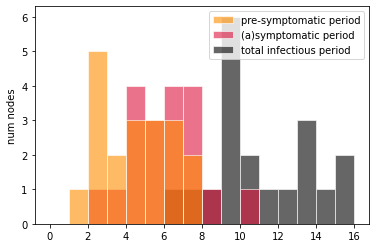

onset-to-hospitalization period:  mean = 7.44, std = 2.74, 95% CI = (2.77, 12.45)

hospitalization-to-discharge period:  mean = 14.46, std = 4.99, 95% CI = (7.26, 23.57)

onset-to-discharge period:  mean = 21.90, std = 4.39, 95% CI = (16.23, 29.62)



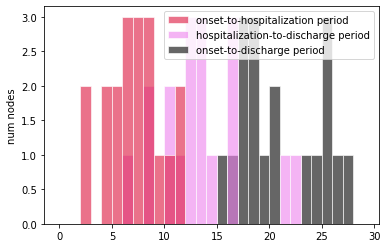

onset-to-hospitalization period:  mean = 7.44, std = 2.74, 95% CI = (2.77, 12.45)

hospitalization-to-death period:  mean = 6.75, std = 2.33, 95% CI = (2.74, 11.32)

onset-to-death period:  mean = 14.19, std = 3.61, 95% CI = (8.02, 20.23)



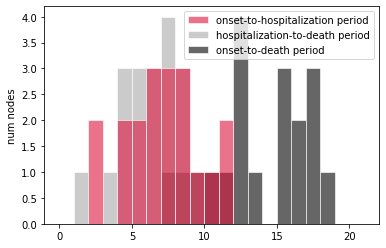

Individual R0:  mean = 1.85, std = 0.36, 95% CI = (1.27, 2.37)



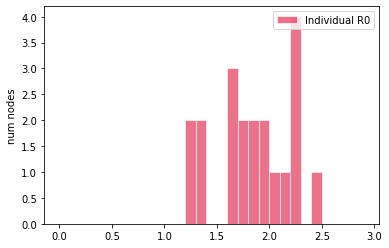

[INTERVENTIONS @ t = 0.37 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 1 positive (5.00 %) +]
	20	tested TOTAL            [+ 1 positive (5.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 2.26 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	19	tested randomly         [+ 0 positive (0.00 %) +]
	19	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[NEW EXP

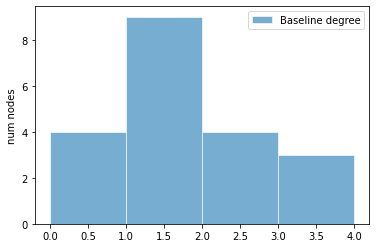

latent period:  mean = 3.68, std = 1.55, 95% CI = (1.74, 6.69)

pre-symptomatic period:  mean = 2.61, std = 1.25, 95% CI = (1.11, 4.90)

total incubation period:  mean = 6.28, std = 1.86, 95% CI = (3.51, 9.45)



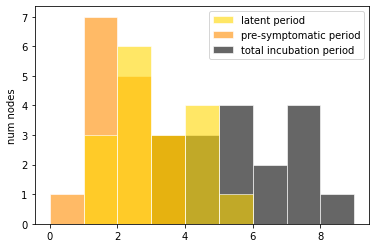

pre-symptomatic period:  mean = 3.68, std = 1.55, 95% CI = (1.74, 6.69)

(a)symptomatic period:  mean = 6.29, std = 2.62, 95% CI = (2.21, 11.57)

total infectious period:  mean = 9.97, std = 3.67, 95% CI = (4.33, 16.65)



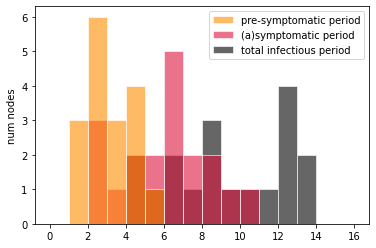

onset-to-hospitalization period:  mean = 7.99, std = 3.79, 95% CI = (3.28, 16.98)

hospitalization-to-discharge period:  mean = 12.56, std = 5.34, 95% CI = (6.04, 24.93)

onset-to-discharge period:  mean = 20.55, std = 6.66, 95% CI = (12.39, 36.58)



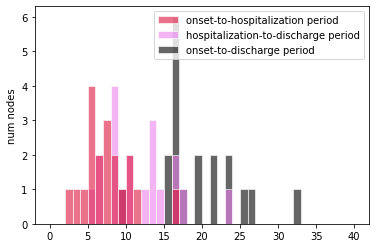

onset-to-hospitalization period:  mean = 7.99, std = 3.79, 95% CI = (3.28, 16.98)

hospitalization-to-death period:  mean = 6.25, std = 3.04, 95% CI = (3.13, 13.83)

onset-to-death period:  mean = 14.24, std = 5.01, 95% CI = (8.00, 26.07)



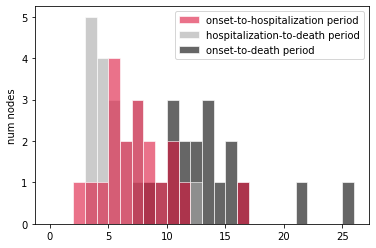

Individual R0:  mean = 2.19, std = 0.49, 95% CI = (1.45, 3.11)



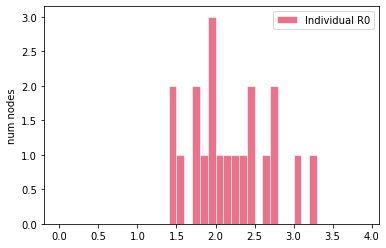

[INTERVENTIONS @ t = 0.38 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 1 positive (5.00 %) +]
	20	tested TOTAL            [+ 1 positive (5.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 2.63 (1 (5.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	18	tested randomly         [+ 0 positive (0.00 %) +]
	18	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVEN

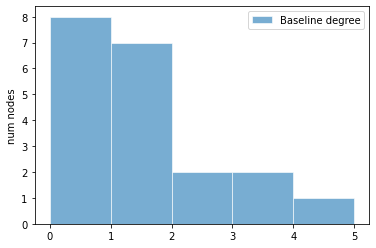

latent period:  mean = 4.19, std = 3.51, 95% CI = (0.97, 12.72)

pre-symptomatic period:  mean = 2.57, std = 1.42, 95% CI = (0.47, 5.37)

total incubation period:  mean = 6.75, std = 3.50, 95% CI = (2.31, 14.62)



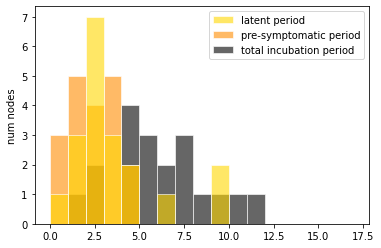

pre-symptomatic period:  mean = 4.19, std = 3.51, 95% CI = (0.97, 12.72)

(a)symptomatic period:  mean = 5.95, std = 2.01, 95% CI = (2.69, 9.55)

total infectious period:  mean = 10.14, std = 3.85, 95% CI = (5.39, 18.06)



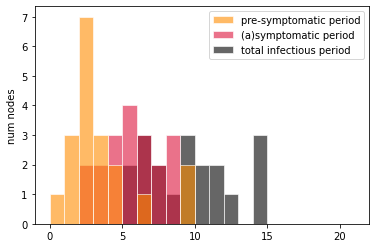

onset-to-hospitalization period:  mean = 7.19, std = 3.07, 95% CI = (2.74, 13.41)

hospitalization-to-discharge period:  mean = 14.06, std = 5.45, 95% CI = (5.20, 25.68)

onset-to-discharge period:  mean = 21.25, std = 6.21, 95% CI = (12.22, 33.89)



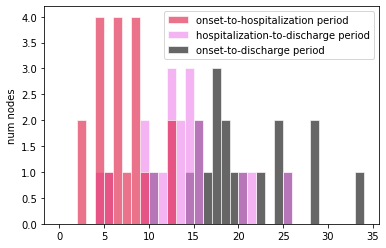

onset-to-hospitalization period:  mean = 7.19, std = 3.07, 95% CI = (2.74, 13.41)

hospitalization-to-death period:  mean = 7.39, std = 2.62, 95% CI = (4.30, 13.83)

onset-to-death period:  mean = 14.58, std = 3.70, 95% CI = (9.41, 21.76)



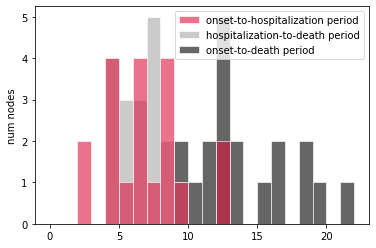

Individual R0:  mean = 2.08, std = 0.35, 95% CI = (1.48, 2.83)



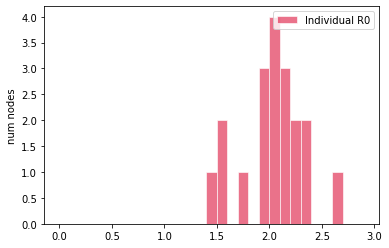

[INTERVENTIONS @ t = 0.59 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 0 positive (0.00 %) +]
	20	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.56 (2 (10.00%) infected)]
	1	tested due to symptoms  [+ 1 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	19	tested randomly         [+ 1 positive (5.26 %) +]
	20	tested TOTAL            [+ 2 positive (10.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	2 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTE

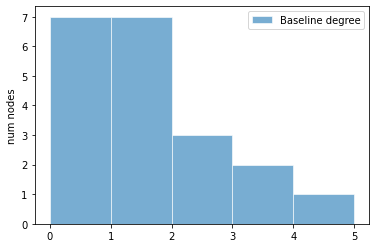

latent period:  mean = 2.90, std = 1.72, 95% CI = (0.66, 6.46)

pre-symptomatic period:  mean = 2.79, std = 1.32, 95% CI = (0.84, 5.13)

total incubation period:  mean = 5.69, std = 2.42, 95% CI = (2.20, 10.86)



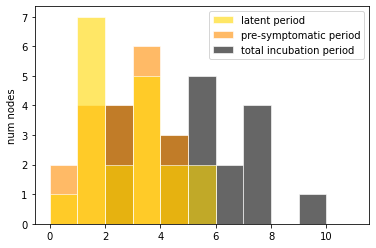

pre-symptomatic period:  mean = 2.90, std = 1.72, 95% CI = (0.66, 6.46)

(a)symptomatic period:  mean = 6.63, std = 2.88, 95% CI = (3.52, 12.95)

total infectious period:  mean = 9.52, std = 3.60, 95% CI = (5.28, 17.89)



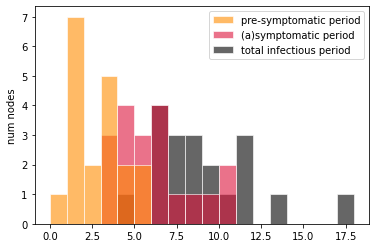

onset-to-hospitalization period:  mean = 9.03, std = 3.85, 95% CI = (2.68, 17.40)

hospitalization-to-discharge period:  mean = 13.18, std = 8.40, 95% CI = (4.71, 33.04)

onset-to-discharge period:  mean = 22.21, std = 9.49, 95% CI = (13.17, 43.93)



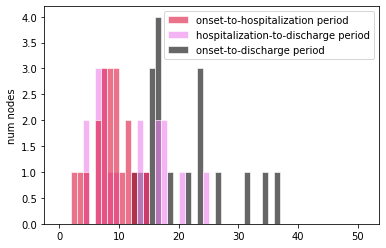

onset-to-hospitalization period:  mean = 9.03, std = 3.85, 95% CI = (2.68, 17.40)

hospitalization-to-death period:  mean = 6.90, std = 4.12, 95% CI = (1.74, 16.77)

onset-to-death period:  mean = 15.93, std = 5.43, 95% CI = (7.28, 26.35)



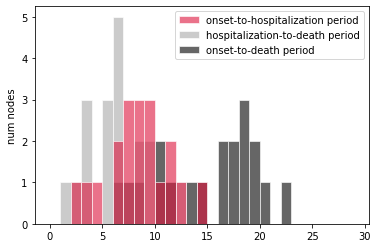

Individual R0:  mean = 2.06, std = 0.51, 95% CI = (1.40, 3.14)



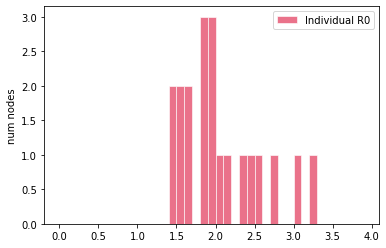

[INTERVENTIONS @ t = 1.91 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 0 positive (0.00 %) +]
	20	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 7.15 (2 (10.00%) infected)]
	1	tested due to symptoms  [+ 1 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	19	tested randomly         [+ 1 positive (5.26 %) +]
	20	tested TOTAL            [+ 2 positive (10.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	2 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTE

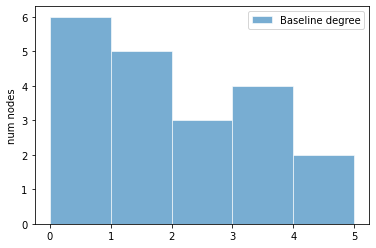

latent period:  mean = 3.31, std = 1.79, 95% CI = (0.87, 6.71)

pre-symptomatic period:  mean = 2.87, std = 1.36, 95% CI = (0.93, 5.51)

total incubation period:  mean = 6.18, std = 1.98, 95% CI = (3.54, 10.09)



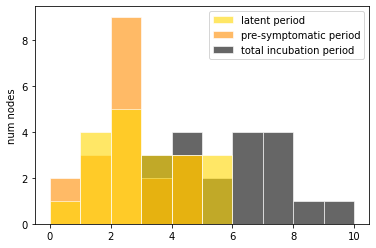

pre-symptomatic period:  mean = 3.31, std = 1.79, 95% CI = (0.87, 6.71)

(a)symptomatic period:  mean = 6.48, std = 2.12, 95% CI = (2.86, 10.29)

total infectious period:  mean = 9.79, std = 2.33, 95% CI = (5.33, 13.85)



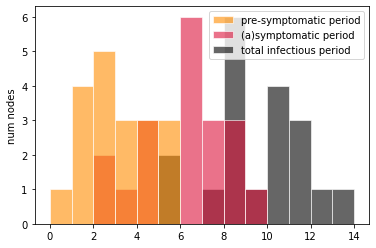

onset-to-hospitalization period:  mean = 6.70, std = 2.70, 95% CI = (3.35, 12.51)

hospitalization-to-discharge period:  mean = 15.06, std = 8.62, 95% CI = (3.42, 34.83)

onset-to-discharge period:  mean = 21.76, std = 9.23, 95% CI = (8.42, 42.44)



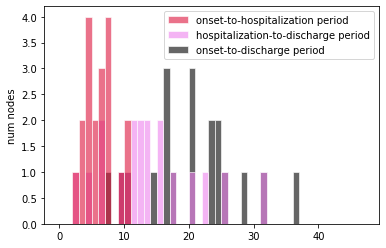

onset-to-hospitalization period:  mean = 6.70, std = 2.70, 95% CI = (3.35, 12.51)

hospitalization-to-death period:  mean = 7.00, std = 3.16, 95% CI = (2.22, 12.87)

onset-to-death period:  mean = 13.71, std = 4.08, 95% CI = (6.82, 19.97)



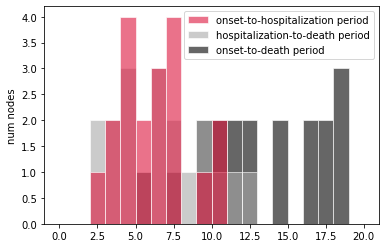

Individual R0:  mean = 1.97, std = 0.41, 95% CI = (1.21, 2.62)



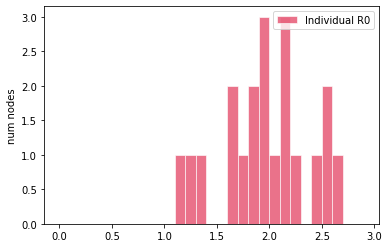

[INTERVENTIONS @ t = 1.35 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 1 positive (5.00 %) +]
	20	tested TOTAL            [+ 1 positive (5.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 3.31 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	19	tested randomly         [+ 1 positive (5.26 %) +]
	19	tested TOTAL            [+ 1 positive (5.26 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVE

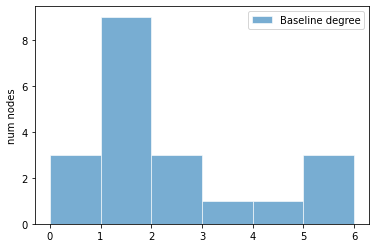

latent period:  mean = 3.60, std = 1.91, 95% CI = (0.75, 7.07)

pre-symptomatic period:  mean = 2.78, std = 1.46, 95% CI = (0.85, 5.69)

total incubation period:  mean = 6.38, std = 2.57, 95% CI = (2.26, 10.71)



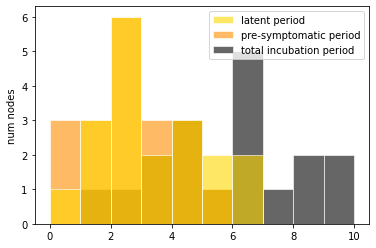

pre-symptomatic period:  mean = 3.60, std = 1.91, 95% CI = (0.75, 7.07)

(a)symptomatic period:  mean = 7.40, std = 2.78, 95% CI = (3.85, 12.73)

total infectious period:  mean = 11.01, std = 3.48, 95% CI = (6.03, 17.64)



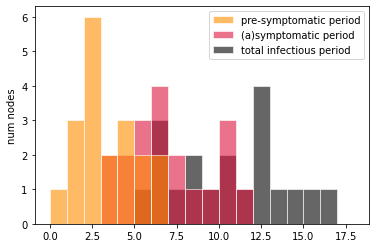

onset-to-hospitalization period:  mean = 7.43, std = 3.99, 95% CI = (2.83, 16.64)

hospitalization-to-discharge period:  mean = 12.56, std = 4.52, 95% CI = (3.54, 19.46)

onset-to-discharge period:  mean = 19.99, std = 5.66, 95% CI = (8.57, 28.74)



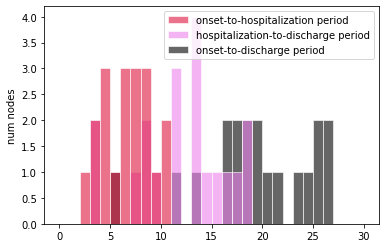

onset-to-hospitalization period:  mean = 7.43, std = 3.99, 95% CI = (2.83, 16.64)

hospitalization-to-death period:  mean = 6.54, std = 2.83, 95% CI = (2.87, 12.23)

onset-to-death period:  mean = 13.97, std = 5.08, 95% CI = (6.20, 24.75)



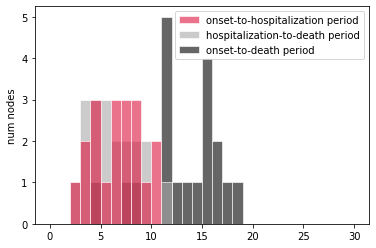

Individual R0:  mean = 1.98, std = 0.33, 95% CI = (1.51, 2.68)



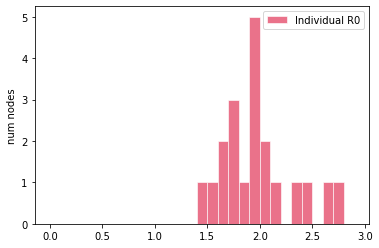

[INTERVENTIONS @ t = 0.24 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 1 positive (5.00 %) +]
	20	tested TOTAL            [+ 1 positive (5.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.49 (3 (15.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	19	tested randomly         [+ 1 positive (5.26 %) +]
	19	tested TOTAL            [+ 1 positive (5.26 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVE

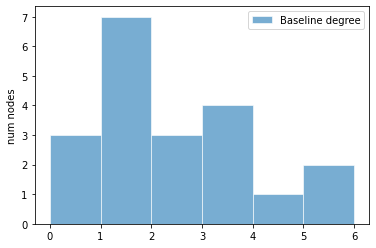

latent period:  mean = 3.15, std = 2.82, 95% CI = (0.40, 10.48)

pre-symptomatic period:  mean = 3.13, std = 1.50, 95% CI = (0.57, 5.65)

total incubation period:  mean = 6.28, std = 3.71, 95% CI = (1.59, 15.99)



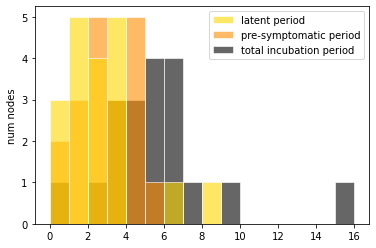

pre-symptomatic period:  mean = 3.15, std = 2.82, 95% CI = (0.40, 10.48)

(a)symptomatic period:  mean = 7.00, std = 2.45, 95% CI = (2.50, 11.04)

total infectious period:  mean = 10.14, std = 3.41, 95% CI = (5.15, 17.21)



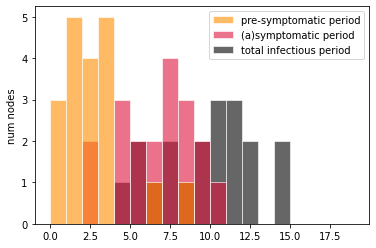

onset-to-hospitalization period:  mean = 8.39, std = 2.77, 95% CI = (4.07, 12.14)

hospitalization-to-discharge period:  mean = 14.49, std = 7.19, 95% CI = (3.70, 26.77)

onset-to-discharge period:  mean = 22.88, std = 7.62, 95% CI = (11.74, 35.49)



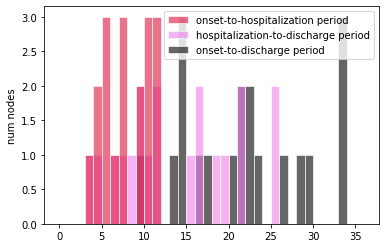

onset-to-hospitalization period:  mean = 8.39, std = 2.77, 95% CI = (4.07, 12.14)

hospitalization-to-death period:  mean = 7.13, std = 3.50, 95% CI = (2.59, 14.15)

onset-to-death period:  mean = 15.52, std = 4.29, 95% CI = (8.71, 23.06)



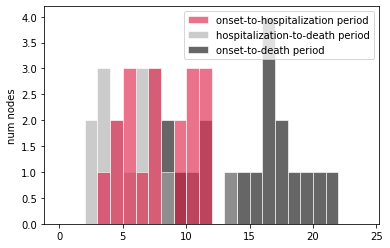

Individual R0:  mean = 2.04, std = 0.46, 95% CI = (1.23, 2.85)



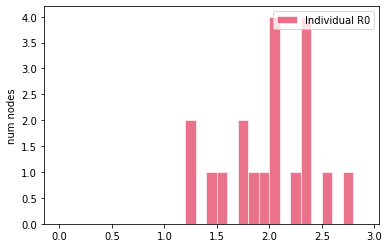

[INTERVENTIONS @ t = 0.49 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 1 positive (5.00 %) +]
	20	tested TOTAL            [+ 1 positive (5.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 4.62 (3 (15.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	19	tested randomly         [+ 1 positive (5.26 %) +]
	19	tested TOTAL            [+ 1 positive (5.26 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[NEW EXP

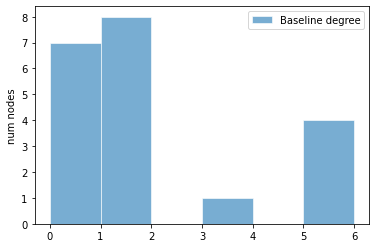

latent period:  mean = 3.73, std = 2.46, 95% CI = (0.99, 9.30)

pre-symptomatic period:  mean = 1.83, std = 1.12, 95% CI = (0.22, 4.16)

total incubation period:  mean = 5.56, std = 2.95, 95% CI = (1.85, 12.40)



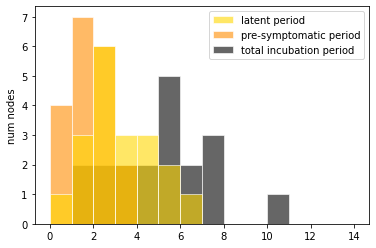

pre-symptomatic period:  mean = 3.73, std = 2.46, 95% CI = (0.99, 9.30)

(a)symptomatic period:  mean = 5.80, std = 2.05, 95% CI = (3.19, 10.56)

total infectious period:  mean = 9.53, std = 3.28, 95% CI = (5.82, 16.97)



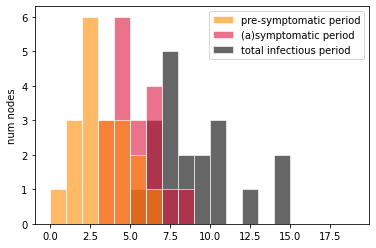

onset-to-hospitalization period:  mean = 7.08, std = 2.90, 95% CI = (2.10, 12.68)

hospitalization-to-discharge period:  mean = 15.53, std = 3.05, 95% CI = (11.31, 22.05)

onset-to-discharge period:  mean = 22.61, std = 3.84, 95% CI = (14.99, 29.30)



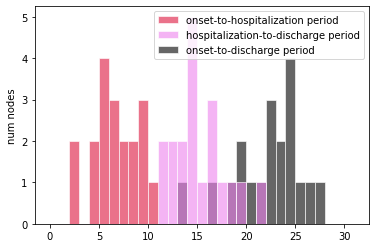

onset-to-hospitalization period:  mean = 7.08, std = 2.90, 95% CI = (2.10, 12.68)

hospitalization-to-death period:  mean = 6.92, std = 2.68, 95% CI = (3.57, 12.76)

onset-to-death period:  mean = 14.00, std = 4.26, 95% CI = (8.48, 22.96)



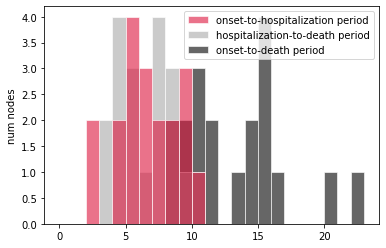

Individual R0:  mean = 1.99, std = 0.41, 95% CI = (1.37, 2.80)



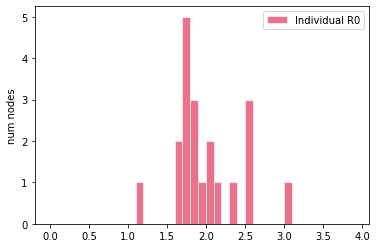

[INTERVENTIONS @ t = 0.20 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 1 positive (5.00 %) +]
	20	tested TOTAL            [+ 1 positive (5.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.18 (3 (15.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	19	tested randomly         [+ 1 positive (5.26 %) +]
	19	tested TOTAL            [+ 1 positive (5.26 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVE

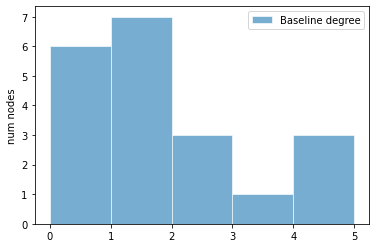

latent period:  mean = 3.87, std = 1.73, 95% CI = (1.60, 7.99)

pre-symptomatic period:  mean = 3.36, std = 2.03, 95% CI = (0.65, 7.89)

total incubation period:  mean = 7.22, std = 2.97, 95% CI = (2.80, 13.42)



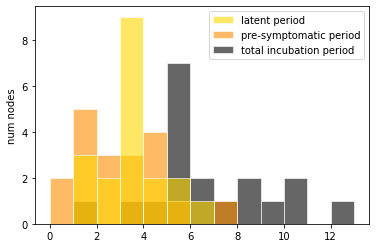

pre-symptomatic period:  mean = 3.87, std = 1.73, 95% CI = (1.60, 7.99)

(a)symptomatic period:  mean = 6.93, std = 2.36, 95% CI = (3.43, 12.03)

total infectious period:  mean = 10.80, std = 3.40, 95% CI = (6.81, 18.94)



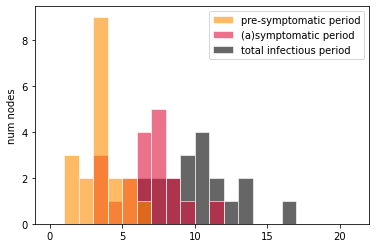

onset-to-hospitalization period:  mean = 9.28, std = 3.56, 95% CI = (4.91, 17.29)

hospitalization-to-discharge period:  mean = 13.80, std = 7.76, 95% CI = (4.14, 30.61)

onset-to-discharge period:  mean = 23.08, std = 8.73, 95% CI = (10.90, 41.18)



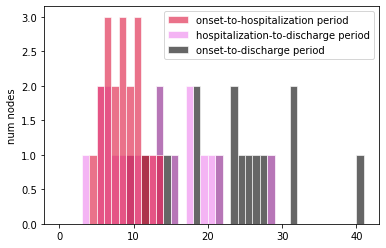

onset-to-hospitalization period:  mean = 9.28, std = 3.56, 95% CI = (4.91, 17.29)

hospitalization-to-death period:  mean = 5.66, std = 2.50, 95% CI = (2.61, 10.40)

onset-to-death period:  mean = 14.94, std = 4.14, 95% CI = (9.49, 22.53)



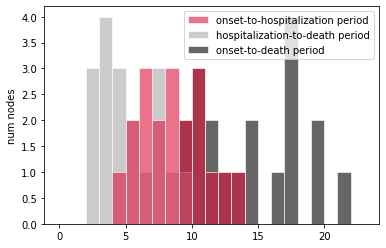

Individual R0:  mean = 2.01, std = 0.43, 95% CI = (1.35, 2.78)



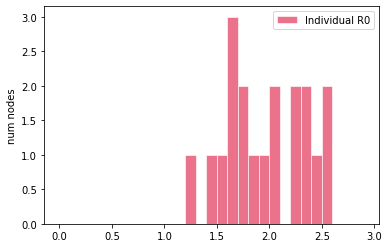

[INTERVENTIONS @ t = 1.09 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 1 positive (5.00 %) +]
	20	tested TOTAL            [+ 1 positive (5.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[NEW EXPOSURE @ t = 5.06 (1 exposed)]
[INTERVENTIONS @ t = 5.06 (3 (15.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of co

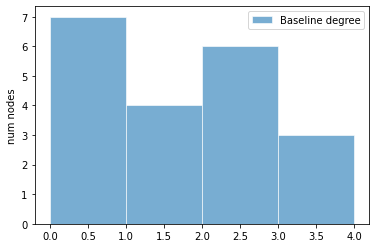

latent period:  mean = 2.81, std = 1.84, 95% CI = (0.55, 7.29)

pre-symptomatic period:  mean = 2.92, std = 2.00, 95% CI = (0.63, 6.65)

total incubation period:  mean = 5.73, std = 2.70, 95% CI = (2.10, 11.57)



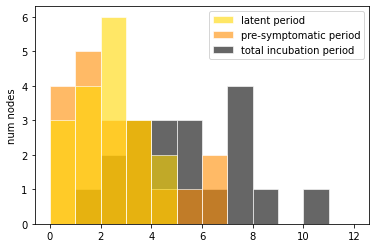

pre-symptomatic period:  mean = 2.81, std = 1.84, 95% CI = (0.55, 7.29)

(a)symptomatic period:  mean = 7.07, std = 2.29, 95% CI = (2.62, 11.01)

total infectious period:  mean = 9.88, std = 3.04, 95% CI = (4.15, 14.66)



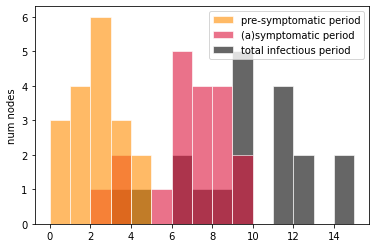

onset-to-hospitalization period:  mean = 6.27, std = 2.24, 95% CI = (2.68, 9.71)

hospitalization-to-discharge period:  mean = 16.55, std = 7.58, 95% CI = (5.54, 31.38)

onset-to-discharge period:  mean = 22.82, std = 7.22, 95% CI = (13.38, 37.39)



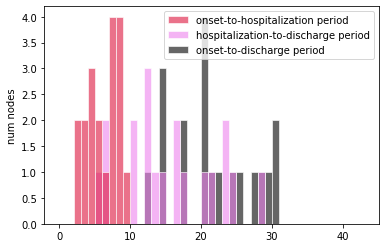

onset-to-hospitalization period:  mean = 6.27, std = 2.24, 95% CI = (2.68, 9.71)

hospitalization-to-death period:  mean = 7.37, std = 4.11, 95% CI = (2.45, 16.56)

onset-to-death period:  mean = 13.64, std = 4.78, 95% CI = (7.78, 25.86)



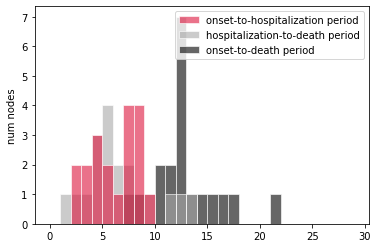

Individual R0:  mean = 1.98, std = 0.53, 95% CI = (1.21, 2.93)



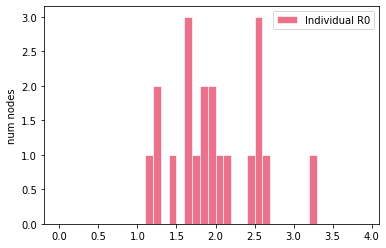

[INTERVENTIONS @ t = 0.76 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 1 positive (5.00 %) +]
	20	tested TOTAL            [+ 1 positive (5.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.01 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVENT

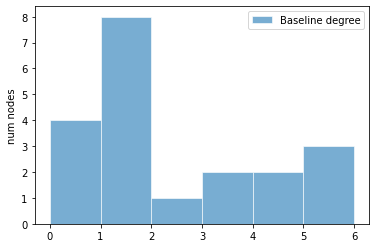

latent period:  mean = 3.52, std = 1.72, 95% CI = (1.25, 7.11)

pre-symptomatic period:  mean = 2.58, std = 1.28, 95% CI = (0.61, 4.93)

total incubation period:  mean = 6.10, std = 2.19, 95% CI = (2.54, 9.70)



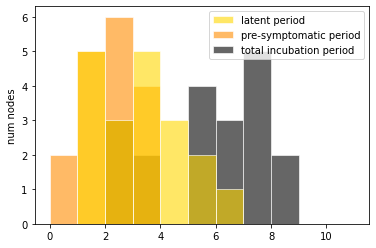

pre-symptomatic period:  mean = 3.52, std = 1.72, 95% CI = (1.25, 7.11)

(a)symptomatic period:  mean = 5.75, std = 1.95, 95% CI = (2.58, 9.12)

total infectious period:  mean = 9.28, std = 2.39, 95% CI = (5.62, 13.62)



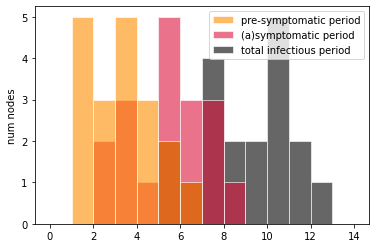

onset-to-hospitalization period:  mean = 7.53, std = 2.93, 95% CI = (3.53, 12.62)

hospitalization-to-discharge period:  mean = 13.47, std = 4.96, 95% CI = (6.19, 22.92)

onset-to-discharge period:  mean = 21.00, std = 6.76, 95% CI = (11.05, 30.86)



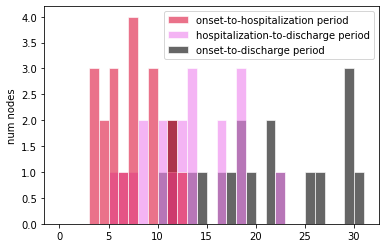

onset-to-hospitalization period:  mean = 7.53, std = 2.93, 95% CI = (3.53, 12.62)

hospitalization-to-death period:  mean = 7.36, std = 3.25, 95% CI = (3.61, 15.31)

onset-to-death period:  mean = 14.89, std = 4.89, 95% CI = (8.66, 27.13)



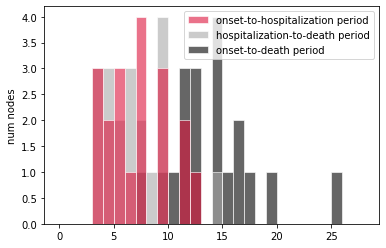

Individual R0:  mean = 2.08, std = 0.44, 95% CI = (1.31, 2.89)



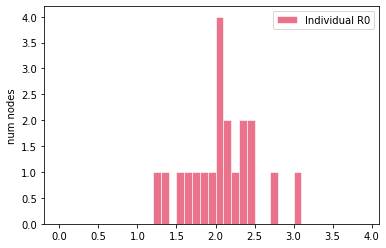

[INTERVENTIONS @ t = 0.47 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 0 positive (0.00 %) +]
	20	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 4.34 (3 (15.00%) infected)]
	1	tested due to symptoms  [+ 1 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	1	tested TOTAL            [+ 1 positive (100.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTER

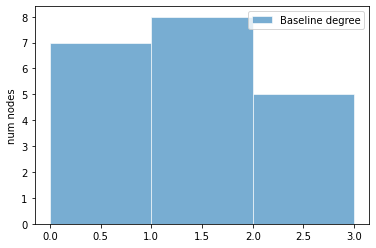

latent period:  mean = 3.16, std = 2.35, 95% CI = (1.06, 9.16)

pre-symptomatic period:  mean = 1.97, std = 1.07, 95% CI = (0.78, 4.52)

total incubation period:  mean = 5.13, std = 2.64, 95% CI = (2.69, 11.47)



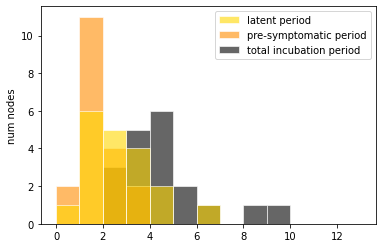

pre-symptomatic period:  mean = 3.16, std = 2.35, 95% CI = (1.06, 9.16)

(a)symptomatic period:  mean = 7.66, std = 3.42, 95% CI = (3.26, 14.79)

total infectious period:  mean = 10.83, std = 3.08, 95% CI = (7.02, 17.13)



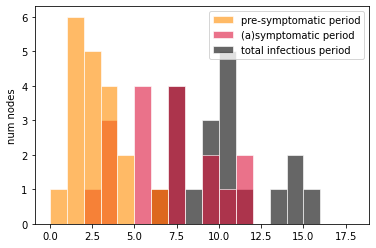

onset-to-hospitalization period:  mean = 8.81, std = 2.97, 95% CI = (3.16, 13.74)

hospitalization-to-discharge period:  mean = 11.85, std = 4.83, 95% CI = (4.16, 19.66)

onset-to-discharge period:  mean = 20.66, std = 6.04, 95% CI = (9.57, 31.01)



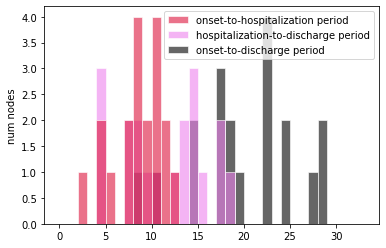

onset-to-hospitalization period:  mean = 8.81, std = 2.97, 95% CI = (3.16, 13.74)

hospitalization-to-death period:  mean = 6.71, std = 2.65, 95% CI = (2.15, 12.63)

onset-to-death period:  mean = 15.52, std = 3.85, 95% CI = (9.65, 21.69)



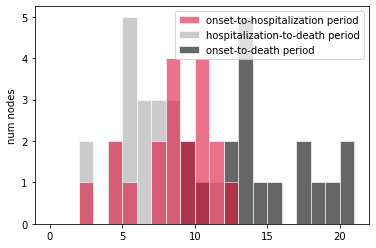

Individual R0:  mean = 2.04, std = 0.45, 95% CI = (1.43, 3.06)



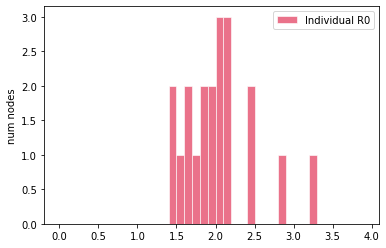

[INTERVENTIONS @ t = 0.87 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 0 positive (0.00 %) +]
	20	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.29 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENT

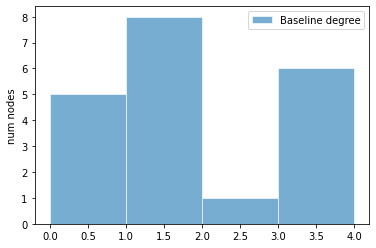

latent period:  mean = 4.61, std = 2.50, 95% CI = (1.17, 9.36)

pre-symptomatic period:  mean = 2.77, std = 1.52, 95% CI = (0.78, 5.88)

total incubation period:  mean = 7.38, std = 2.78, 95% CI = (3.28, 11.99)



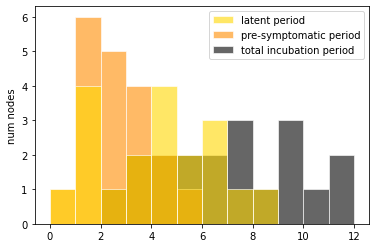

pre-symptomatic period:  mean = 4.61, std = 2.50, 95% CI = (1.17, 9.36)

(a)symptomatic period:  mean = 6.97, std = 2.52, 95% CI = (2.72, 11.94)

total infectious period:  mean = 11.58, std = 3.67, 95% CI = (5.24, 17.53)



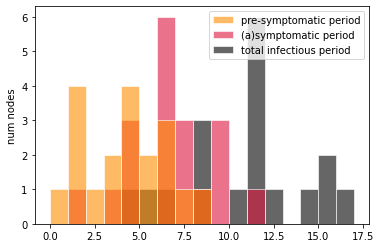

onset-to-hospitalization period:  mean = 8.96, std = 4.63, 95% CI = (3.37, 18.19)

hospitalization-to-discharge period:  mean = 14.72, std = 7.61, 95% CI = (3.97, 30.51)

onset-to-discharge period:  mean = 23.68, std = 10.16, 95% CI = (8.59, 45.21)



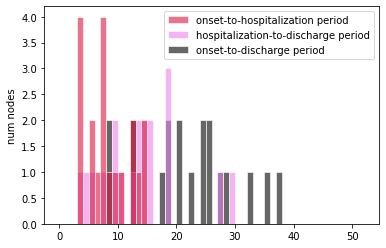

onset-to-hospitalization period:  mean = 8.96, std = 4.63, 95% CI = (3.37, 18.19)

hospitalization-to-death period:  mean = 5.17, std = 1.70, 95% CI = (1.98, 8.12)

onset-to-death period:  mean = 14.12, std = 5.00, 95% CI = (6.18, 23.53)



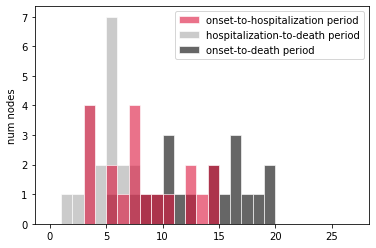

Individual R0:  mean = 2.21, std = 0.48, 95% CI = (1.46, 3.12)



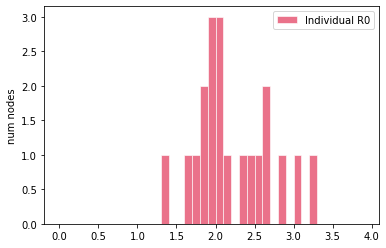

[INTERVENTIONS @ t = 1.00 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 2.01 (4 (20.00%) infected)]
	1	tested due to symptoms  [+ 1 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	1	tested TOTAL            [+ 1 positive (100.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVE

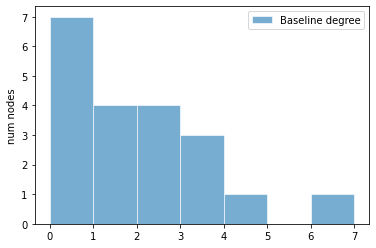

latent period:  mean = 3.27, std = 1.62, 95% CI = (0.62, 6.00)

pre-symptomatic period:  mean = 2.30, std = 0.89, 95% CI = (0.94, 3.99)

total incubation period:  mean = 5.57, std = 2.00, 95% CI = (2.23, 9.47)



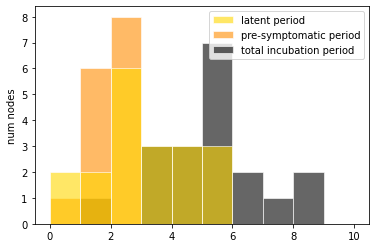

pre-symptomatic period:  mean = 3.27, std = 1.62, 95% CI = (0.62, 6.00)

(a)symptomatic period:  mean = 6.09, std = 2.20, 95% CI = (3.41, 10.98)

total infectious period:  mean = 9.36, std = 2.62, 95% CI = (5.13, 14.61)



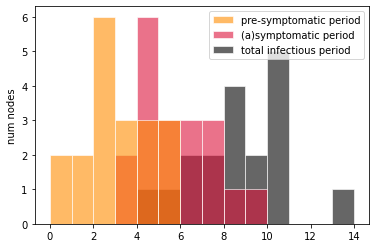

onset-to-hospitalization period:  mean = 7.85, std = 2.48, 95% CI = (3.79, 12.83)

hospitalization-to-discharge period:  mean = 12.09, std = 4.34, 95% CI = (4.28, 19.53)

onset-to-discharge period:  mean = 19.94, std = 4.54, 95% CI = (13.06, 27.68)



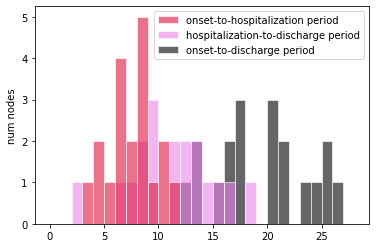

onset-to-hospitalization period:  mean = 7.85, std = 2.48, 95% CI = (3.79, 12.83)

hospitalization-to-death period:  mean = 7.09, std = 3.14, 95% CI = (2.90, 14.35)

onset-to-death period:  mean = 14.94, std = 3.63, 95% CI = (9.26, 21.83)



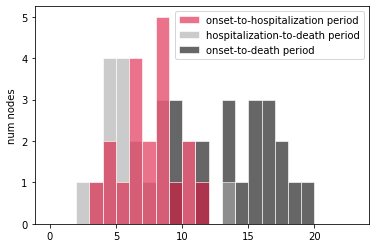

Individual R0:  mean = 2.00, std = 0.30, 95% CI = (1.46, 2.67)



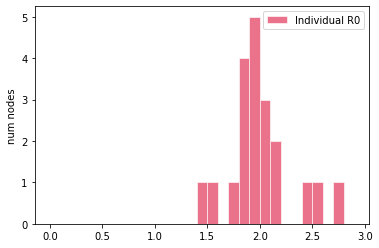

[INTERVENTIONS @ t = 1.56 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 3.93 (2 (10.00%) infected)]
	1	tested due to symptoms  [+ 1 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	1	tested TOTAL            [+ 1 positive (100.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVE

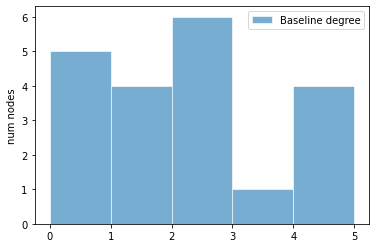

latent period:  mean = 3.61, std = 1.79, 95% CI = (1.06, 6.56)

pre-symptomatic period:  mean = 2.21, std = 1.01, 95% CI = (0.59, 3.97)

total incubation period:  mean = 5.82, std = 2.33, 95% CI = (2.51, 10.04)



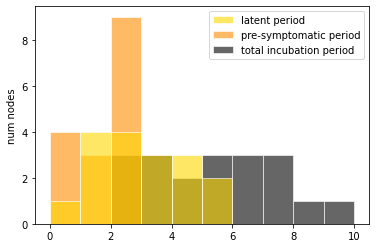

pre-symptomatic period:  mean = 3.61, std = 1.79, 95% CI = (1.06, 6.56)

(a)symptomatic period:  mean = 5.87, std = 2.42, 95% CI = (2.69, 11.12)

total infectious period:  mean = 9.48, std = 2.67, 95% CI = (4.55, 14.06)



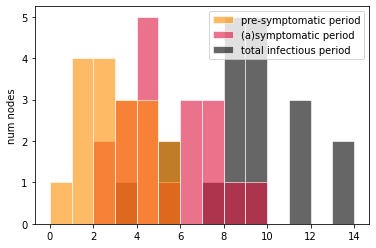

onset-to-hospitalization period:  mean = 7.10, std = 3.83, 95% CI = (3.21, 16.11)

hospitalization-to-discharge period:  mean = 14.13, std = 5.31, 95% CI = (4.48, 22.89)

onset-to-discharge period:  mean = 21.23, std = 7.31, 95% CI = (9.00, 36.06)



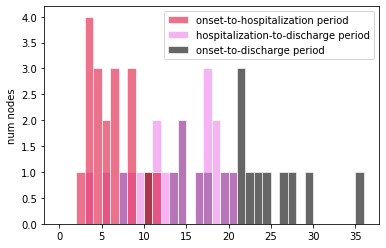

onset-to-hospitalization period:  mean = 7.10, std = 3.83, 95% CI = (3.21, 16.11)

hospitalization-to-death period:  mean = 6.18, std = 2.98, 95% CI = (1.59, 12.49)

onset-to-death period:  mean = 13.28, std = 4.18, 95% CI = (7.13, 20.42)



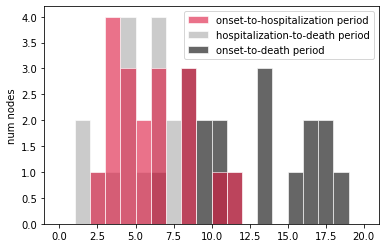

Individual R0:  mean = 2.01, std = 0.45, 95% CI = (1.26, 2.99)



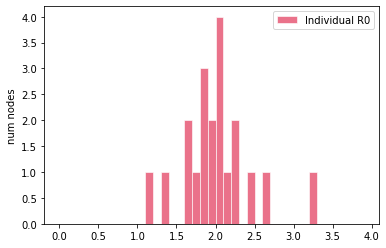

[INTERVENTIONS @ t = 0.27 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 0 positive (0.00 %) +]
	20	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 2.12 (3 (15.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENT

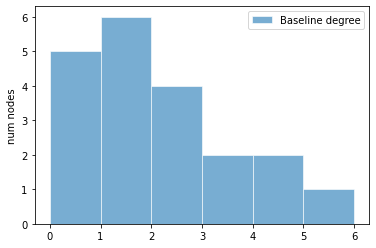

latent period:  mean = 2.79, std = 1.56, 95% CI = (0.84, 5.89)

pre-symptomatic period:  mean = 1.81, std = 1.10, 95% CI = (0.67, 4.35)

total incubation period:  mean = 4.60, std = 1.87, 95% CI = (2.48, 8.10)



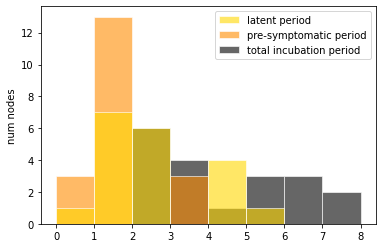

pre-symptomatic period:  mean = 2.79, std = 1.56, 95% CI = (0.84, 5.89)

(a)symptomatic period:  mean = 7.37, std = 2.80, 95% CI = (4.16, 14.61)

total infectious period:  mean = 10.16, std = 3.17, 95% CI = (5.61, 16.91)



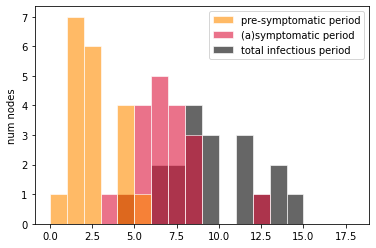

onset-to-hospitalization period:  mean = 7.38, std = 2.89, 95% CI = (2.83, 13.31)

hospitalization-to-discharge period:  mean = 13.76, std = 6.62, 95% CI = (5.28, 28.24)

onset-to-discharge period:  mean = 21.14, std = 7.35, 95% CI = (11.93, 36.88)



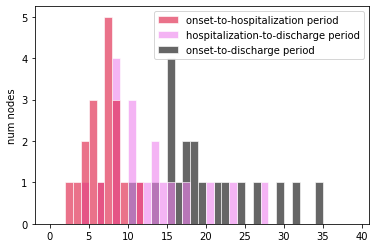

onset-to-hospitalization period:  mean = 7.38, std = 2.89, 95% CI = (2.83, 13.31)

hospitalization-to-death period:  mean = 6.68, std = 3.06, 95% CI = (2.66, 13.62)

onset-to-death period:  mean = 14.06, std = 4.05, 95% CI = (7.43, 20.94)



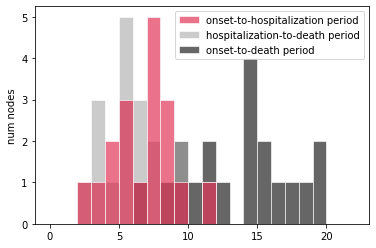

Individual R0:  mean = 1.93, std = 0.40, 95% CI = (1.32, 2.75)



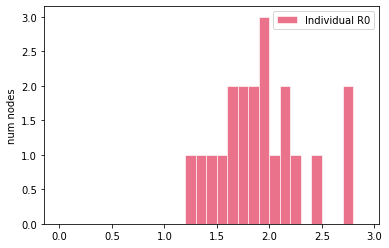

[INTERVENTIONS @ t = 3.98 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 6.81 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIO

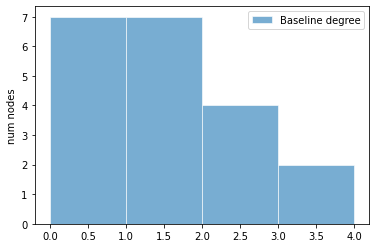

latent period:  mean = 3.42, std = 2.71, 95% CI = (0.50, 9.59)

pre-symptomatic period:  mean = 2.92, std = 1.86, 95% CI = (0.67, 7.12)

total incubation period:  mean = 6.34, std = 3.26, 95% CI = (1.83, 13.11)



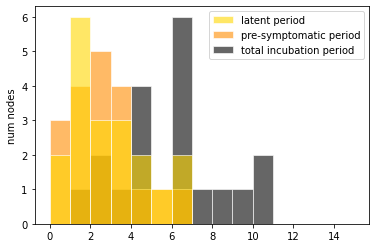

pre-symptomatic period:  mean = 3.42, std = 2.71, 95% CI = (0.50, 9.59)

(a)symptomatic period:  mean = 5.52, std = 1.78, 95% CI = (2.33, 7.78)

total infectious period:  mean = 8.93, std = 3.46, 95% CI = (4.91, 16.63)



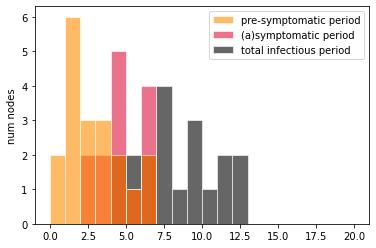

onset-to-hospitalization period:  mean = 8.13, std = 3.11, 95% CI = (3.93, 15.11)

hospitalization-to-discharge period:  mean = 14.28, std = 7.24, 95% CI = (6.67, 29.52)

onset-to-discharge period:  mean = 22.41, std = 7.52, 95% CI = (12.93, 37.17)



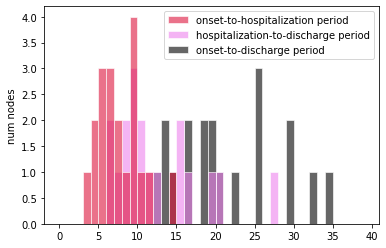

onset-to-hospitalization period:  mean = 8.13, std = 3.11, 95% CI = (3.93, 15.11)

hospitalization-to-death period:  mean = 6.47, std = 2.91, 95% CI = (2.46, 11.86)

onset-to-death period:  mean = 14.60, std = 4.19, 95% CI = (8.09, 21.75)



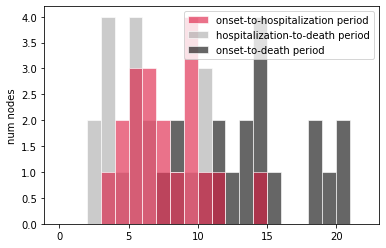

Individual R0:  mean = 2.25, std = 0.62, 95% CI = (1.57, 3.64)



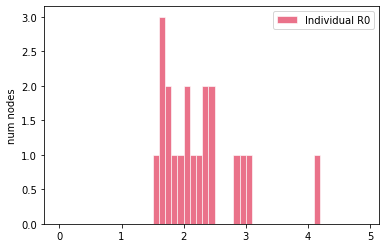

[INTERVENTIONS @ t = 2.64 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 3.05 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIO

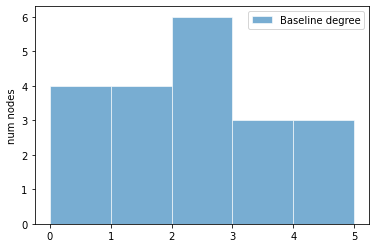

latent period:  mean = 2.70, std = 1.65, 95% CI = (0.49, 6.91)

pre-symptomatic period:  mean = 2.49, std = 1.35, 95% CI = (0.75, 5.85)

total incubation period:  mean = 5.19, std = 2.56, 95% CI = (2.60, 11.83)



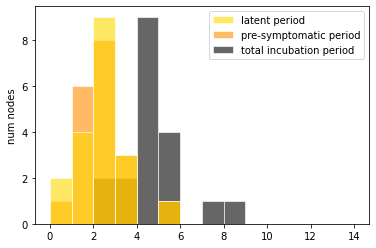

pre-symptomatic period:  mean = 2.70, std = 1.65, 95% CI = (0.49, 6.91)

(a)symptomatic period:  mean = 6.61, std = 2.97, 95% CI = (2.98, 12.37)

total infectious period:  mean = 9.31, std = 2.97, 95% CI = (4.80, 15.31)



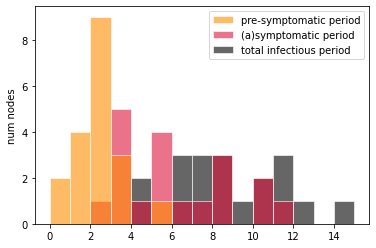

onset-to-hospitalization period:  mean = 8.39, std = 3.48, 95% CI = (2.87, 15.04)

hospitalization-to-discharge period:  mean = 16.38, std = 5.74, 95% CI = (6.68, 25.26)

onset-to-discharge period:  mean = 24.77, std = 6.20, 95% CI = (13.94, 34.33)



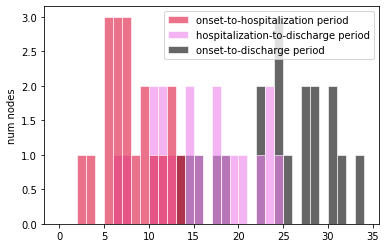

onset-to-hospitalization period:  mean = 8.39, std = 3.48, 95% CI = (2.87, 15.04)

hospitalization-to-death period:  mean = 7.74, std = 3.17, 95% CI = (2.52, 14.61)

onset-to-death period:  mean = 16.12, std = 4.30, 95% CI = (8.27, 25.03)



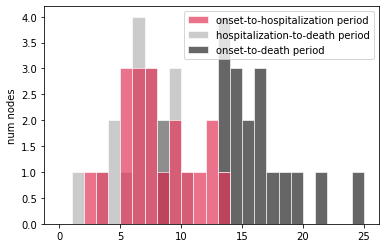

Individual R0:  mean = 2.07, std = 0.34, 95% CI = (1.57, 2.75)



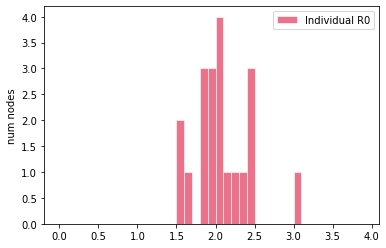

[INTERVENTIONS @ t = 1.48 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 2.58 (2 (10.00%) infected)]
	1	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	1	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIO

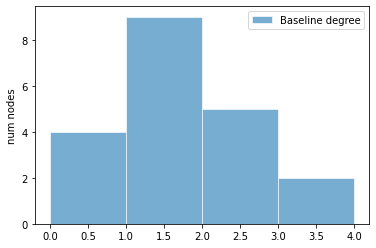

latent period:  mean = 3.74, std = 1.73, 95% CI = (1.48, 7.73)

pre-symptomatic period:  mean = 2.13, std = 1.28, 95% CI = (0.92, 5.24)

total incubation period:  mean = 5.87, std = 1.81, 95% CI = (3.33, 9.78)



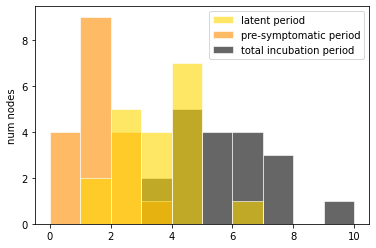

pre-symptomatic period:  mean = 3.74, std = 1.73, 95% CI = (1.48, 7.73)

(a)symptomatic period:  mean = 6.64, std = 2.68, 95% CI = (2.88, 12.28)

total infectious period:  mean = 10.38, std = 2.89, 95% CI = (5.81, 15.85)



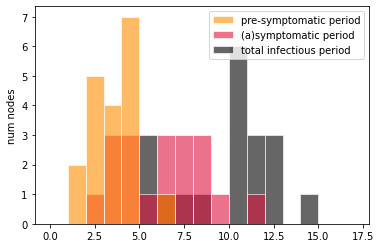

onset-to-hospitalization period:  mean = 9.02, std = 4.44, 95% CI = (3.60, 17.60)

hospitalization-to-discharge period:  mean = 14.81, std = 8.29, 95% CI = (5.90, 34.43)

onset-to-discharge period:  mean = 23.82, std = 9.04, 95% CI = (13.64, 44.37)



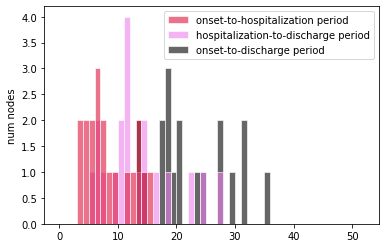

onset-to-hospitalization period:  mean = 9.02, std = 4.44, 95% CI = (3.60, 17.60)

hospitalization-to-death period:  mean = 5.51, std = 2.02, 95% CI = (2.46, 9.33)

onset-to-death period:  mean = 14.53, std = 4.82, 95% CI = (8.42, 25.54)



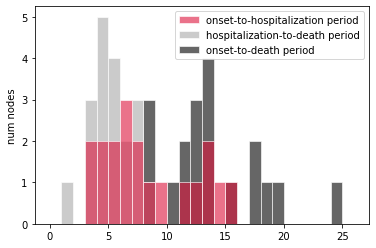

Individual R0:  mean = 1.83, std = 0.34, 95% CI = (1.33, 2.46)



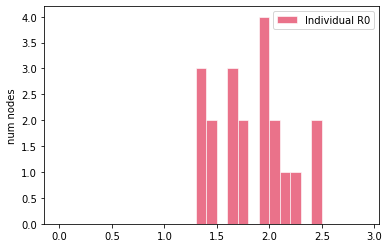

[INTERVENTIONS @ t = 0.33 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 0 positive (0.00 %) +]
	20	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.43 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENT

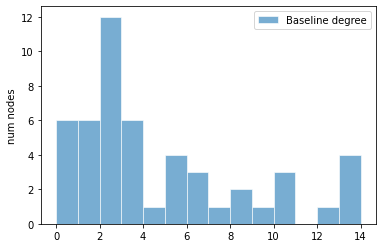

latent period:  mean = 3.47, std = 1.89, 95% CI = (0.61, 7.55)

pre-symptomatic period:  mean = 2.92, std = 1.45, 95% CI = (1.15, 6.44)

total incubation period:  mean = 6.39, std = 2.26, 95% CI = (3.24, 11.48)



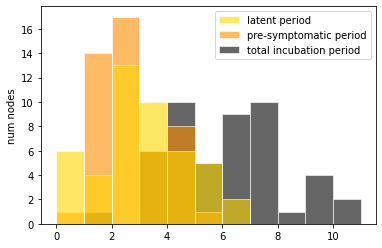

pre-symptomatic period:  mean = 3.47, std = 1.89, 95% CI = (0.61, 7.55)

(a)symptomatic period:  mean = 5.93, std = 2.37, 95% CI = (1.86, 10.52)

total infectious period:  mean = 9.41, std = 3.22, 95% CI = (4.43, 16.08)



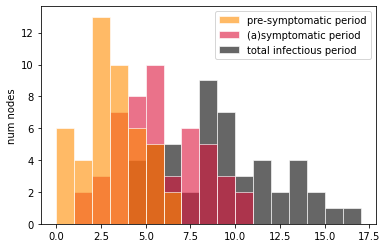

onset-to-hospitalization period:  mean = 8.03, std = 3.83, 95% CI = (2.33, 18.36)

hospitalization-to-discharge period:  mean = 12.40, std = 4.82, 95% CI = (5.46, 21.46)

onset-to-discharge period:  mean = 20.43, std = 5.84, 95% CI = (11.69, 36.65)



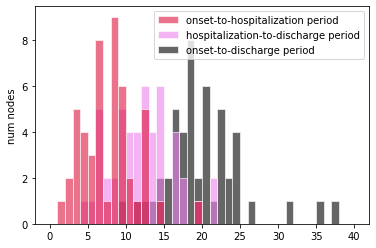

onset-to-hospitalization period:  mean = 8.03, std = 3.83, 95% CI = (2.33, 18.36)

hospitalization-to-death period:  mean = 7.01, std = 3.11, 95% CI = (2.77, 12.76)

onset-to-death period:  mean = 15.04, std = 4.85, 95% CI = (6.84, 25.24)



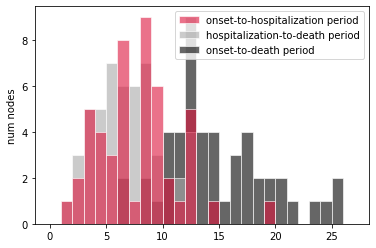

Individual R0:  mean = 1.99, std = 0.34, 95% CI = (1.27, 2.61)



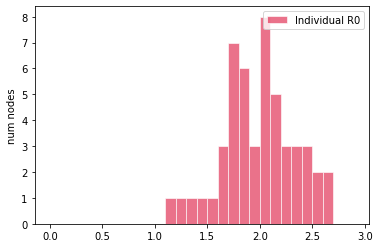

[INTERVENTIONS @ t = 0.01 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 0 positive (0.00 %) +]
	50	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.39 (7 (14.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 3 positive (6.00 %) +]
	50	tested TOTAL            [+ 3 positive (6.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	3 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVE

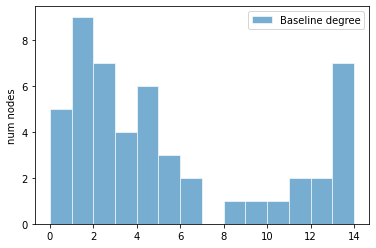

latent period:  mean = 3.47, std = 2.12, 95% CI = (0.61, 8.93)

pre-symptomatic period:  mean = 2.43, std = 1.64, 95% CI = (0.48, 6.69)

total incubation period:  mean = 5.90, std = 2.48, 95% CI = (1.46, 10.76)



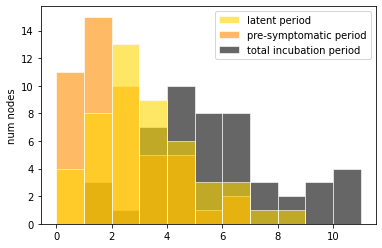

pre-symptomatic period:  mean = 3.47, std = 2.12, 95% CI = (0.61, 8.93)

(a)symptomatic period:  mean = 5.89, std = 1.90, 95% CI = (2.86, 9.67)

total infectious period:  mean = 9.37, std = 2.99, 95% CI = (5.16, 16.16)



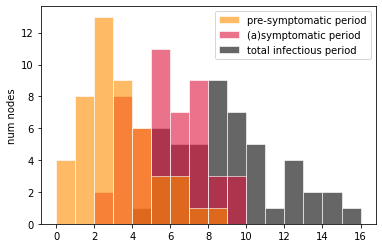

onset-to-hospitalization period:  mean = 8.23, std = 2.85, 95% CI = (3.58, 14.18)

hospitalization-to-discharge period:  mean = 12.53, std = 5.40, 95% CI = (3.78, 23.11)

onset-to-discharge period:  mean = 20.76, std = 5.36, 95% CI = (10.79, 28.33)



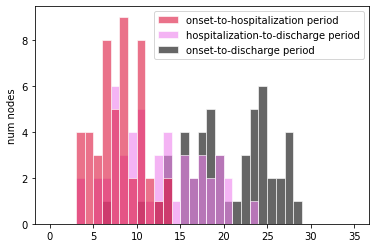

onset-to-hospitalization period:  mean = 8.23, std = 2.85, 95% CI = (3.58, 14.18)

hospitalization-to-death period:  mean = 7.21, std = 3.37, 95% CI = (2.74, 14.14)

onset-to-death period:  mean = 15.44, std = 4.97, 95% CI = (6.50, 27.29)



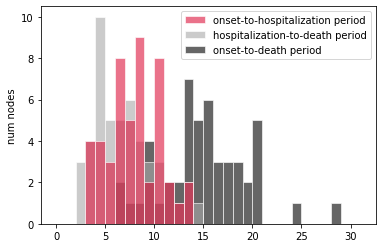

Individual R0:  mean = 2.05, std = 0.43, 95% CI = (1.31, 3.00)



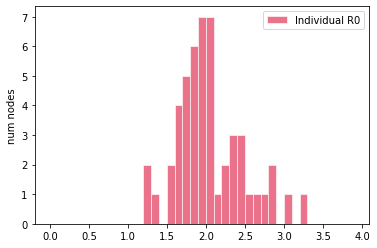

[INTERVENTIONS @ t = 1.04 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 2.05 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	49	tested randomly         [+ 0 positive (0.00 %) +]
	49	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVE

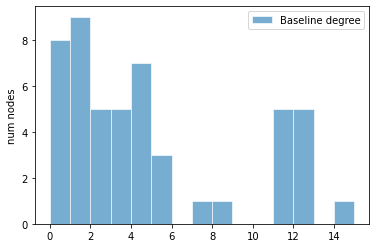

latent period:  mean = 3.50, std = 1.89, 95% CI = (0.79, 7.03)

pre-symptomatic period:  mean = 2.33, std = 1.39, 95% CI = (0.73, 6.08)

total incubation period:  mean = 5.82, std = 2.21, 95% CI = (2.54, 9.47)



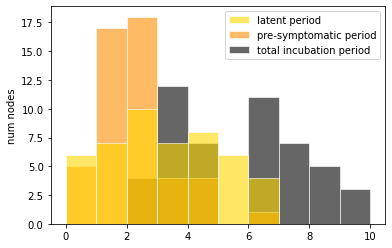

pre-symptomatic period:  mean = 3.50, std = 1.89, 95% CI = (0.79, 7.03)

(a)symptomatic period:  mean = 6.44, std = 2.99, 95% CI = (2.84, 12.43)

total infectious period:  mean = 9.93, std = 3.59, 95% CI = (4.80, 17.97)



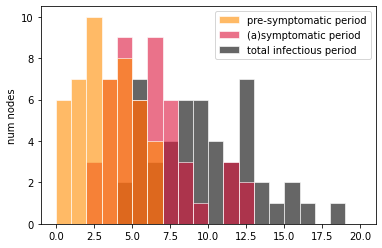

onset-to-hospitalization period:  mean = 7.72, std = 3.39, 95% CI = (2.91, 14.50)

hospitalization-to-discharge period:  mean = 12.29, std = 5.15, 95% CI = (4.50, 26.33)

onset-to-discharge period:  mean = 20.02, std = 5.57, 95% CI = (12.50, 30.93)



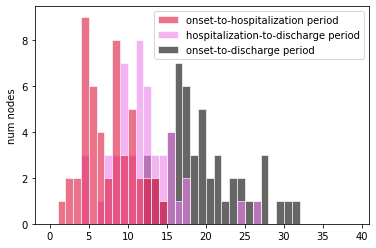

onset-to-hospitalization period:  mean = 7.72, std = 3.39, 95% CI = (2.91, 14.50)

hospitalization-to-death period:  mean = 7.63, std = 3.87, 95% CI = (2.63, 15.66)

onset-to-death period:  mean = 15.35, std = 5.20, 95% CI = (7.20, 26.73)



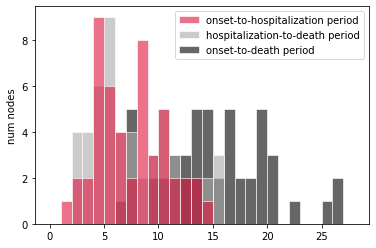

Individual R0:  mean = 2.08, std = 0.45, 95% CI = (1.32, 2.90)



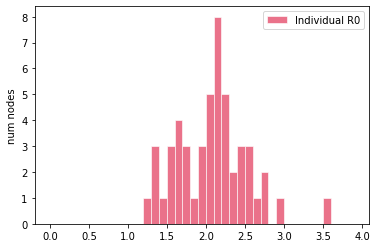

[INTERVENTIONS @ t = 0.02 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 2.03 (5 (10.00%) infected)]
	1	tested due to symptoms  [+ 1 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	49	tested randomly         [+ 2 positive (4.08 %) +]
	50	tested TOTAL            [+ 3 positive (6.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	3 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTER

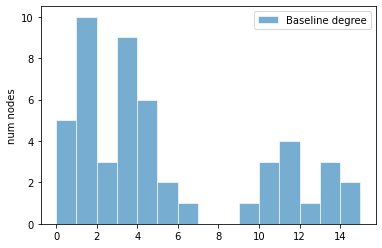

latent period:  mean = 3.44, std = 1.94, 95% CI = (0.83, 7.59)

pre-symptomatic period:  mean = 2.63, std = 1.55, 95% CI = (0.77, 6.45)

total incubation period:  mean = 6.07, std = 2.73, 95% CI = (2.40, 11.79)



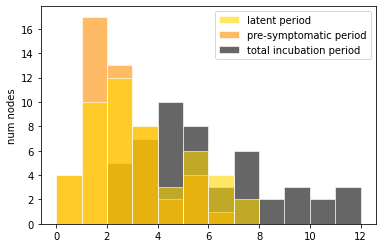

pre-symptomatic period:  mean = 3.44, std = 1.94, 95% CI = (0.83, 7.59)

(a)symptomatic period:  mean = 6.73, std = 2.59, 95% CI = (2.83, 12.11)

total infectious period:  mean = 10.17, std = 2.98, 95% CI = (5.42, 16.04)



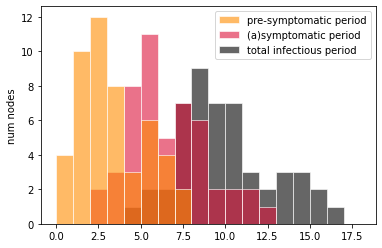

onset-to-hospitalization period:  mean = 8.66, std = 3.31, 95% CI = (3.73, 16.15)

hospitalization-to-discharge period:  mean = 13.45, std = 5.57, 95% CI = (5.03, 25.18)

onset-to-discharge period:  mean = 22.11, std = 6.03, 95% CI = (11.89, 34.37)



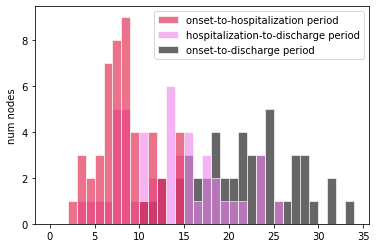

onset-to-hospitalization period:  mean = 8.66, std = 3.31, 95% CI = (3.73, 16.15)

hospitalization-to-death period:  mean = 6.76, std = 3.20, 95% CI = (2.47, 13.48)

onset-to-death period:  mean = 15.42, std = 4.54, 95% CI = (7.71, 23.24)



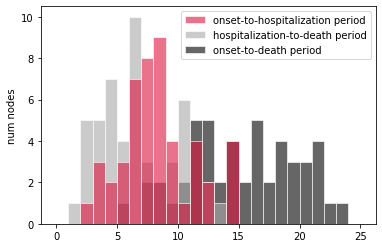

Individual R0:  mean = 1.91, std = 0.39, 95% CI = (1.27, 2.72)



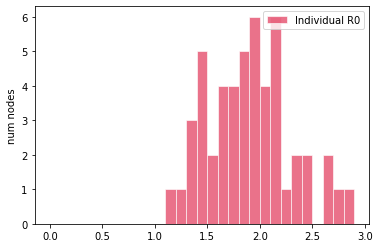

[INTERVENTIONS @ t = 0.20 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[NEW EXPOSURE @ t = 1.30 (1 exposed)]
[INTERVENTIONS @ t = 1.30 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	49	tested randomly         [+ 2 positive (4.08 %) +]
	49	tested TOTAL            [+ 2 positive (4.08 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	2 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of 

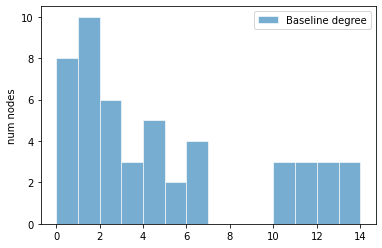

latent period:  mean = 4.27, std = 2.39, 95% CI = (1.09, 10.31)

pre-symptomatic period:  mean = 2.64, std = 1.74, 95% CI = (0.71, 6.61)

total incubation period:  mean = 6.91, std = 3.31, 95% CI = (2.27, 13.26)



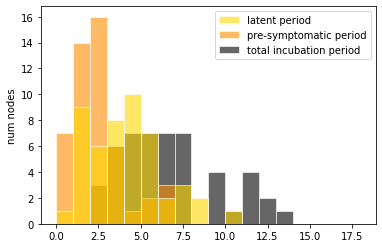

pre-symptomatic period:  mean = 4.27, std = 2.39, 95% CI = (1.09, 10.31)

(a)symptomatic period:  mean = 7.20, std = 3.22, 95% CI = (3.17, 15.14)

total infectious period:  mean = 11.48, std = 4.32, 95% CI = (5.75, 20.59)



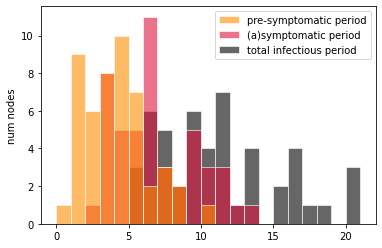

onset-to-hospitalization period:  mean = 6.75, std = 3.30, 95% CI = (1.93, 13.28)

hospitalization-to-discharge period:  mean = 13.30, std = 5.55, 95% CI = (4.42, 23.72)

onset-to-discharge period:  mean = 20.05, std = 7.38, 95% CI = (9.63, 34.83)



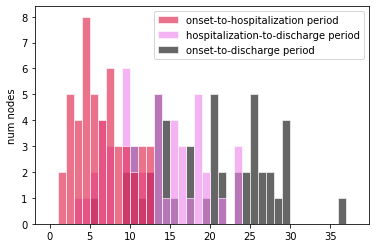

onset-to-hospitalization period:  mean = 6.75, std = 3.30, 95% CI = (1.93, 13.28)

hospitalization-to-death period:  mean = 7.28, std = 2.96, 95% CI = (3.37, 14.49)

onset-to-death period:  mean = 14.03, std = 4.84, 95% CI = (7.09, 24.82)



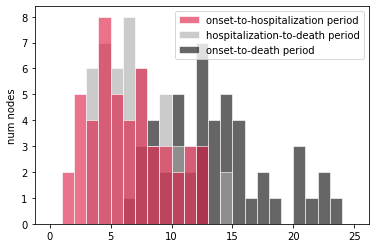

Individual R0:  mean = 2.09, std = 0.34, 95% CI = (1.49, 2.79)



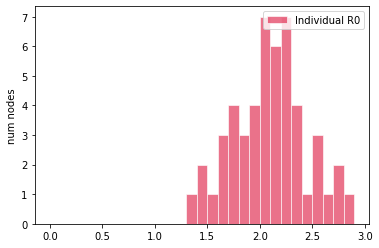

[INTERVENTIONS @ t = 0.11 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 0 positive (0.00 %) +]
	50	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.21 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 4 positive (8.00 %) +]
	50	tested TOTAL            [+ 4 positive (8.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	4 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVE

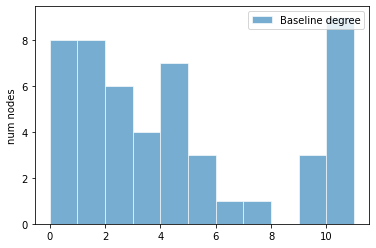

latent period:  mean = 3.54, std = 2.60, 95% CI = (0.97, 11.29)

pre-symptomatic period:  mean = 2.66, std = 1.67, 95% CI = (0.62, 6.70)

total incubation period:  mean = 6.19, std = 3.25, 95% CI = (2.50, 13.39)



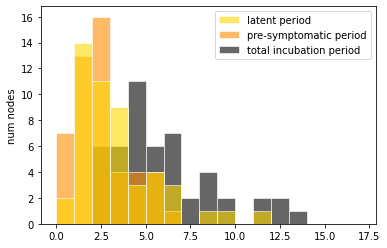

pre-symptomatic period:  mean = 3.54, std = 2.60, 95% CI = (0.97, 11.29)

(a)symptomatic period:  mean = 6.08, std = 2.24, 95% CI = (2.90, 10.55)

total infectious period:  mean = 9.62, std = 3.45, 95% CI = (3.89, 17.35)



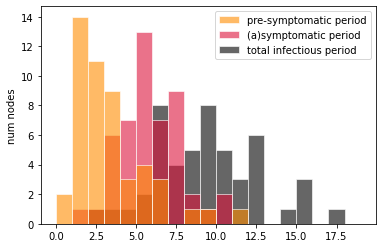

onset-to-hospitalization period:  mean = 8.73, std = 3.63, 95% CI = (2.89, 14.80)

hospitalization-to-discharge period:  mean = 14.59, std = 6.46, 95% CI = (5.99, 30.59)

onset-to-discharge period:  mean = 23.32, std = 7.46, 95% CI = (11.70, 39.60)



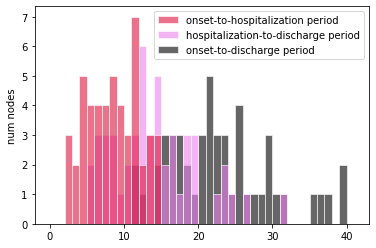

onset-to-hospitalization period:  mean = 8.73, std = 3.63, 95% CI = (2.89, 14.80)

hospitalization-to-death period:  mean = 6.41, std = 2.73, 95% CI = (2.36, 11.78)

onset-to-death period:  mean = 15.13, std = 4.73, 95% CI = (7.77, 24.02)



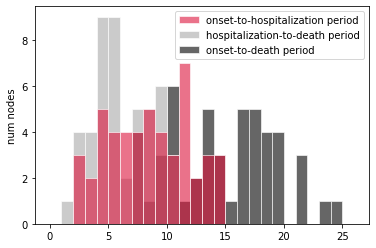

Individual R0:  mean = 1.94, std = 0.39, 95% CI = (1.23, 2.75)



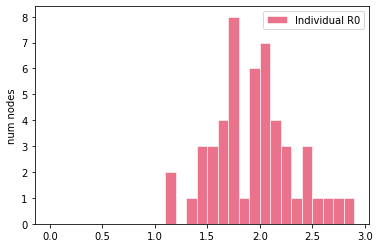

[INTERVENTIONS @ t = 0.24 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.04 (6 (12.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	49	tested randomly         [+ 2 positive (4.08 %) +]
	49	tested TOTAL            [+ 2 positive (4.08 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	2 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVE

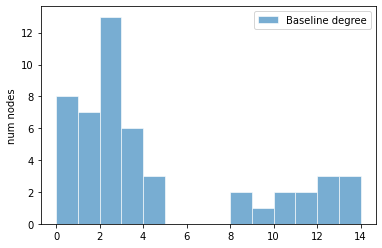

latent period:  mean = 3.28, std = 2.21, 95% CI = (0.49, 8.96)

pre-symptomatic period:  mean = 2.35, std = 1.32, 95% CI = (0.64, 5.33)

total incubation period:  mean = 5.63, std = 2.49, 95% CI = (1.97, 11.87)



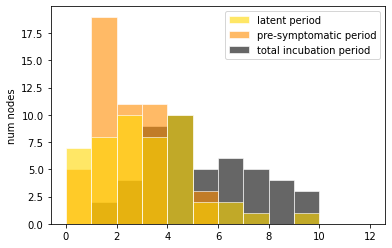

pre-symptomatic period:  mean = 3.28, std = 2.21, 95% CI = (0.49, 8.96)

(a)symptomatic period:  mean = 6.31, std = 2.33, 95% CI = (1.81, 10.55)

total infectious period:  mean = 9.59, std = 3.48, 95% CI = (2.79, 16.54)



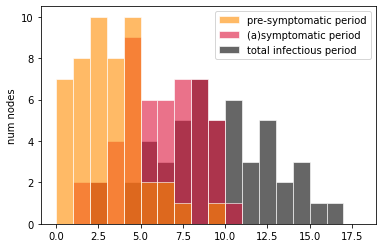

onset-to-hospitalization period:  mean = 8.93, std = 3.40, 95% CI = (3.79, 15.55)

hospitalization-to-discharge period:  mean = 15.48, std = 8.10, 95% CI = (4.96, 35.51)

onset-to-discharge period:  mean = 24.41, std = 8.41, 95% CI = (12.79, 43.93)



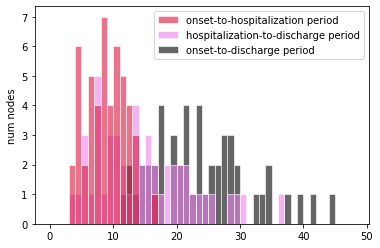

onset-to-hospitalization period:  mean = 8.93, std = 3.40, 95% CI = (3.79, 15.55)

hospitalization-to-death period:  mean = 7.41, std = 2.94, 95% CI = (3.26, 12.62)

onset-to-death period:  mean = 16.34, std = 3.98, 95% CI = (9.49, 24.97)



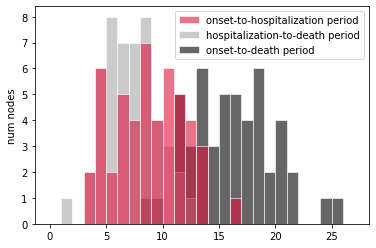

Individual R0:  mean = 2.02, std = 0.37, 95% CI = (1.45, 2.80)



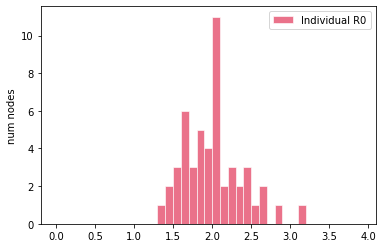

[INTERVENTIONS @ t = 0.13 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.27 (6 (12.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	49	tested randomly         [+ 3 positive (6.12 %) +]
	49	tested TOTAL            [+ 3 positive (6.12 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	3 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVE

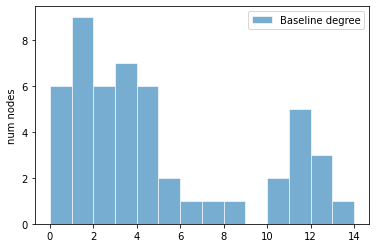

latent period:  mean = 3.61, std = 1.99, 95% CI = (1.06, 7.22)

pre-symptomatic period:  mean = 2.46, std = 1.31, 95% CI = (0.66, 4.97)

total incubation period:  mean = 6.07, std = 2.41, 95% CI = (2.25, 10.52)



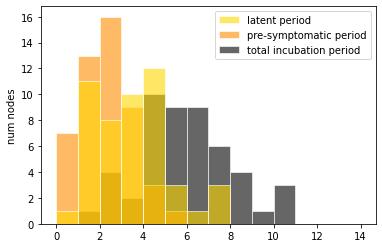

pre-symptomatic period:  mean = 3.61, std = 1.99, 95% CI = (1.06, 7.22)

(a)symptomatic period:  mean = 6.40, std = 2.79, 95% CI = (2.15, 13.30)

total infectious period:  mean = 10.01, std = 3.38, 95% CI = (4.82, 17.10)



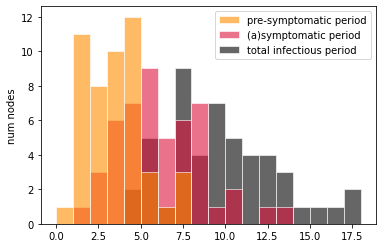

onset-to-hospitalization period:  mean = 7.84, std = 3.55, 95% CI = (1.72, 14.81)

hospitalization-to-discharge period:  mean = 13.94, std = 5.93, 95% CI = (2.22, 26.29)

onset-to-discharge period:  mean = 21.78, std = 7.12, 95% CI = (7.11, 35.97)



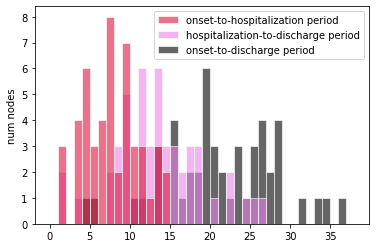

onset-to-hospitalization period:  mean = 7.84, std = 3.55, 95% CI = (1.72, 14.81)

hospitalization-to-death period:  mean = 7.01, std = 2.47, 95% CI = (3.26, 11.45)

onset-to-death period:  mean = 14.85, std = 4.40, 95% CI = (8.03, 23.49)



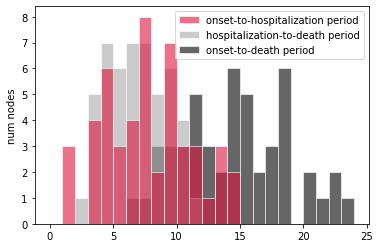

Individual R0:  mean = 2.03, std = 0.38, 95% CI = (1.38, 2.81)



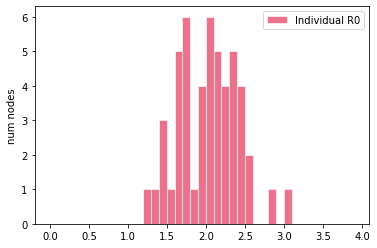

[INTERVENTIONS @ t = 0.30 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.16 (6 (12.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	49	tested randomly         [+ 0 positive (0.00 %) +]
	49	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVE

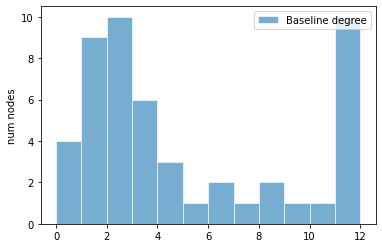

latent period:  mean = 3.65, std = 1.94, 95% CI = (0.97, 7.56)

pre-symptomatic period:  mean = 2.46, std = 1.47, 95% CI = (0.57, 6.14)

total incubation period:  mean = 6.12, std = 2.31, 95% CI = (2.71, 10.02)



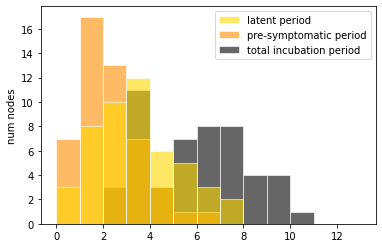

pre-symptomatic period:  mean = 3.65, std = 1.94, 95% CI = (0.97, 7.56)

(a)symptomatic period:  mean = 7.47, std = 2.73, 95% CI = (3.26, 13.72)

total infectious period:  mean = 11.12, std = 3.43, 95% CI = (5.77, 19.43)



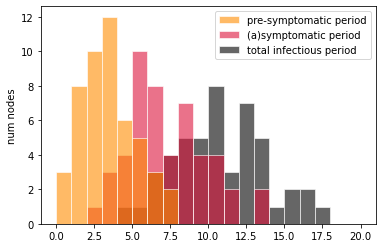

onset-to-hospitalization period:  mean = 6.87, std = 2.98, 95% CI = (2.69, 13.70)

hospitalization-to-discharge period:  mean = 14.93, std = 5.42, 95% CI = (6.11, 25.85)

onset-to-discharge period:  mean = 21.80, std = 6.19, 95% CI = (11.38, 32.68)



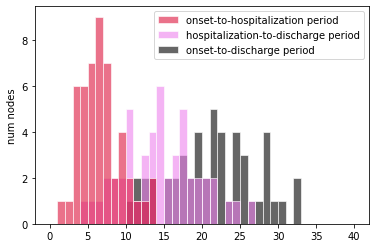

onset-to-hospitalization period:  mean = 6.87, std = 2.98, 95% CI = (2.69, 13.70)

hospitalization-to-death period:  mean = 7.11, std = 3.21, 95% CI = (2.21, 13.90)

onset-to-death period:  mean = 13.97, std = 3.42, 95% CI = (7.59, 19.89)



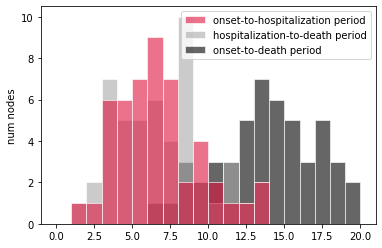

Individual R0:  mean = 2.00, std = 0.36, 95% CI = (1.51, 2.74)



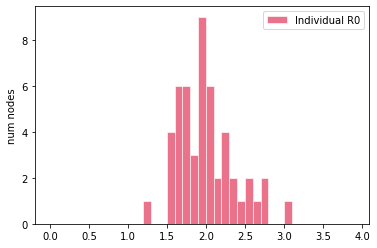

[INTERVENTIONS @ t = 0.54 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 0 positive (0.00 %) +]
	50	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.33 (6 (12.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 2 positive (4.00 %) +]
	50	tested TOTAL            [+ 2 positive (4.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	2 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVE

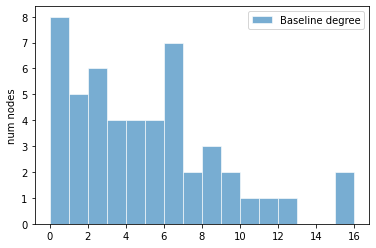

latent period:  mean = 3.71, std = 2.42, 95% CI = (1.01, 10.22)

pre-symptomatic period:  mean = 2.70, std = 1.41, 95% CI = (0.76, 6.06)

total incubation period:  mean = 6.41, std = 2.70, 95% CI = (2.58, 12.69)



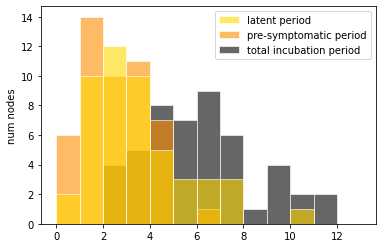

pre-symptomatic period:  mean = 3.71, std = 2.42, 95% CI = (1.01, 10.22)

(a)symptomatic period:  mean = 6.85, std = 2.29, 95% CI = (3.05, 11.51)

total infectious period:  mean = 10.55, std = 3.09, 95% CI = (6.48, 17.24)



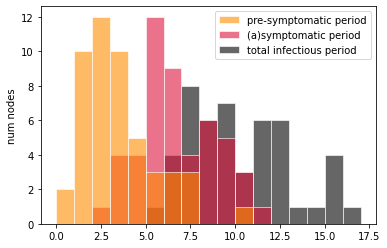

onset-to-hospitalization period:  mean = 8.30, std = 3.77, 95% CI = (2.54, 16.26)

hospitalization-to-discharge period:  mean = 13.52, std = 6.34, 95% CI = (3.76, 27.33)

onset-to-discharge period:  mean = 21.83, std = 8.15, 95% CI = (9.11, 41.70)



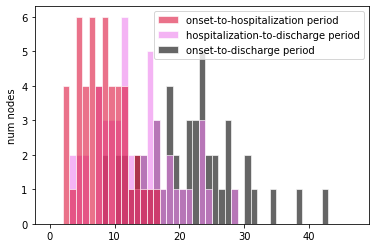

onset-to-hospitalization period:  mean = 8.30, std = 3.77, 95% CI = (2.54, 16.26)

hospitalization-to-death period:  mean = 7.34, std = 3.77, 95% CI = (2.02, 15.29)

onset-to-death period:  mean = 15.65, std = 5.74, 95% CI = (6.06, 24.90)



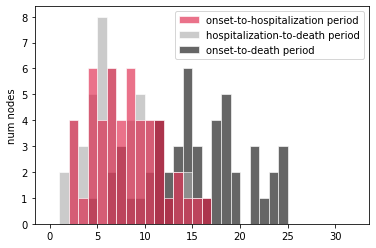

Individual R0:  mean = 1.96, std = 0.37, 95% CI = (1.33, 2.65)



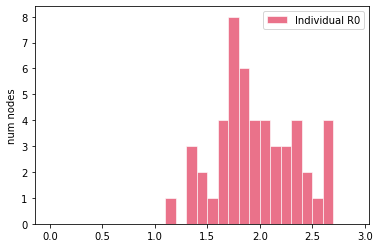

[INTERVENTIONS @ t = 0.13 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 2.47 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	49	tested randomly         [+ 2 positive (4.08 %) +]
	49	tested TOTAL            [+ 2 positive (4.08 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	2 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVE

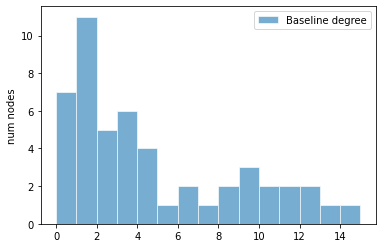

latent period:  mean = 3.31, std = 1.68, 95% CI = (0.57, 6.56)

pre-symptomatic period:  mean = 2.45, std = 1.57, 95% CI = (0.62, 6.73)

total incubation period:  mean = 5.76, std = 2.50, 95% CI = (2.02, 10.62)



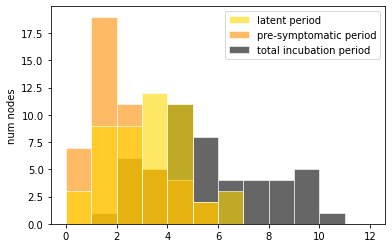

pre-symptomatic period:  mean = 3.31, std = 1.68, 95% CI = (0.57, 6.56)

(a)symptomatic period:  mean = 6.35, std = 2.22, 95% CI = (2.84, 10.93)

total infectious period:  mean = 9.66, std = 2.86, 95% CI = (4.34, 14.89)



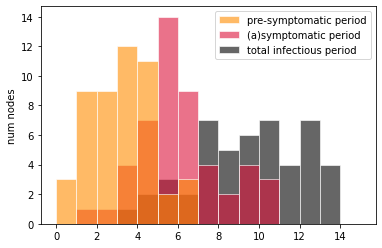

onset-to-hospitalization period:  mean = 8.90, std = 4.74, 95% CI = (2.86, 18.00)

hospitalization-to-discharge period:  mean = 15.04, std = 6.00, 95% CI = (5.13, 26.28)

onset-to-discharge period:  mean = 23.94, std = 7.69, 95% CI = (14.25, 40.53)



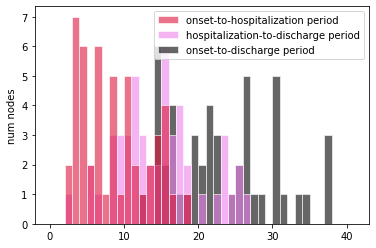

onset-to-hospitalization period:  mean = 8.90, std = 4.74, 95% CI = (2.86, 18.00)

hospitalization-to-death period:  mean = 6.54, std = 3.26, 95% CI = (1.35, 14.21)

onset-to-death period:  mean = 15.43, std = 5.50, 95% CI = (5.76, 25.38)



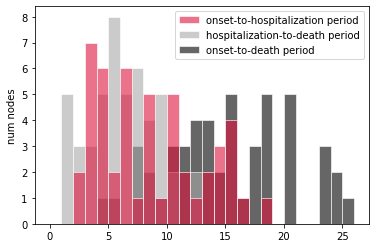

Individual R0:  mean = 1.97, std = 0.43, 95% CI = (1.32, 2.81)



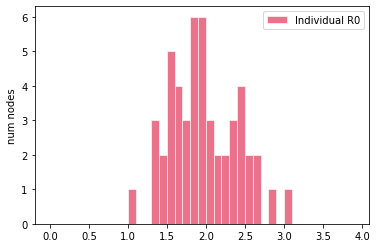

[INTERVENTIONS @ t = 0.05 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 3.09 (6 (12.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVENT

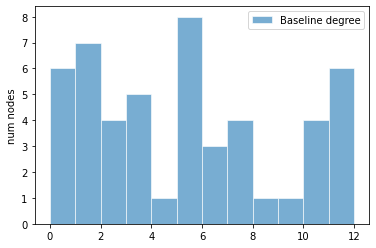

latent period:  mean = 3.98, std = 2.09, 95% CI = (1.08, 9.05)

pre-symptomatic period:  mean = 3.00, std = 1.42, 95% CI = (0.66, 5.56)

total incubation period:  mean = 6.98, std = 2.66, 95% CI = (2.75, 12.57)



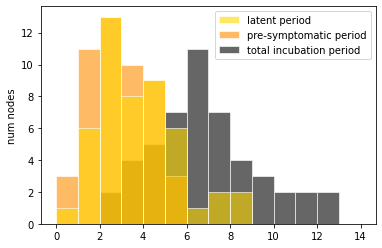

pre-symptomatic period:  mean = 3.98, std = 2.09, 95% CI = (1.08, 9.05)

(a)symptomatic period:  mean = 6.49, std = 2.59, 95% CI = (2.03, 12.66)

total infectious period:  mean = 10.48, std = 3.52, 95% CI = (5.12, 18.15)



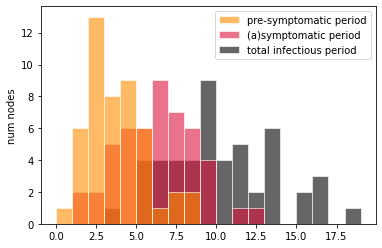

onset-to-hospitalization period:  mean = 8.50, std = 3.13, 95% CI = (3.59, 15.53)

hospitalization-to-discharge period:  mean = 14.53, std = 6.49, 95% CI = (5.79, 27.80)

onset-to-discharge period:  mean = 23.03, std = 7.15, 95% CI = (10.96, 34.53)



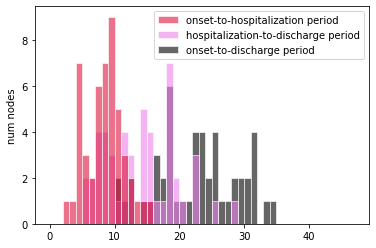

onset-to-hospitalization period:  mean = 8.50, std = 3.13, 95% CI = (3.59, 15.53)

hospitalization-to-death period:  mean = 7.81, std = 3.96, 95% CI = (1.91, 16.48)

onset-to-death period:  mean = 16.30, std = 4.32, 95% CI = (9.52, 26.32)



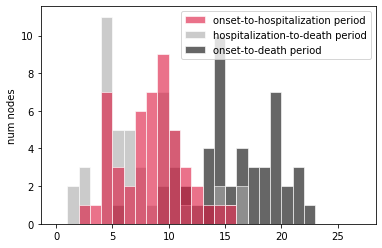

Individual R0:  mean = 1.96, std = 0.44, 95% CI = (1.29, 2.77)



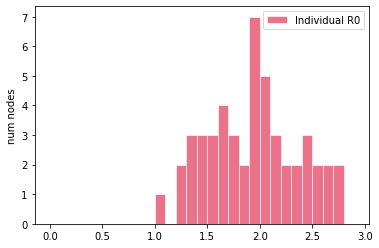

[INTERVENTIONS @ t = 0.15 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.54 (6 (12.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVENT

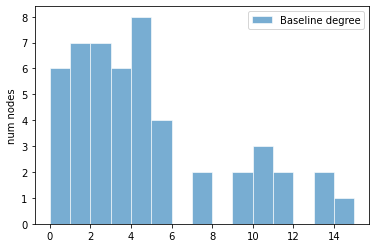

latent period:  mean = 4.15, std = 2.39, 95% CI = (0.89, 9.51)

pre-symptomatic period:  mean = 2.63, std = 1.47, 95% CI = (0.48, 5.63)

total incubation period:  mean = 6.78, std = 2.74, 95% CI = (2.71, 12.41)



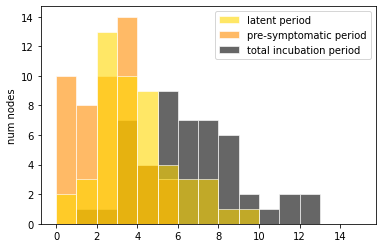

pre-symptomatic period:  mean = 4.15, std = 2.39, 95% CI = (0.89, 9.51)

(a)symptomatic period:  mean = 6.82, std = 2.58, 95% CI = (2.98, 11.67)

total infectious period:  mean = 10.96, std = 3.53, 95% CI = (5.83, 19.73)



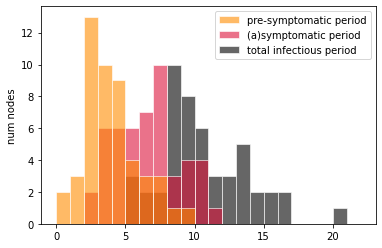

onset-to-hospitalization period:  mean = 8.27, std = 4.14, 95% CI = (2.91, 16.19)

hospitalization-to-discharge period:  mean = 15.37, std = 5.54, 95% CI = (6.73, 24.81)

onset-to-discharge period:  mean = 23.64, std = 6.80, 95% CI = (13.48, 38.28)



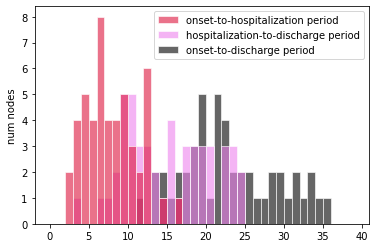

onset-to-hospitalization period:  mean = 8.27, std = 4.14, 95% CI = (2.91, 16.19)

hospitalization-to-death period:  mean = 7.36, std = 3.45, 95% CI = (3.00, 13.22)

onset-to-death period:  mean = 15.62, std = 5.59, 95% CI = (7.33, 26.54)



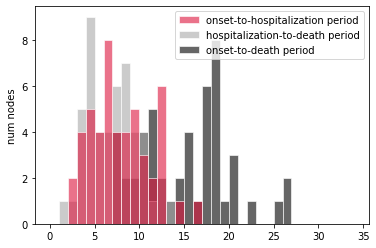

Individual R0:  mean = 1.94, std = 0.40, 95% CI = (1.33, 2.80)



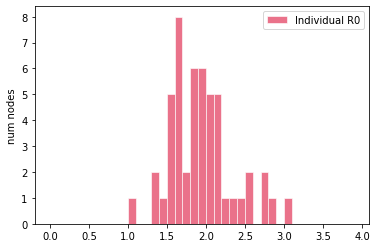

[INTERVENTIONS @ t = 0.02 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.84 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVENT

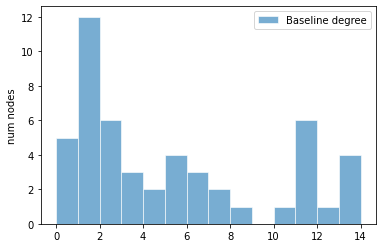

latent period:  mean = 3.76, std = 2.64, 95% CI = (0.50, 10.00)

pre-symptomatic period:  mean = 2.45, std = 1.56, 95% CI = (0.42, 6.22)

total incubation period:  mean = 6.21, std = 2.99, 95% CI = (1.99, 12.29)



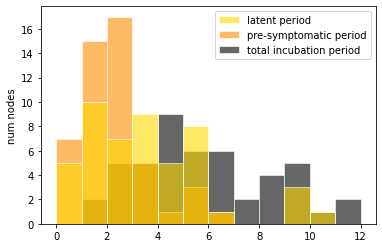

pre-symptomatic period:  mean = 3.76, std = 2.64, 95% CI = (0.50, 10.00)

(a)symptomatic period:  mean = 6.40, std = 2.37, 95% CI = (2.93, 12.00)

total infectious period:  mean = 10.16, std = 3.79, 95% CI = (4.11, 18.53)



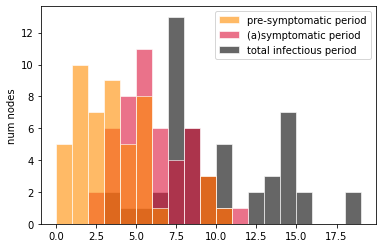

onset-to-hospitalization period:  mean = 7.98, std = 3.33, 95% CI = (3.41, 16.44)

hospitalization-to-discharge period:  mean = 12.30, std = 5.56, 95% CI = (4.68, 22.71)

onset-to-discharge period:  mean = 20.28, std = 6.76, 95% CI = (9.98, 32.02)



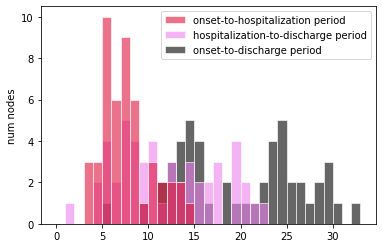

onset-to-hospitalization period:  mean = 7.98, std = 3.33, 95% CI = (3.41, 16.44)

hospitalization-to-death period:  mean = 7.06, std = 3.64, 95% CI = (2.88, 18.15)

onset-to-death period:  mean = 15.04, std = 4.90, 95% CI = (8.00, 27.59)



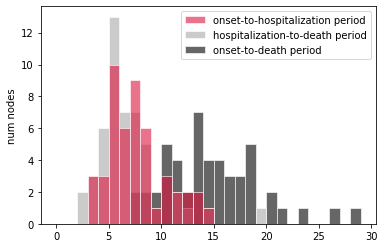

Individual R0:  mean = 2.09, std = 0.41, 95% CI = (1.31, 2.84)



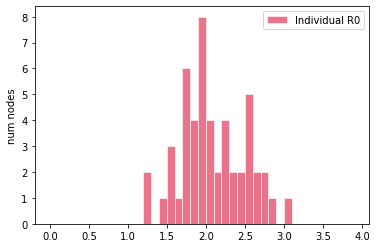

[INTERVENTIONS @ t = 0.06 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 0 positive (0.00 %) +]
	50	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 2.04 (5 (10.00%) infected)]
	2	tested due to symptoms  [+ 2 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	2	tested TOTAL            [+ 2 positive (100.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	2 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTER

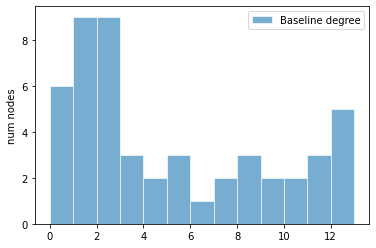

latent period:  mean = 3.80, std = 2.57, 95% CI = (1.13, 11.22)

pre-symptomatic period:  mean = 2.18, std = 1.18, 95% CI = (0.54, 4.59)

total incubation period:  mean = 5.98, std = 2.79, 95% CI = (2.04, 13.76)



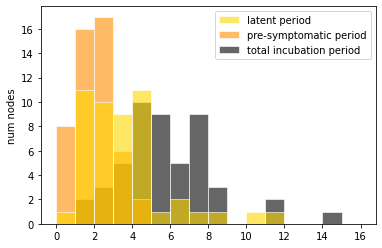

pre-symptomatic period:  mean = 3.80, std = 2.57, 95% CI = (1.13, 11.22)

(a)symptomatic period:  mean = 6.25, std = 2.13, 95% CI = (2.62, 9.64)

total infectious period:  mean = 10.05, std = 3.55, 95% CI = (4.91, 19.51)



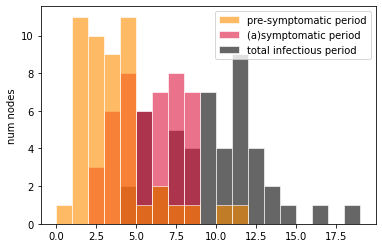

onset-to-hospitalization period:  mean = 7.58, std = 3.52, 95% CI = (2.24, 15.77)

hospitalization-to-discharge period:  mean = 15.22, std = 6.72, 95% CI = (4.18, 27.04)

onset-to-discharge period:  mean = 22.81, std = 8.03, 95% CI = (6.94, 38.61)



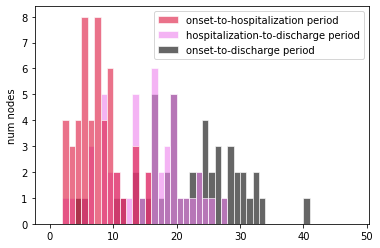

onset-to-hospitalization period:  mean = 7.58, std = 3.52, 95% CI = (2.24, 15.77)

hospitalization-to-death period:  mean = 6.61, std = 3.13, 95% CI = (2.26, 13.99)

onset-to-death period:  mean = 14.19, std = 4.74, 95% CI = (7.43, 23.83)



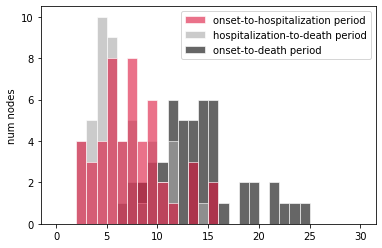

Individual R0:  mean = 2.06, std = 0.41, 95% CI = (1.44, 2.83)



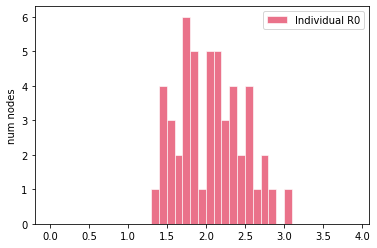

[INTERVENTIONS @ t = 0.58 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[NEW EXPOSURE @ t = 1.06 (1 exposed)]
[INTERVENTIONS @ t = 1.06 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of co

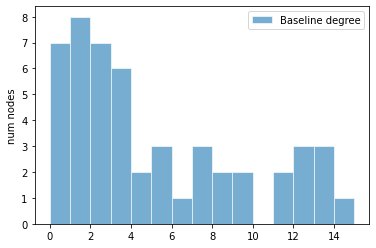

latent period:  mean = 3.74, std = 2.28, 95% CI = (0.59, 8.91)

pre-symptomatic period:  mean = 2.76, std = 1.71, 95% CI = (0.70, 7.01)

total incubation period:  mean = 6.50, std = 3.01, 95% CI = (2.23, 11.89)



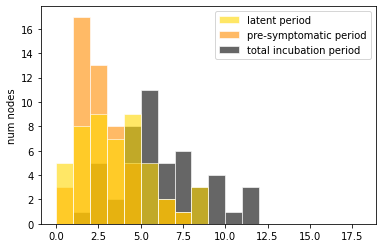

pre-symptomatic period:  mean = 3.74, std = 2.28, 95% CI = (0.59, 8.91)

(a)symptomatic period:  mean = 6.48, std = 2.57, 95% CI = (1.79, 10.57)

total infectious period:  mean = 10.21, std = 3.80, 95% CI = (3.90, 17.61)



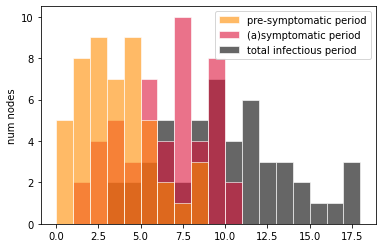

onset-to-hospitalization period:  mean = 8.87, std = 3.81, 95% CI = (3.03, 17.69)

hospitalization-to-discharge period:  mean = 12.45, std = 5.93, 95% CI = (4.20, 23.14)

onset-to-discharge period:  mean = 21.32, std = 6.81, 95% CI = (11.48, 35.15)



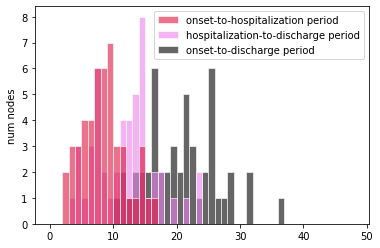

onset-to-hospitalization period:  mean = 8.87, std = 3.81, 95% CI = (3.03, 17.69)

hospitalization-to-death period:  mean = 6.24, std = 3.13, 95% CI = (1.53, 14.26)

onset-to-death period:  mean = 15.11, std = 4.89, 95% CI = (6.93, 25.12)



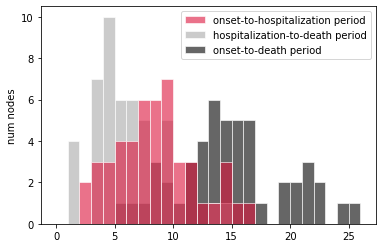

Individual R0:  mean = 2.03, std = 0.30, 95% CI = (1.46, 2.52)



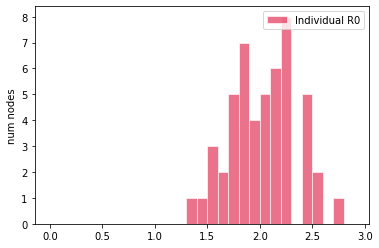

[INTERVENTIONS @ t = 0.15 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 0 positive (0.00 %) +]
	50	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.25 (5 (10.00%) infected)]
	2	tested due to symptoms  [+ 2 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	2	tested TOTAL            [+ 2 positive (100.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	2 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTER

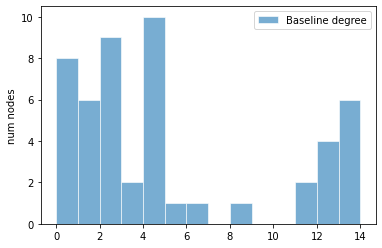

latent period:  mean = 3.20, std = 1.66, 95% CI = (0.86, 6.36)

pre-symptomatic period:  mean = 2.33, std = 1.49, 95% CI = (0.42, 4.33)

total incubation period:  mean = 5.53, std = 2.18, 95% CI = (2.27, 11.05)



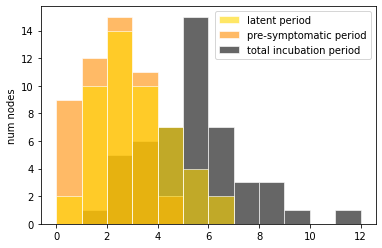

pre-symptomatic period:  mean = 3.20, std = 1.66, 95% CI = (0.86, 6.36)

(a)symptomatic period:  mean = 6.21, std = 2.38, 95% CI = (2.50, 10.03)

total infectious period:  mean = 9.41, std = 2.56, 95% CI = (5.88, 15.72)



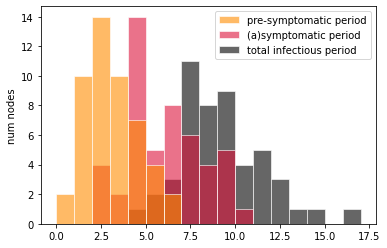

onset-to-hospitalization period:  mean = 8.72, std = 3.94, 95% CI = (3.07, 18.04)

hospitalization-to-discharge period:  mean = 13.37, std = 6.24, 95% CI = (5.96, 25.36)

onset-to-discharge period:  mean = 22.08, std = 7.19, 95% CI = (12.04, 37.23)



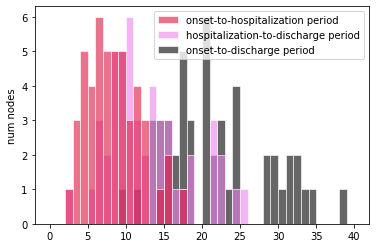

onset-to-hospitalization period:  mean = 8.72, std = 3.94, 95% CI = (3.07, 18.04)

hospitalization-to-death period:  mean = 6.55, std = 2.90, 95% CI = (1.35, 12.44)

onset-to-death period:  mean = 15.27, std = 4.58, 95% CI = (7.08, 21.34)



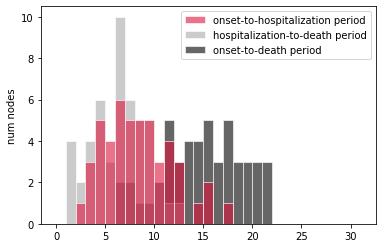

Individual R0:  mean = 2.16, std = 0.53, 95% CI = (1.21, 3.19)



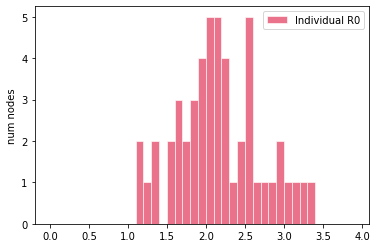

[INTERVENTIONS @ t = 0.03 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.12 (8 (16.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVENT

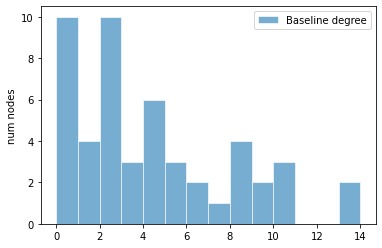

latent period:  mean = 3.39, std = 1.96, 95% CI = (0.82, 8.69)

pre-symptomatic period:  mean = 2.47, std = 1.69, 95% CI = (0.59, 6.84)

total incubation period:  mean = 5.87, std = 2.40, 95% CI = (2.25, 11.36)



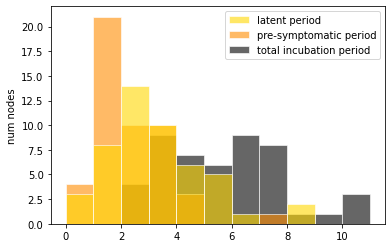

pre-symptomatic period:  mean = 3.39, std = 1.96, 95% CI = (0.82, 8.69)

(a)symptomatic period:  mean = 6.27, std = 2.25, 95% CI = (2.42, 10.01)

total infectious period:  mean = 9.66, std = 2.89, 95% CI = (5.54, 16.38)



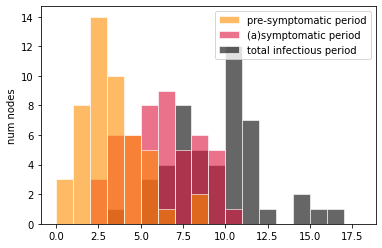

onset-to-hospitalization period:  mean = 8.35, std = 4.09, 95% CI = (2.94, 16.12)

hospitalization-to-discharge period:  mean = 14.08, std = 5.63, 95% CI = (3.70, 25.01)

onset-to-discharge period:  mean = 22.42, std = 6.43, 95% CI = (9.62, 35.16)



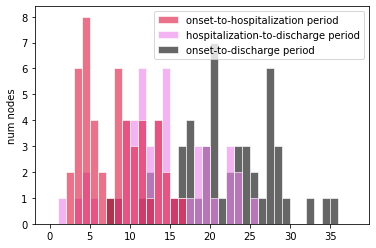

onset-to-hospitalization period:  mean = 8.35, std = 4.09, 95% CI = (2.94, 16.12)

hospitalization-to-death period:  mean = 6.88, std = 2.94, 95% CI = (2.21, 12.89)

onset-to-death period:  mean = 15.22, std = 5.06, 95% CI = (6.17, 22.70)



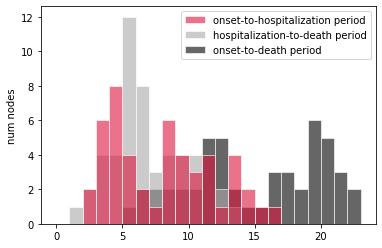

Individual R0:  mean = 1.93, std = 0.35, 95% CI = (1.30, 2.49)



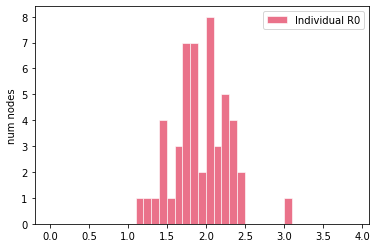

[INTERVENTIONS @ t = 0.10 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 0 positive (0.00 %) +]
	50	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.80 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENT

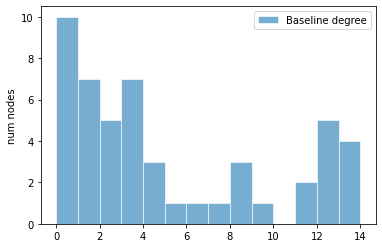

latent period:  mean = 3.56, std = 1.98, 95% CI = (0.72, 7.58)

pre-symptomatic period:  mean = 2.65, std = 1.44, 95% CI = (0.57, 5.56)

total incubation period:  mean = 6.21, std = 2.48, 95% CI = (2.66, 10.80)



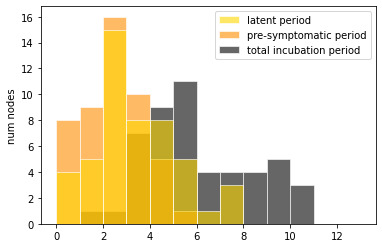

pre-symptomatic period:  mean = 3.56, std = 1.98, 95% CI = (0.72, 7.58)

(a)symptomatic period:  mean = 6.81, std = 2.82, 95% CI = (2.62, 13.45)

total infectious period:  mean = 10.36, std = 3.70, 95% CI = (5.03, 19.56)



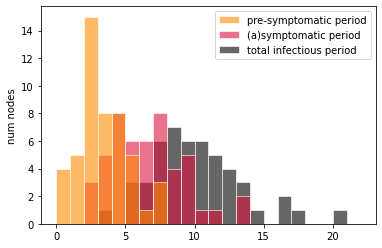

onset-to-hospitalization period:  mean = 7.40, std = 3.06, 95% CI = (2.98, 13.51)

hospitalization-to-discharge period:  mean = 14.45, std = 5.79, 95% CI = (5.60, 25.10)

onset-to-discharge period:  mean = 21.85, std = 6.13, 95% CI = (12.25, 32.58)



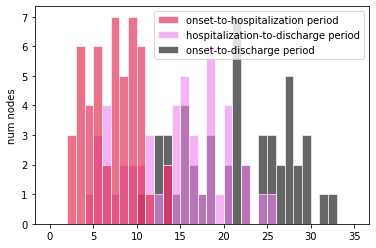

onset-to-hospitalization period:  mean = 7.40, std = 3.06, 95% CI = (2.98, 13.51)

hospitalization-to-death period:  mean = 7.39, std = 3.53, 95% CI = (2.48, 13.10)

onset-to-death period:  mean = 14.79, std = 4.20, 95% CI = (7.74, 21.98)



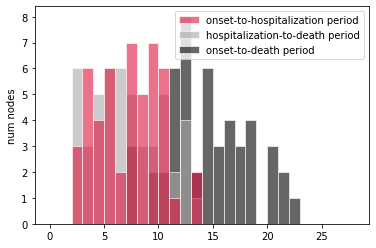

Individual R0:  mean = 1.93, std = 0.35, 95% CI = (1.29, 2.55)



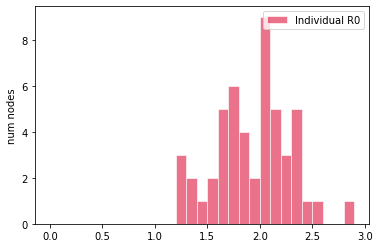

[INTERVENTIONS @ t = 0.07 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.32 (4 (8.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVENTI

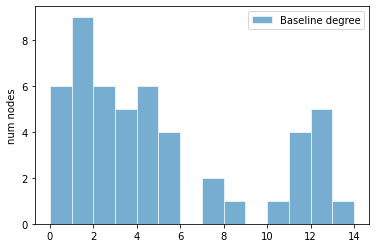

latent period:  mean = 3.65, std = 1.58, 95% CI = (1.39, 6.49)

pre-symptomatic period:  mean = 2.65, std = 1.66, 95% CI = (0.46, 6.18)

total incubation period:  mean = 6.30, std = 1.83, 95% CI = (3.49, 9.69)



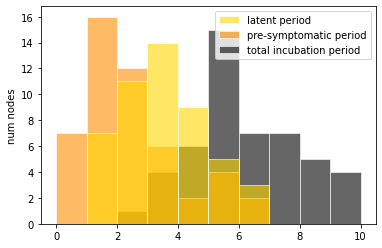

pre-symptomatic period:  mean = 3.65, std = 1.58, 95% CI = (1.39, 6.49)

(a)symptomatic period:  mean = 6.41, std = 2.52, 95% CI = (2.28, 12.52)

total infectious period:  mean = 10.06, std = 2.78, 95% CI = (5.75, 15.68)



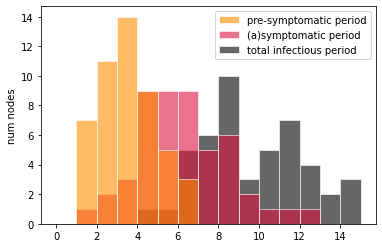

onset-to-hospitalization period:  mean = 7.94, std = 3.17, 95% CI = (3.35, 15.22)

hospitalization-to-discharge period:  mean = 15.97, std = 8.14, 95% CI = (6.95, 36.70)

onset-to-discharge period:  mean = 23.90, std = 8.37, 95% CI = (13.98, 44.34)



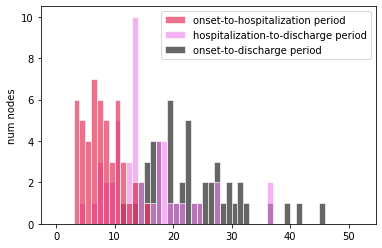

onset-to-hospitalization period:  mean = 7.94, std = 3.17, 95% CI = (3.35, 15.22)

hospitalization-to-death period:  mean = 6.68, std = 2.85, 95% CI = (2.27, 13.22)

onset-to-death period:  mean = 14.62, std = 4.62, 95% CI = (7.23, 22.60)



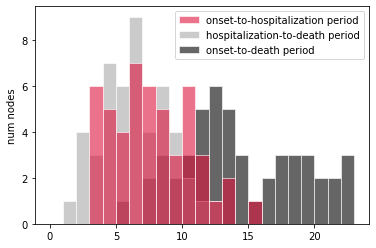

Individual R0:  mean = 2.08, std = 0.41, 95% CI = (1.39, 2.91)



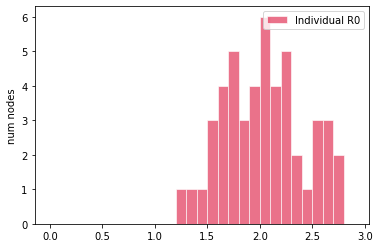

[INTERVENTIONS @ t = 0.75 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 0 positive (0.00 %) +]
	50	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.93 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENT

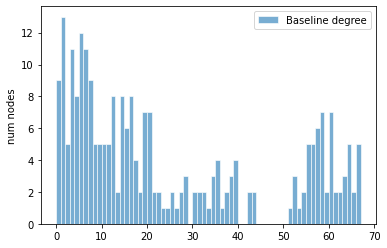

latent period:  mean = 3.53, std = 2.05, 95% CI = (0.83, 8.24)

pre-symptomatic period:  mean = 2.47, std = 1.52, 95% CI = (0.49, 6.08)

total incubation period:  mean = 5.99, std = 2.55, 95% CI = (1.97, 12.20)



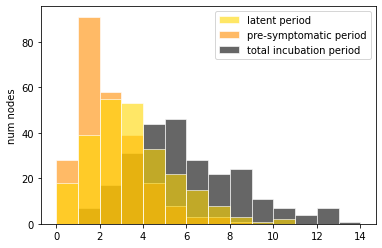

pre-symptomatic period:  mean = 3.53, std = 2.05, 95% CI = (0.83, 8.24)

(a)symptomatic period:  mean = 6.63, std = 2.46, 95% CI = (2.73, 12.45)

total infectious period:  mean = 10.16, std = 3.15, 95% CI = (4.92, 17.75)



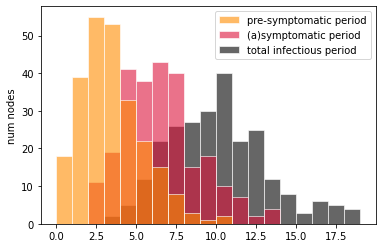

onset-to-hospitalization period:  mean = 8.08, std = 3.77, 95% CI = (2.50, 16.80)

hospitalization-to-discharge period:  mean = 14.56, std = 6.43, 95% CI = (4.97, 28.08)

onset-to-discharge period:  mean = 22.64, std = 7.14, 95% CI = (11.49, 37.32)



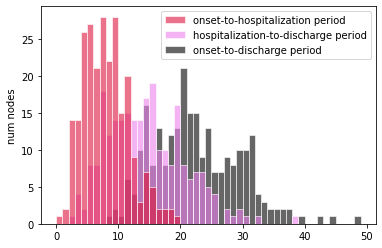

onset-to-hospitalization period:  mean = 8.08, std = 3.77, 95% CI = (2.50, 16.80)

hospitalization-to-death period:  mean = 7.36, std = 3.61, 95% CI = (2.16, 15.61)

onset-to-death period:  mean = 15.45, std = 5.32, 95% CI = (6.47, 26.76)



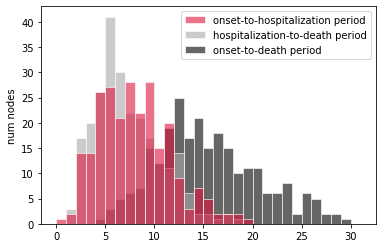

Individual R0:  mean = 2.01, std = 0.40, 95% CI = (1.29, 2.89)



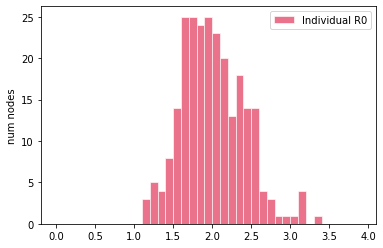

[INTERVENTIONS @ t = 0.01 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[NEW EXPOSURE @ t = 1.02 (1 exposed)]
[INTERVENTIONS @ t = 1.02 (25 (10.00%) infected)]
	1	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	248	tested randomly         [+ 11 positive (4.44 %) +]
	249	tested TOTAL            [+ 11 positive (4.42 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	11 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as group

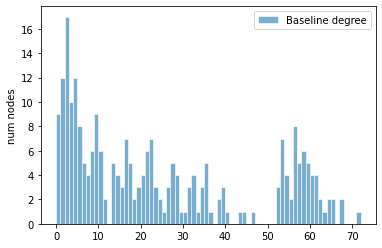

latent period:  mean = 3.48, std = 2.00, 95% CI = (0.62, 8.11)

pre-symptomatic period:  mean = 2.50, std = 1.58, 95% CI = (0.58, 6.61)

total incubation period:  mean = 5.98, std = 2.51, 95% CI = (2.22, 11.67)



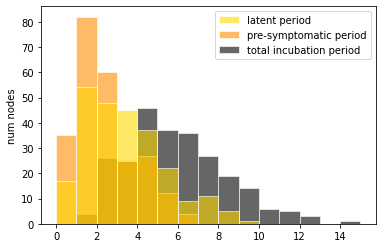

pre-symptomatic period:  mean = 3.48, std = 2.00, 95% CI = (0.62, 8.11)

(a)symptomatic period:  mean = 6.67, std = 2.64, 95% CI = (2.55, 13.08)

total infectious period:  mean = 10.15, std = 3.52, 95% CI = (4.50, 18.63)



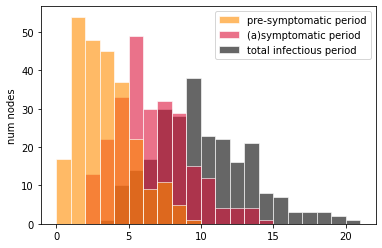

onset-to-hospitalization period:  mean = 8.14, std = 3.72, 95% CI = (2.95, 16.76)

hospitalization-to-discharge period:  mean = 13.72, std = 5.43, 95% CI = (4.95, 25.40)

onset-to-discharge period:  mean = 21.87, std = 6.62, 95% CI = (10.66, 36.12)



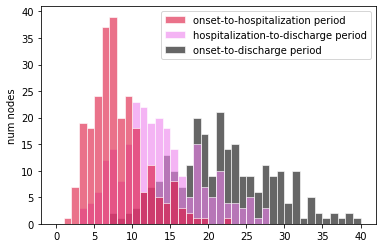

onset-to-hospitalization period:  mean = 8.14, std = 3.72, 95% CI = (2.95, 16.76)

hospitalization-to-death period:  mean = 6.53, std = 2.71, 95% CI = (2.47, 12.41)

onset-to-death period:  mean = 14.67, std = 4.95, 95% CI = (6.87, 25.41)



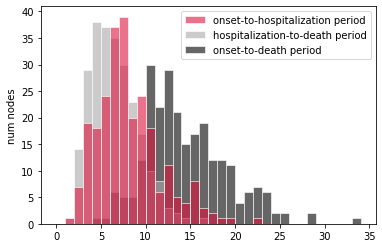

Individual R0:  mean = 1.99, std = 0.39, 95% CI = (1.34, 2.86)



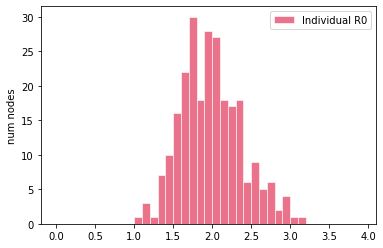

[NEW EXPOSURE @ t = 0.04 (1 exposed)]
[INTERVENTIONS @ t = 0.04 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.15 (27 (10.80%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	249	tested randomly         [+ 7 positive (2.81 %) +]
	249	tested TOTAL            [+ 7 positive (2.81 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	7 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmat

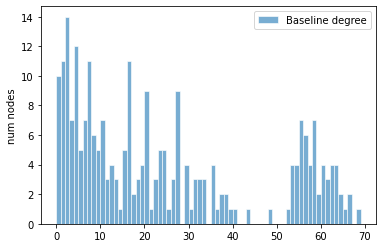

latent period:  mean = 3.23, std = 1.96, 95% CI = (0.88, 8.52)

pre-symptomatic period:  mean = 2.50, std = 1.49, 95% CI = (0.42, 6.26)

total incubation period:  mean = 5.73, std = 2.51, 95% CI = (2.31, 12.25)



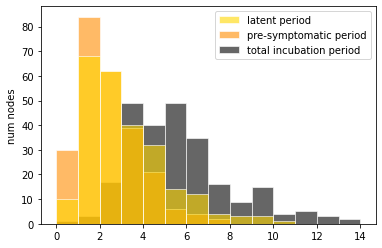

pre-symptomatic period:  mean = 3.23, std = 1.96, 95% CI = (0.88, 8.52)

(a)symptomatic period:  mean = 6.41, std = 2.49, 95% CI = (2.57, 12.21)

total infectious period:  mean = 9.64, std = 3.27, 95% CI = (4.90, 16.52)



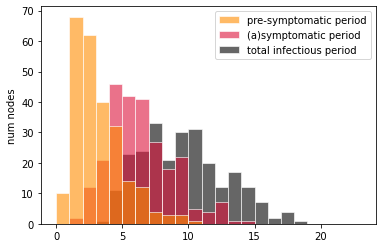

onset-to-hospitalization period:  mean = 7.93, std = 3.48, 95% CI = (2.40, 16.29)

hospitalization-to-discharge period:  mean = 15.02, std = 7.37, 95% CI = (4.37, 31.52)

onset-to-discharge period:  mean = 22.95, std = 7.99, 95% CI = (11.19, 39.97)



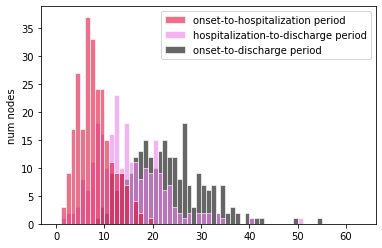

onset-to-hospitalization period:  mean = 7.93, std = 3.48, 95% CI = (2.40, 16.29)

hospitalization-to-death period:  mean = 7.24, std = 3.56, 95% CI = (2.47, 16.26)

onset-to-death period:  mean = 15.17, std = 4.74, 95% CI = (7.45, 25.85)



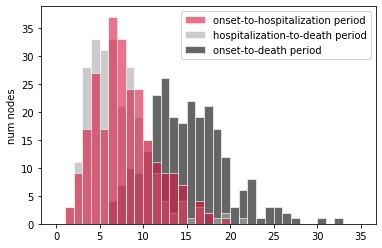

Individual R0:  mean = 2.01, std = 0.39, 95% CI = (1.29, 2.86)



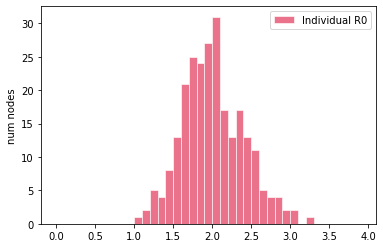

[INTERVENTIONS @ t = 0.23 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 0 positive (0.00 %) +]
	250	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.01 (26 (10.40%) infected)]
	2	tested due to symptoms  [+ 2 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	248	tested randomly         [+ 6 positive (2.42 %) +]
	250	tested TOTAL            [+ 8 positive (3.20 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	8 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation


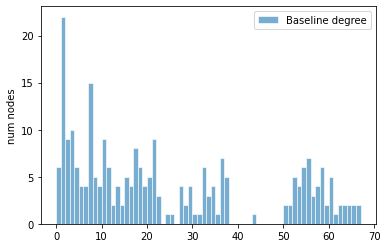

latent period:  mean = 3.40, std = 2.07, 95% CI = (0.50, 8.76)

pre-symptomatic period:  mean = 2.50, std = 1.60, 95% CI = (0.52, 6.24)

total incubation period:  mean = 5.90, std = 2.59, 95% CI = (1.87, 11.97)



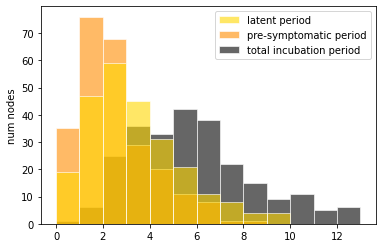

pre-symptomatic period:  mean = 3.40, std = 2.07, 95% CI = (0.50, 8.76)

(a)symptomatic period:  mean = 6.60, std = 2.77, 95% CI = (2.54, 12.83)

total infectious period:  mean = 10.00, std = 3.42, 95% CI = (4.67, 17.12)



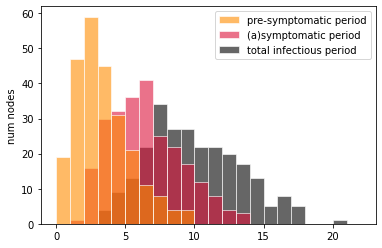

onset-to-hospitalization period:  mean = 7.99, std = 3.61, 95% CI = (1.88, 16.07)

hospitalization-to-discharge period:  mean = 13.31, std = 5.76, 95% CI = (5.14, 27.45)

onset-to-discharge period:  mean = 21.30, std = 6.80, 95% CI = (11.29, 39.32)



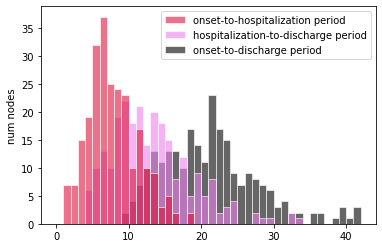

onset-to-hospitalization period:  mean = 7.99, std = 3.61, 95% CI = (1.88, 16.07)

hospitalization-to-death period:  mean = 7.03, std = 3.18, 95% CI = (2.25, 13.84)

onset-to-death period:  mean = 15.01, std = 4.78, 95% CI = (7.47, 25.21)



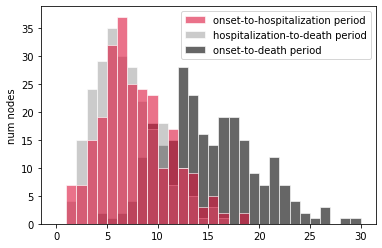

Individual R0:  mean = 1.96, std = 0.41, 95% CI = (1.28, 2.78)



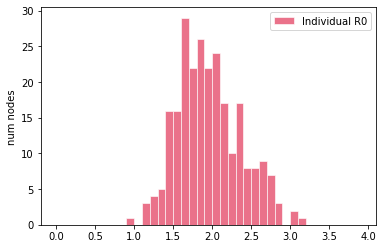

[INTERVENTIONS @ t = 0.01 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 0 positive (0.00 %) +]
	250	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.11 (28 (11.20%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 9 positive (3.60 %) +]
	250	tested TOTAL            [+ 9 positive (3.60 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	9 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[I

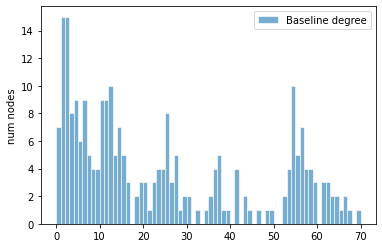

latent period:  mean = 3.55, std = 2.28, 95% CI = (0.60, 9.15)

pre-symptomatic period:  mean = 2.42, std = 1.38, 95% CI = (0.55, 5.69)

total incubation period:  mean = 5.96, std = 2.69, 95% CI = (2.01, 12.12)



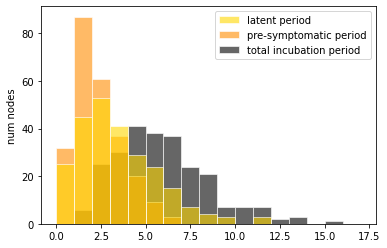

pre-symptomatic period:  mean = 3.55, std = 2.28, 95% CI = (0.60, 9.15)

(a)symptomatic period:  mean = 6.56, std = 2.48, 95% CI = (2.60, 12.11)

total infectious period:  mean = 10.10, std = 3.10, 95% CI = (4.84, 15.85)



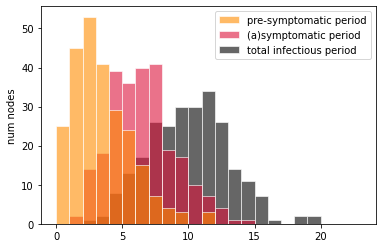

onset-to-hospitalization period:  mean = 7.84, std = 3.65, 95% CI = (2.60, 16.16)

hospitalization-to-discharge period:  mean = 13.69, std = 6.11, 95% CI = (4.20, 26.05)

onset-to-discharge period:  mean = 21.54, std = 7.21, 95% CI = (10.44, 37.06)



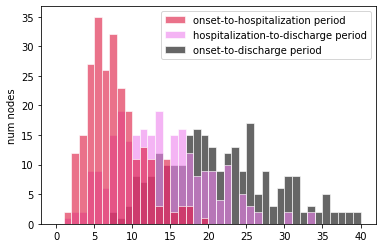

onset-to-hospitalization period:  mean = 7.84, std = 3.65, 95% CI = (2.60, 16.16)

hospitalization-to-death period:  mean = 7.24, std = 3.08, 95% CI = (2.47, 13.74)

onset-to-death period:  mean = 15.08, std = 4.79, 95% CI = (7.11, 24.58)



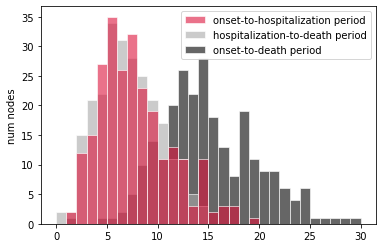

Individual R0:  mean = 2.03, std = 0.39, 95% CI = (1.32, 2.97)



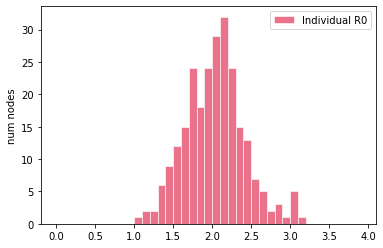

[INTERVENTIONS @ t = 0.12 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.06 (26 (10.40%) infected)]
	1	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	249	tested randomly         [+ 11 positive (4.42 %) +]
	250	tested TOTAL            [+ 11 positive (4.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	11 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation

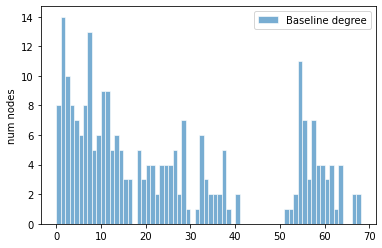

latent period:  mean = 3.34, std = 2.07, 95% CI = (0.44, 8.33)

pre-symptomatic period:  mean = 2.38, std = 1.41, 95% CI = (0.57, 5.82)

total incubation period:  mean = 5.72, std = 2.61, 95% CI = (2.09, 12.17)



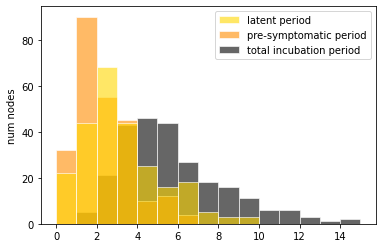

pre-symptomatic period:  mean = 3.34, std = 2.07, 95% CI = (0.44, 8.33)

(a)symptomatic period:  mean = 6.39, std = 2.55, 95% CI = (2.52, 12.51)

total infectious period:  mean = 9.73, std = 3.17, 95% CI = (4.52, 16.36)



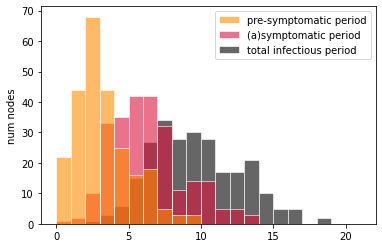

onset-to-hospitalization period:  mean = 7.97, std = 3.67, 95% CI = (2.34, 16.27)

hospitalization-to-discharge period:  mean = 13.74, std = 6.21, 95% CI = (3.63, 28.33)

onset-to-discharge period:  mean = 21.71, std = 7.04, 95% CI = (10.20, 36.95)



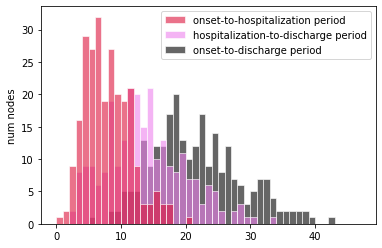

onset-to-hospitalization period:  mean = 7.97, std = 3.67, 95% CI = (2.34, 16.27)

hospitalization-to-death period:  mean = 6.86, std = 2.99, 95% CI = (2.29, 13.74)

onset-to-death period:  mean = 14.83, std = 4.61, 95% CI = (7.17, 23.99)



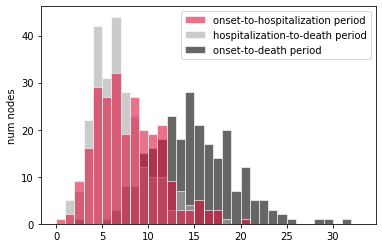

Individual R0:  mean = 2.03, std = 0.39, 95% CI = (1.28, 2.76)



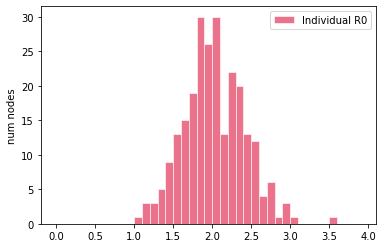

[INTERVENTIONS @ t = 0.10 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.18 (26 (10.40%) infected)]
	1	tested due to symptoms  [+ 1 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	249	tested randomly         [+ 9 positive (3.61 %) +]
	250	tested TOTAL            [+ 10 positive (4.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	10 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolatio

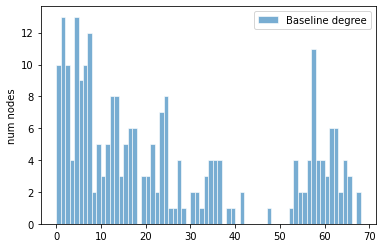

latent period:  mean = 3.54, std = 2.34, 95% CI = (0.76, 9.10)

pre-symptomatic period:  mean = 2.43, std = 1.41, 95% CI = (0.51, 5.68)

total incubation period:  mean = 5.97, std = 2.78, 95% CI = (2.19, 12.24)



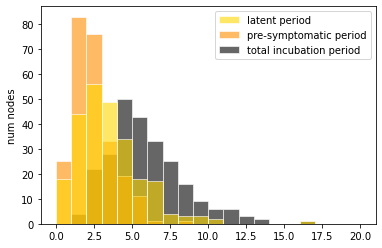

pre-symptomatic period:  mean = 3.54, std = 2.34, 95% CI = (0.76, 9.10)

(a)symptomatic period:  mean = 6.58, std = 2.37, 95% CI = (2.81, 11.61)

total infectious period:  mean = 10.12, std = 3.29, 95% CI = (4.85, 16.96)



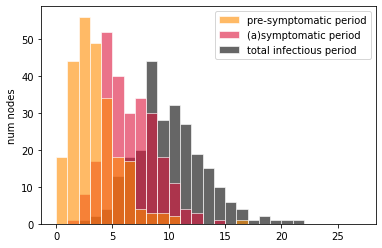

onset-to-hospitalization period:  mean = 7.86, std = 3.19, 95% CI = (2.98, 15.41)

hospitalization-to-discharge period:  mean = 13.99, std = 6.15, 95% CI = (4.77, 28.81)

onset-to-discharge period:  mean = 21.85, std = 7.06, 95% CI = (12.39, 38.47)



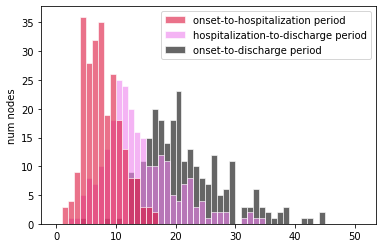

onset-to-hospitalization period:  mean = 7.86, std = 3.19, 95% CI = (2.98, 15.41)

hospitalization-to-death period:  mean = 6.85, std = 3.11, 95% CI = (2.36, 13.72)

onset-to-death period:  mean = 14.72, std = 4.51, 95% CI = (8.01, 24.23)



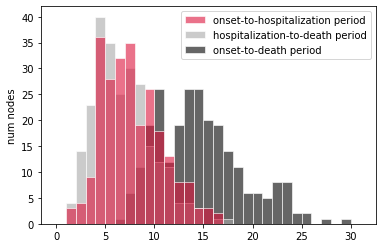

Individual R0:  mean = 2.02, std = 0.39, 95% CI = (1.38, 2.85)



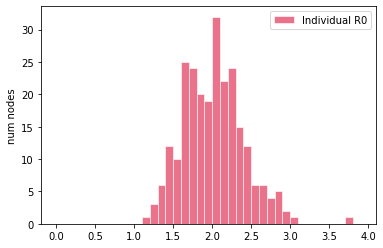

[NEW EXPOSURE @ t = 0.00 (1 exposed)]
[INTERVENTIONS @ t = 0.00 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.12 (26 (10.40%) infected)]
	1	tested due to symptoms  [+ 1 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	249	tested randomly         [+ 7 positive (2.81 %) +]
	250	tested TOTAL            [+ 8 positive (3.20 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	8 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupm

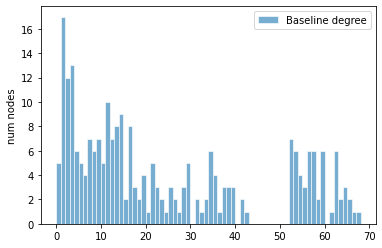

latent period:  mean = 3.57, std = 2.12, 95% CI = (0.55, 8.26)

pre-symptomatic period:  mean = 2.37, std = 1.45, 95% CI = (0.41, 5.91)

total incubation period:  mean = 5.94, std = 2.50, 95% CI = (2.15, 11.68)



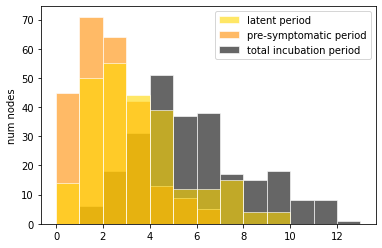

pre-symptomatic period:  mean = 3.57, std = 2.12, 95% CI = (0.55, 8.26)

(a)symptomatic period:  mean = 6.60, std = 2.64, 95% CI = (2.68, 12.56)

total infectious period:  mean = 10.17, std = 3.61, 95% CI = (4.28, 17.69)



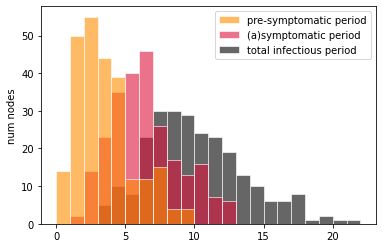

onset-to-hospitalization period:  mean = 8.03, std = 3.44, 95% CI = (2.93, 15.06)

hospitalization-to-discharge period:  mean = 14.20, std = 6.22, 95% CI = (4.35, 27.89)

onset-to-discharge period:  mean = 22.23, std = 7.08, 95% CI = (9.51, 36.95)



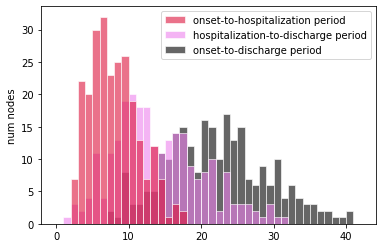

onset-to-hospitalization period:  mean = 8.03, std = 3.44, 95% CI = (2.93, 15.06)

hospitalization-to-death period:  mean = 7.17, std = 3.08, 95% CI = (2.32, 13.75)

onset-to-death period:  mean = 15.20, std = 4.61, 95% CI = (7.19, 24.53)



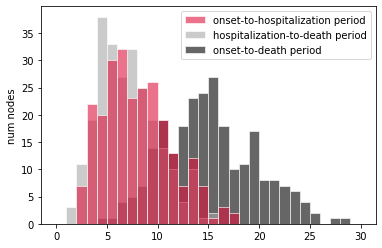

Individual R0:  mean = 1.96, std = 0.40, 95% CI = (1.28, 2.84)



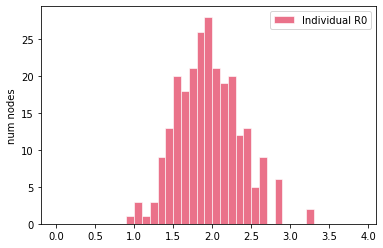

[INTERVENTIONS @ t = 0.09 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.01 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	248	tested randomly         [+ 6 positive (2.42 %) +]
	248	tested TOTAL            [+ 6 positive (2.42 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	6 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[I

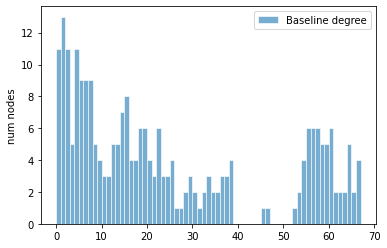

latent period:  mean = 3.60, std = 2.18, 95% CI = (0.62, 8.36)

pre-symptomatic period:  mean = 2.56, std = 1.55, 95% CI = (0.48, 5.94)

total incubation period:  mean = 6.16, std = 2.61, 95% CI = (2.29, 11.45)



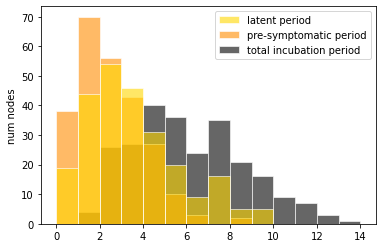

pre-symptomatic period:  mean = 3.60, std = 2.18, 95% CI = (0.62, 8.36)

(a)symptomatic period:  mean = 6.19, std = 2.38, 95% CI = (2.44, 11.07)

total infectious period:  mean = 9.79, std = 3.11, 95% CI = (4.39, 16.17)



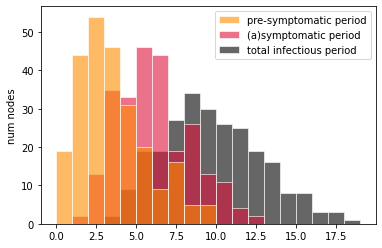

onset-to-hospitalization period:  mean = 7.94, std = 3.48, 95% CI = (2.93, 15.34)

hospitalization-to-discharge period:  mean = 13.50, std = 6.32, 95% CI = (3.77, 26.82)

onset-to-discharge period:  mean = 21.45, std = 7.34, 95% CI = (10.24, 38.87)



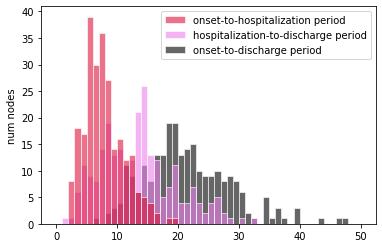

onset-to-hospitalization period:  mean = 7.94, std = 3.48, 95% CI = (2.93, 15.34)

hospitalization-to-death period:  mean = 6.93, std = 3.03, 95% CI = (2.48, 13.87)

onset-to-death period:  mean = 14.87, std = 4.66, 95% CI = (7.69, 24.12)



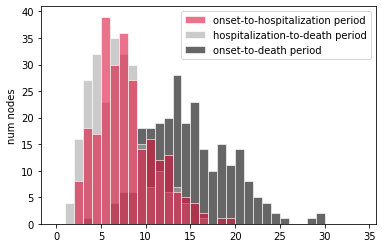

Individual R0:  mean = 1.98, std = 0.42, 95% CI = (1.28, 2.77)



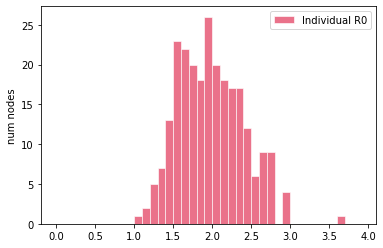

[NEW EXPOSURE @ t = 0.01 (1 exposed)]
[INTERVENTIONS @ t = 0.01 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.01 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	249	tested randomly         [+ 10 positive (4.02 %) +]
	249	tested TOTAL            [+ 10 positive (4.02 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	10 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as group

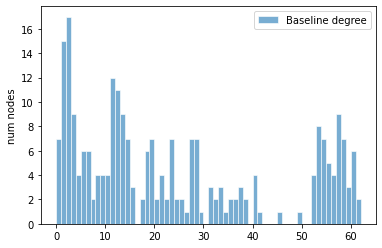

latent period:  mean = 3.50, std = 2.24, 95% CI = (0.65, 9.04)

pre-symptomatic period:  mean = 2.66, std = 1.61, 95% CI = (0.57, 6.36)

total incubation period:  mean = 6.16, std = 2.87, 95% CI = (1.93, 12.87)



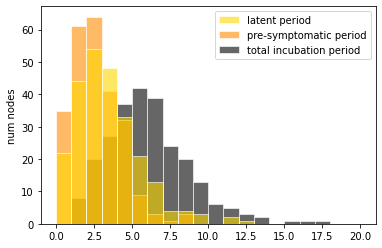

pre-symptomatic period:  mean = 3.50, std = 2.24, 95% CI = (0.65, 9.04)

(a)symptomatic period:  mean = 6.36, std = 2.60, 95% CI = (2.43, 12.86)

total infectious period:  mean = 9.86, std = 3.33, 95% CI = (3.60, 16.93)



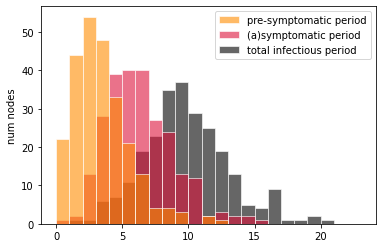

onset-to-hospitalization period:  mean = 7.89, std = 3.57, 95% CI = (2.23, 14.73)

hospitalization-to-discharge period:  mean = 13.89, std = 6.25, 95% CI = (4.21, 27.05)

onset-to-discharge period:  mean = 21.78, std = 7.33, 95% CI = (9.09, 37.57)



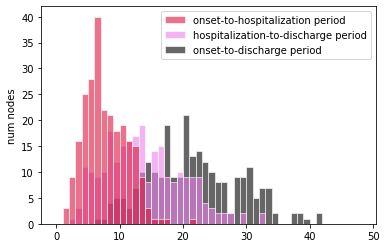

onset-to-hospitalization period:  mean = 7.89, std = 3.57, 95% CI = (2.23, 14.73)

hospitalization-to-death period:  mean = 7.18, std = 3.28, 95% CI = (2.31, 14.74)

onset-to-death period:  mean = 15.06, std = 4.73, 95% CI = (7.32, 24.94)



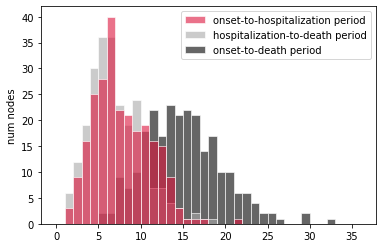

Individual R0:  mean = 1.99, std = 0.39, 95% CI = (1.30, 2.81)



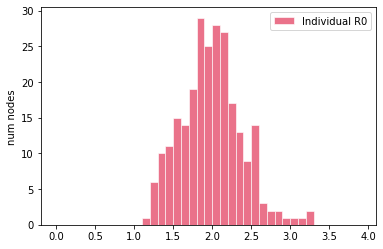

[INTERVENTIONS @ t = 0.09 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.05 (24 (9.60%) infected)]
	1	tested due to symptoms  [+ 1 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	249	tested randomly         [+ 9 positive (3.61 %) +]
	250	tested TOTAL            [+ 10 positive (4.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	10 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation

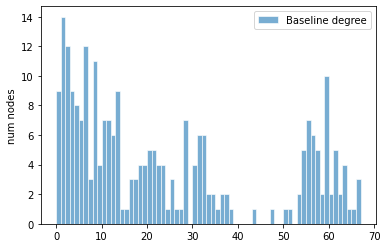

latent period:  mean = 3.45, std = 2.00, 95% CI = (0.71, 8.70)

pre-symptomatic period:  mean = 2.49, std = 1.57, 95% CI = (0.39, 6.47)

total incubation period:  mean = 5.95, std = 2.50, 95% CI = (1.93, 11.42)



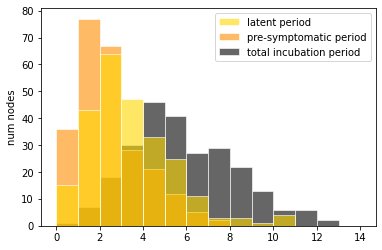

pre-symptomatic period:  mean = 3.45, std = 2.00, 95% CI = (0.71, 8.70)

(a)symptomatic period:  mean = 6.32, std = 2.32, 95% CI = (2.69, 11.53)

total infectious period:  mean = 9.77, std = 3.16, 95% CI = (4.67, 16.88)



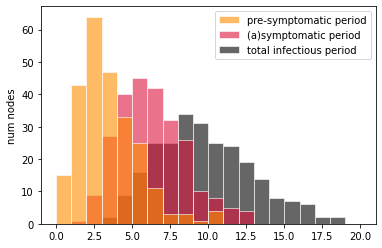

onset-to-hospitalization period:  mean = 8.10, std = 3.52, 95% CI = (2.16, 15.96)

hospitalization-to-discharge period:  mean = 13.71, std = 6.68, 95% CI = (4.68, 29.33)

onset-to-discharge period:  mean = 21.81, std = 7.50, 95% CI = (10.45, 37.50)



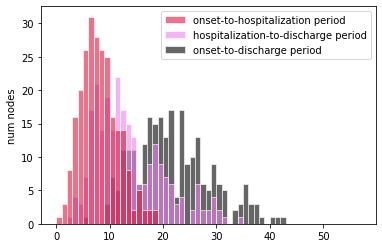

onset-to-hospitalization period:  mean = 8.10, std = 3.52, 95% CI = (2.16, 15.96)

hospitalization-to-death period:  mean = 7.13, std = 3.23, 95% CI = (2.33, 15.18)

onset-to-death period:  mean = 15.23, std = 4.80, 95% CI = (6.45, 26.06)



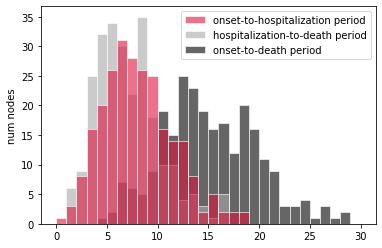

Individual R0:  mean = 2.00, std = 0.39, 95% CI = (1.32, 2.85)



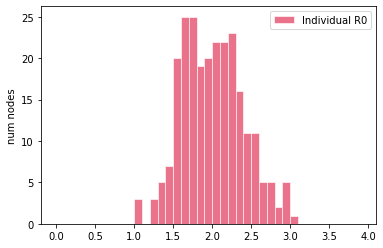

[INTERVENTIONS @ t = 0.05 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 0 positive (0.00 %) +]
	250	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.05 (28 (11.20%) infected)]
	1	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	1	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[NEW E

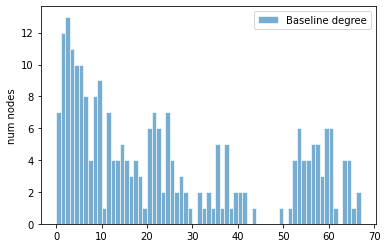

latent period:  mean = 3.58, std = 1.95, 95% CI = (0.85, 7.98)

pre-symptomatic period:  mean = 2.66, std = 1.64, 95% CI = (0.45, 6.62)

total incubation period:  mean = 6.23, std = 2.43, 95% CI = (2.51, 10.74)



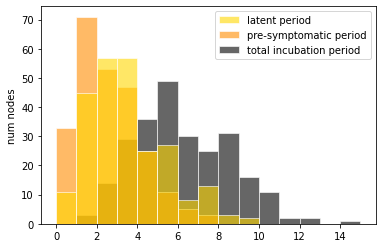

pre-symptomatic period:  mean = 3.58, std = 1.95, 95% CI = (0.85, 7.98)

(a)symptomatic period:  mean = 6.51, std = 2.54, 95% CI = (2.94, 12.68)

total infectious period:  mean = 10.09, std = 3.33, 95% CI = (5.07, 17.18)



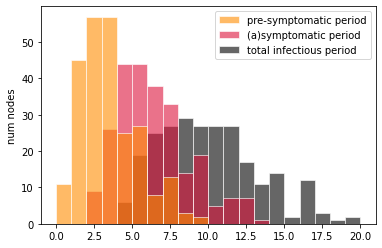

onset-to-hospitalization period:  mean = 7.81, std = 3.30, 95% CI = (2.25, 15.36)

hospitalization-to-discharge period:  mean = 13.92, std = 6.29, 95% CI = (4.67, 28.03)

onset-to-discharge period:  mean = 21.73, std = 6.88, 95% CI = (10.44, 37.04)



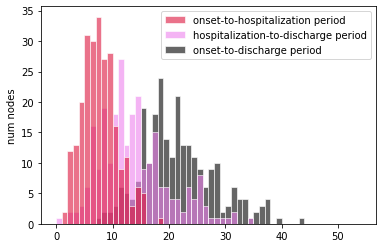

onset-to-hospitalization period:  mean = 7.81, std = 3.30, 95% CI = (2.25, 15.36)

hospitalization-to-death period:  mean = 7.11, std = 3.41, 95% CI = (1.82, 15.24)

onset-to-death period:  mean = 14.92, std = 4.65, 95% CI = (6.86, 24.85)



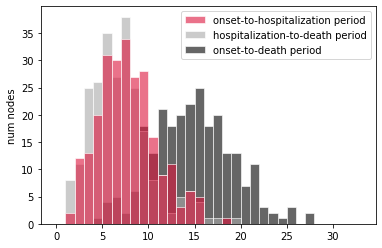

Individual R0:  mean = 2.01, std = 0.37, 95% CI = (1.39, 2.77)



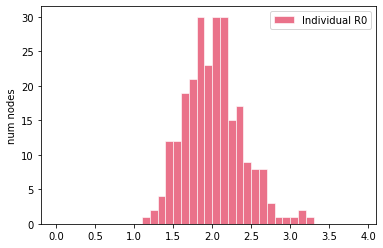

[INTERVENTIONS @ t = 0.03 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.15 (27 (10.80%) infected)]
	1	tested due to symptoms  [+ 1 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	1	tested TOTAL            [+ 1 positive (100.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[I

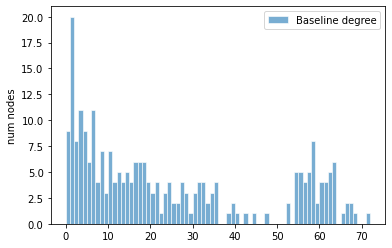

latent period:  mean = 3.64, std = 2.41, 95% CI = (0.76, 9.78)

pre-symptomatic period:  mean = 2.56, std = 1.55, 95% CI = (0.46, 6.87)

total incubation period:  mean = 6.20, std = 3.04, 95% CI = (1.60, 14.27)



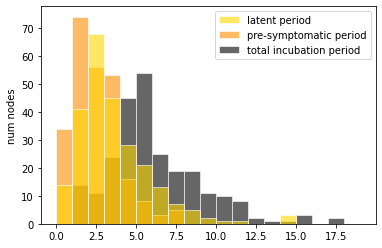

pre-symptomatic period:  mean = 3.64, std = 2.41, 95% CI = (0.76, 9.78)

(a)symptomatic period:  mean = 6.29, std = 2.75, 95% CI = (2.38, 12.28)

total infectious period:  mean = 9.94, std = 3.62, 95% CI = (4.78, 17.65)



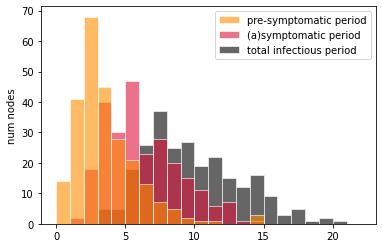

onset-to-hospitalization period:  mean = 7.97, std = 3.41, 95% CI = (2.69, 14.94)

hospitalization-to-discharge period:  mean = 14.51, std = 6.83, 95% CI = (4.05, 30.70)

onset-to-discharge period:  mean = 22.48, std = 7.74, 95% CI = (10.21, 40.33)



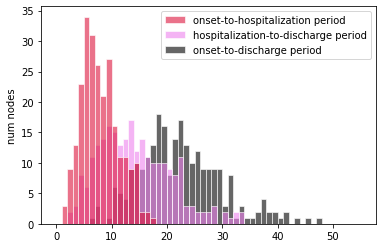

onset-to-hospitalization period:  mean = 7.97, std = 3.41, 95% CI = (2.69, 14.94)

hospitalization-to-death period:  mean = 6.66, std = 2.92, 95% CI = (2.34, 13.17)

onset-to-death period:  mean = 14.63, std = 4.44, 95% CI = (7.16, 24.35)



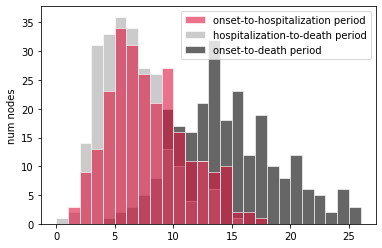

Individual R0:  mean = 2.04, std = 0.41, 95% CI = (1.29, 2.92)



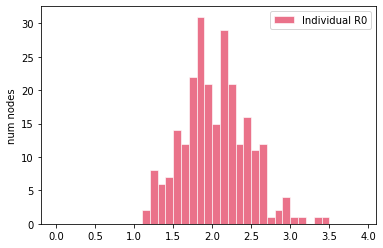

[INTERVENTIONS @ t = 0.08 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.01 (27 (10.80%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[NEW E

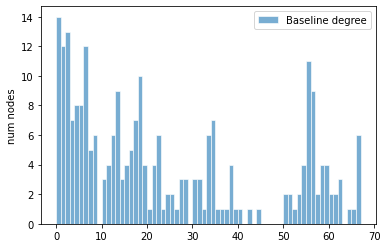

latent period:  mean = 3.47, std = 2.09, 95% CI = (0.81, 8.37)

pre-symptomatic period:  mean = 2.53, std = 1.53, 95% CI = (0.40, 6.15)

total incubation period:  mean = 6.00, std = 2.60, 95% CI = (2.32, 12.14)



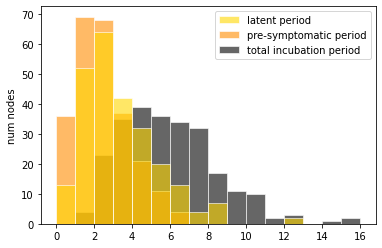

pre-symptomatic period:  mean = 3.47, std = 2.09, 95% CI = (0.81, 8.37)

(a)symptomatic period:  mean = 6.20, std = 2.29, 95% CI = (2.26, 10.58)

total infectious period:  mean = 9.67, std = 3.07, 95% CI = (4.69, 16.17)



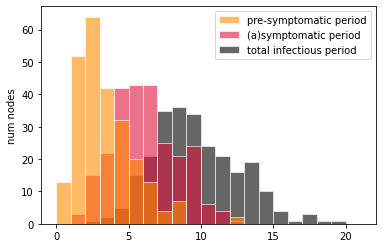

onset-to-hospitalization period:  mean = 7.79, std = 3.44, 95% CI = (2.93, 14.81)

hospitalization-to-discharge period:  mean = 14.12, std = 6.37, 95% CI = (4.49, 29.97)

onset-to-discharge period:  mean = 21.90, std = 7.14, 95% CI = (10.19, 39.53)



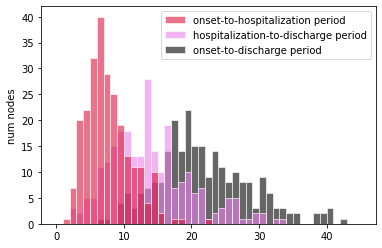

onset-to-hospitalization period:  mean = 7.79, std = 3.44, 95% CI = (2.93, 14.81)

hospitalization-to-death period:  mean = 6.50, std = 2.89, 95% CI = (1.93, 13.50)

onset-to-death period:  mean = 14.29, std = 4.54, 95% CI = (6.99, 23.96)



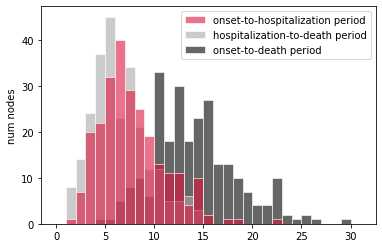

Individual R0:  mean = 2.01, std = 0.38, 95% CI = (1.36, 2.75)



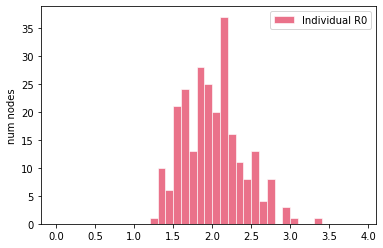

[INTERVENTIONS @ t = 0.02 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.12 (30 (12.00%) infected)]
	1	tested due to symptoms  [+ 1 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	1	tested TOTAL            [+ 1 positive (100.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[N

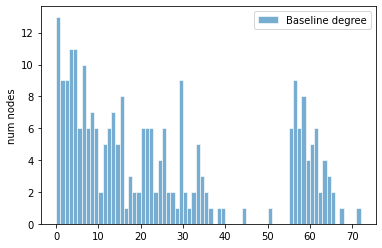

latent period:  mean = 3.36, std = 1.95, 95% CI = (0.66, 8.32)

pre-symptomatic period:  mean = 2.32, std = 1.40, 95% CI = (0.50, 5.90)

total incubation period:  mean = 5.68, std = 2.37, 95% CI = (1.85, 11.03)



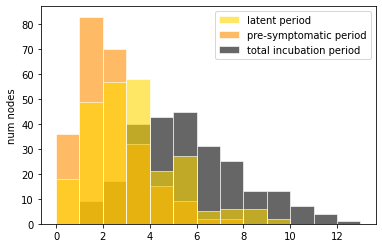

pre-symptomatic period:  mean = 3.36, std = 1.95, 95% CI = (0.66, 8.32)

(a)symptomatic period:  mean = 6.41, std = 3.04, 95% CI = (2.12, 13.13)

total infectious period:  mean = 9.77, std = 3.76, 95% CI = (4.70, 18.95)



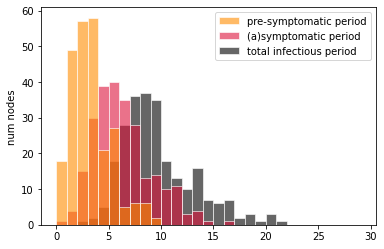

onset-to-hospitalization period:  mean = 8.27, std = 3.93, 95% CI = (2.77, 18.21)

hospitalization-to-discharge period:  mean = 12.66, std = 5.62, 95% CI = (4.69, 26.19)

onset-to-discharge period:  mean = 20.93, std = 6.28, 95% CI = (10.41, 34.18)



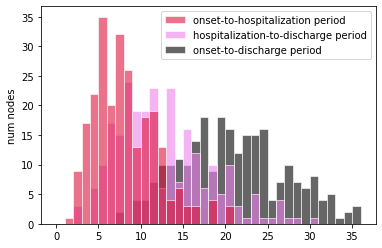

onset-to-hospitalization period:  mean = 8.27, std = 3.93, 95% CI = (2.77, 18.21)

hospitalization-to-death period:  mean = 6.80, std = 3.02, 95% CI = (2.27, 13.66)

onset-to-death period:  mean = 15.08, std = 4.99, 95% CI = (7.11, 26.10)



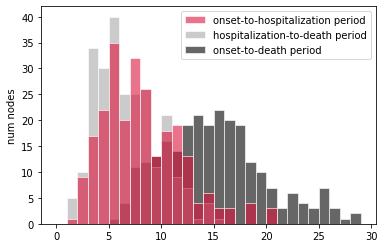

Individual R0:  mean = 2.03, std = 0.41, 95% CI = (1.40, 2.94)



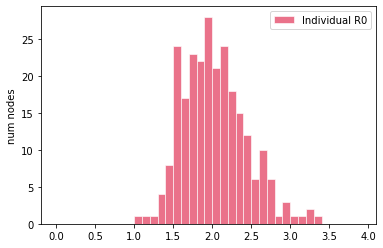

[INTERVENTIONS @ t = 0.04 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 0 positive (0.00 %) +]
	250	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.02 (26 (10.40%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTER

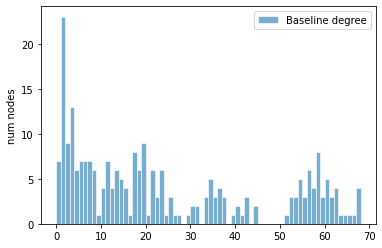

latent period:  mean = 3.46, std = 2.07, 95% CI = (0.72, 8.93)

pre-symptomatic period:  mean = 2.47, std = 1.42, 95% CI = (0.50, 5.67)

total incubation period:  mean = 5.93, std = 2.54, 95% CI = (1.77, 12.58)



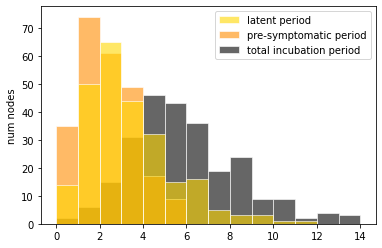

pre-symptomatic period:  mean = 3.46, std = 2.07, 95% CI = (0.72, 8.93)

(a)symptomatic period:  mean = 6.26, std = 2.63, 95% CI = (2.53, 11.92)

total infectious period:  mean = 9.72, std = 3.55, 95% CI = (4.67, 17.61)



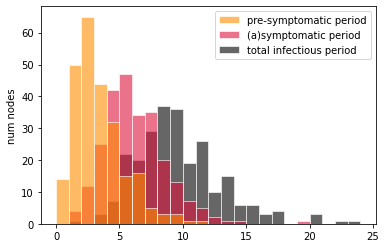

onset-to-hospitalization period:  mean = 7.88, std = 3.48, 95% CI = (2.79, 16.42)

hospitalization-to-discharge period:  mean = 13.11, std = 5.89, 95% CI = (4.86, 27.71)

onset-to-discharge period:  mean = 20.99, std = 6.96, 95% CI = (10.43, 36.20)



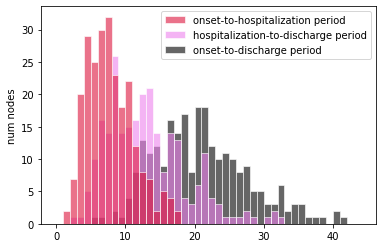

onset-to-hospitalization period:  mean = 7.88, std = 3.48, 95% CI = (2.79, 16.42)

hospitalization-to-death period:  mean = 6.95, std = 3.00, 95% CI = (2.33, 12.56)

onset-to-death period:  mean = 14.83, std = 4.66, 95% CI = (7.40, 24.54)



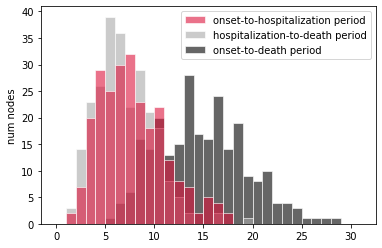

Individual R0:  mean = 2.00, std = 0.38, 95% CI = (1.33, 2.76)



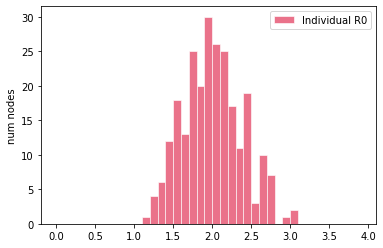

[INTERVENTIONS @ t = 0.17 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.03 (27 (10.80%) infected)]
	1	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	1	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[NEW E

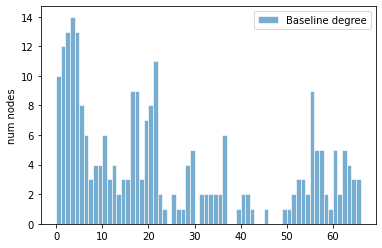

latent period:  mean = 3.54, std = 1.92, 95% CI = (0.77, 7.51)

pre-symptomatic period:  mean = 2.58, std = 1.56, 95% CI = (0.39, 6.22)

total incubation period:  mean = 6.12, std = 2.62, 95% CI = (2.14, 12.12)



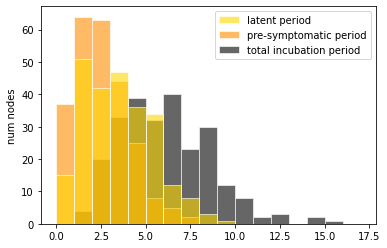

pre-symptomatic period:  mean = 3.54, std = 1.92, 95% CI = (0.77, 7.51)

(a)symptomatic period:  mean = 6.29, std = 2.78, 95% CI = (2.04, 12.96)

total infectious period:  mean = 9.83, std = 3.31, 95% CI = (4.43, 18.17)



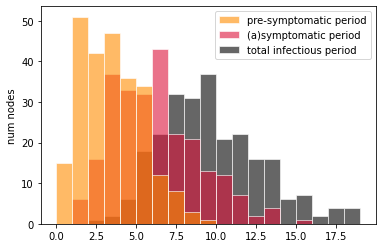

onset-to-hospitalization period:  mean = 7.74, std = 3.33, 95% CI = (2.65, 15.33)

hospitalization-to-discharge period:  mean = 13.70, std = 6.01, 95% CI = (4.56, 27.79)

onset-to-discharge period:  mean = 21.44, std = 6.98, 95% CI = (10.64, 37.64)



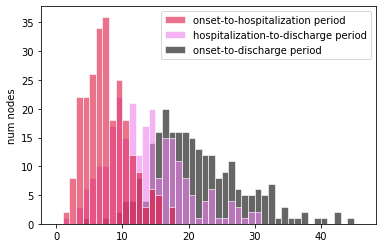

onset-to-hospitalization period:  mean = 7.74, std = 3.33, 95% CI = (2.65, 15.33)

hospitalization-to-death period:  mean = 7.05, std = 2.92, 95% CI = (2.84, 13.61)

onset-to-death period:  mean = 14.79, std = 4.35, 95% CI = (7.95, 24.66)



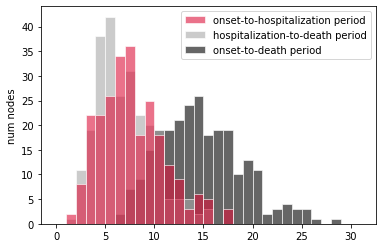

Individual R0:  mean = 2.06, std = 0.41, 95% CI = (1.37, 2.94)



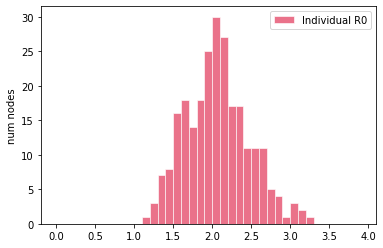

[INTERVENTIONS @ t = 0.00 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[NEW EXPOSURE @ t = 1.08 (1 exposed)]
[INTERVENTIONS @ t = 1.08 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates o

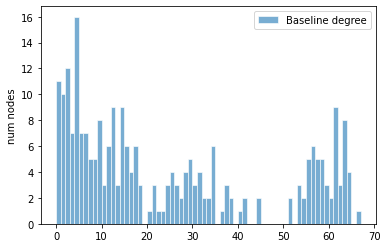

latent period:  mean = 3.52, std = 2.16, 95% CI = (0.58, 8.46)

pre-symptomatic period:  mean = 2.54, std = 1.56, 95% CI = (0.46, 6.53)

total incubation period:  mean = 6.06, std = 2.81, 95% CI = (2.16, 13.05)



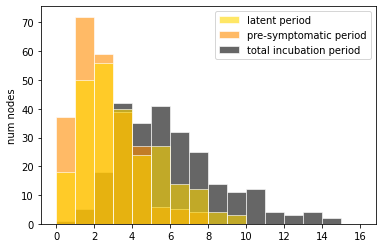

pre-symptomatic period:  mean = 3.52, std = 2.16, 95% CI = (0.58, 8.46)

(a)symptomatic period:  mean = 6.57, std = 2.53, 95% CI = (2.59, 12.69)

total infectious period:  mean = 10.08, std = 3.43, 95% CI = (4.52, 17.63)



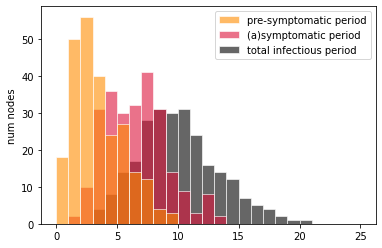

onset-to-hospitalization period:  mean = 8.19, std = 3.63, 95% CI = (2.76, 16.81)

hospitalization-to-discharge period:  mean = 14.02, std = 6.55, 95% CI = (4.07, 28.61)

onset-to-discharge period:  mean = 22.21, std = 7.19, 95% CI = (11.04, 37.18)



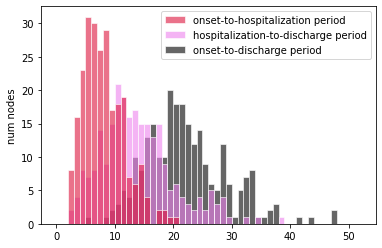

onset-to-hospitalization period:  mean = 8.19, std = 3.63, 95% CI = (2.76, 16.81)

hospitalization-to-death period:  mean = 6.80, std = 3.38, 95% CI = (2.16, 14.73)

onset-to-death period:  mean = 14.99, std = 4.92, 95% CI = (7.69, 26.86)



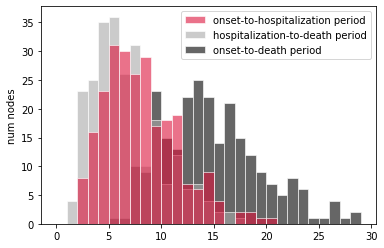

Individual R0:  mean = 1.98, std = 0.42, 95% CI = (1.23, 2.77)



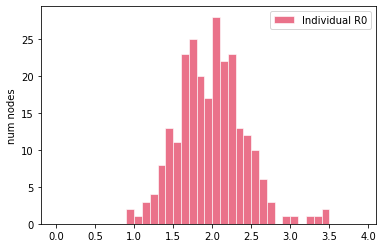

[INTERVENTIONS @ t = 0.04 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 0 positive (0.00 %) +]
	250	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.11 (26 (10.40%) infected)]
	2	tested due to symptoms  [+ 2 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	2	tested TOTAL            [+ 2 positive (100.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	2 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[I

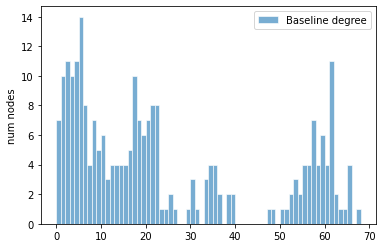

latent period:  mean = 3.64, std = 2.11, 95% CI = (0.48, 8.09)

pre-symptomatic period:  mean = 2.56, std = 1.64, 95% CI = (0.48, 6.57)

total incubation period:  mean = 6.20, std = 2.55, 95% CI = (2.42, 12.06)



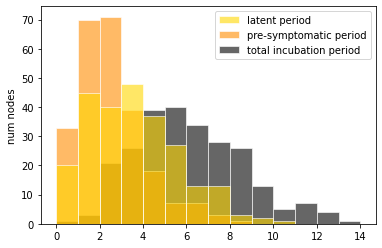

pre-symptomatic period:  mean = 3.64, std = 2.11, 95% CI = (0.48, 8.09)

(a)symptomatic period:  mean = 6.50, std = 2.66, 95% CI = (2.34, 13.09)

total infectious period:  mean = 10.14, std = 3.49, 95% CI = (4.60, 18.04)



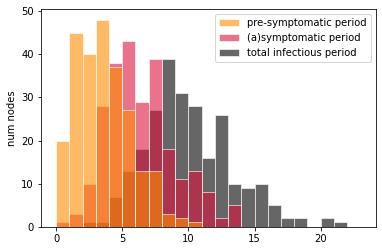

onset-to-hospitalization period:  mean = 7.91, std = 3.53, 95% CI = (2.76, 16.22)

hospitalization-to-discharge period:  mean = 13.52, std = 6.33, 95% CI = (3.65, 26.78)

onset-to-discharge period:  mean = 21.43, std = 7.14, 95% CI = (10.62, 36.92)



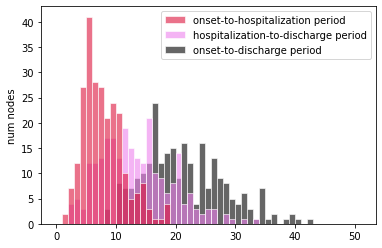

onset-to-hospitalization period:  mean = 7.91, std = 3.53, 95% CI = (2.76, 16.22)

hospitalization-to-death period:  mean = 6.95, std = 3.08, 95% CI = (2.57, 15.28)

onset-to-death period:  mean = 14.87, std = 4.69, 95% CI = (7.72, 26.64)



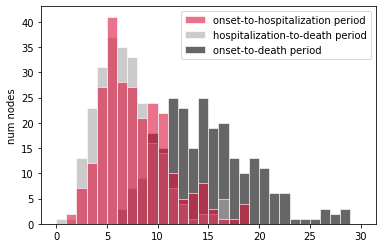

Individual R0:  mean = 2.01, std = 0.37, 95% CI = (1.32, 2.73)



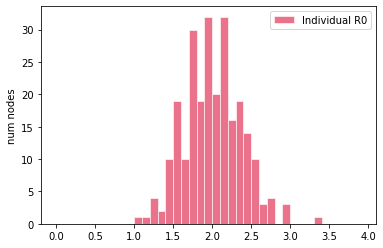

[NEW EXPOSURE @ t = 0.06 (2 exposed)]
[INTERVENTIONS @ t = 0.06 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.03 (29 (11.60%) infected)]
	1	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	1	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates o

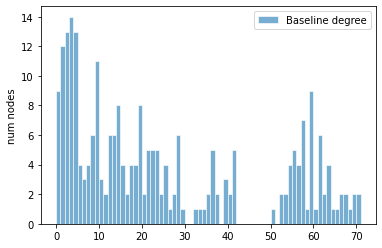

latent period:  mean = 3.43, std = 2.07, 95% CI = (0.82, 8.11)

pre-symptomatic period:  mean = 2.37, std = 1.40, 95% CI = (0.37, 5.92)

total incubation period:  mean = 5.80, std = 2.45, 95% CI = (2.13, 11.30)



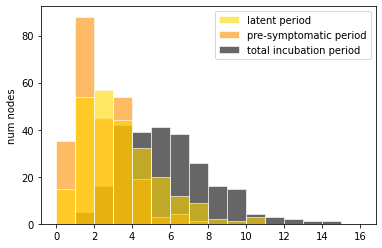

pre-symptomatic period:  mean = 3.43, std = 2.07, 95% CI = (0.82, 8.11)

(a)symptomatic period:  mean = 6.28, std = 2.52, 95% CI = (1.92, 11.77)

total infectious period:  mean = 9.71, std = 3.24, 95% CI = (4.50, 17.15)



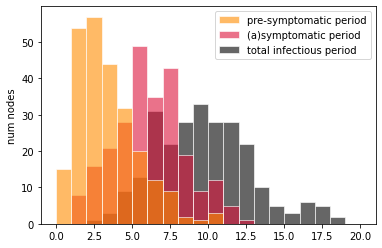

onset-to-hospitalization period:  mean = 7.68, std = 3.59, 95% CI = (2.64, 16.48)

hospitalization-to-discharge period:  mean = 14.23, std = 6.34, 95% CI = (5.30, 28.27)

onset-to-discharge period:  mean = 21.91, std = 7.09, 95% CI = (10.64, 36.30)



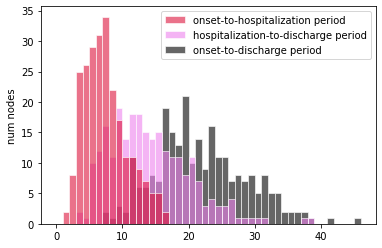

onset-to-hospitalization period:  mean = 7.68, std = 3.59, 95% CI = (2.64, 16.48)

hospitalization-to-death period:  mean = 7.19, std = 3.10, 95% CI = (2.53, 14.41)

onset-to-death period:  mean = 14.87, std = 4.89, 95% CI = (7.13, 24.91)



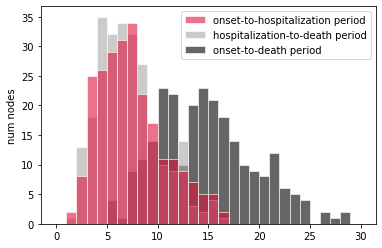

Individual R0:  mean = 1.97, std = 0.37, 95% CI = (1.28, 2.70)



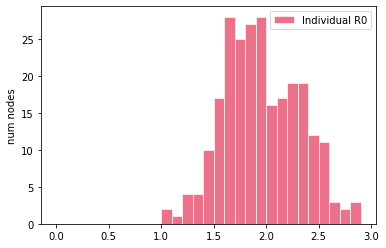

[INTERVENTIONS @ t = 0.29 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.11 (28 (11.20%) infected)]
	1	tested due to symptoms  [+ 1 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	1	tested TOTAL            [+ 1 positive (100.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[I

In [17]:
# Loop to add the no bubble conditions
# Final parameters for the conditions
#Network_size = [20, 50, 100, 250, 500, 1000]
#PCR_Frequency = ['none', 'workday', 'weekly', 'monthly']
#Other options are: everyday, semiweekly & biweekly
#R = [1, 1.5, 2, 2.5, 3]

Network_size = [20, 50, 250]
PCR_Frequency = ['workday', 'weekly']
#R = [1, 1.5, 2, 2.5, 3]

for i in range(len(Network_size)):
    for k in range(len(PCR_Frequency)):
        #for l in range(len(R)):
            simulation_covid(Network_size[i], Network_size [i], PCR_Frequency[k], 2)

In [18]:
# Add none for bubble size if bubble size = network size
combined_df.loc[(combined_df.Bubble_size == combined_df.Network_size),'Bubble_size'] = 'none'

In [19]:
# Check if loop succeeded
combined_df

,Network_size,Bubble_size,PCR_frequency,R,Percentage_infected,Peak_Percentage_Hospitalized,Percentage_Fatality
0,20,5,workday,2,20.0,0.0,0.0
1,20,5,workday,2,20.0,0.0,0.0
2,20,5,workday,2,35.0,0.0,0.0
3,20,5,workday,2,20.0,0.0,0.0
4,20,5,workday,2,35.0,0.0,0.0
...,...,...,...,...,...,...,...
3950,250,none,weekly,2,43.2,0.8,0.4
3951,250,none,weekly,2,48.8,2.4,0.4
3952,250,none,weekly,2,48.4,1.2,0.0
3953,250,none,weekly,2,58.4,0.8,0.0


In [20]:
# Change rest of the colnames for an ordered dataframe
combined_df = combined_df.rename(columns = {"Network_size":"Network size", "Bubble_size":"Bubble size",
                                           "PCR_frequency":"PCR frequency", "Percentage_infected":"Percentage infected",
                                            "Peak_Percentage_Hospitalized":"Peak percentage hospitalized",
                                            "Percentage_Fatality": "Percentage fatality"})


In [21]:
# Calculate the mean and SD per condition for percentage infected
combined_df['Percentage infected'] = combined_df['Percentage infected'].astype(np.int64)

# Create a new dataframe for the means and SD's
final_df = combined_df.groupby(['Network size', 'Bubble size', 'PCR frequency', 'R']).agg({'Percentage infected': 
                                                                                              ['mean', 'std']})

In [22]:
# Make final data frame
final_df.columns = ['mean', 'sd']
final_df = final_df.reset_index()
final_df

,Network size,Bubble size,PCR frequency,R,mean,sd
0,20,5,weekly,2,26.777778,11.531960
1,20,5,workday,2,19.333333,8.556535
2,20,none,weekly,2,26.444444,15.331975
3,20,none,workday,2,25.777778,14.328557
4,50,5,weekly,2,28.266667,10.321614
5,50,5,workday,2,17.911111,5.990402
6,50,25,weekly,2,30.311111,12.070889
7,50,25,workday,2,23.466667,11.451762
8,50,none,weekly,2,42.088889,15.484471
9,50,none,workday,2,25.333333,11.657309


In [ ]:
# Save final data frame as Final data as excel
final_df.to_csv(r'C:\Users\Quint\Documents\Documents\Master Behavioral Data Science\MasterThese\Data\Full_Dataset_thesis_test.csv')

# Save as combined data as combined data as excel
combined_df.to_csv(r'C:\Users\Quint\Documents\Documents\Master Behavioral Data Science\MasterThese\Data\Combined_Dataset_thesis_test.csv')